In [1]:
import numpy as np
from scipy.interpolate import interp1d
from matplotlib import pyplot as plt
import os
from IPython.display import Video
from IPython.display import display
import janus
from scipy.optimize import root
from scipy.signal import find_peaks
colors = [
    "#ff7f0e",
    "#2ca02c",
    "#1f77b4",
    "#d62728",
    "#9467bd",
    "#8c564b",
    "#e377c2",
    "#7f7f7f",
    "#bcbd22",
    "#17becf",
]

random sweep

In [24]:
filebase='data/randomjanus_int'
os.system("awk '{if(FNR==4){print $0}}' %s/*out.dat > %s/orders.dat"%(filebase,filebase))
orders=np.loadtxt('%s/orders.dat'%(filebase))
orders=orders[np.argsort(orders[:,0])]

inds=np.intersect1d(np.where(orders[:,2]>10)[0],np.where(orders[:,2]<250)[0])
print(len(orders),len(inds))

b1=int(np.max(orders[inds][:,4])-np.min(orders[inds][:,4]))+1
b2=int(np.max(orders[inds][:,5])-np.min(orders[inds][:,5]))+1
binds=[1,3,4,5]
bins=[100,100,b1,b2]
counts,bins=np.histogramdd(orders[inds][:,binds],bins=bins)

chimeras=[]
periods=[]
nums=[]

for b in np.transpose(np.where(counts>=1)):
    chimerainds1=np.where(np.all([orders[inds][:,binds[i]]>=bins[i][b[i]] for i in range(4)],axis=0))[0]
    chimerainds2=np.where(np.all([orders[inds][:,binds[i]]<=bins[i][b[i]+1] for i in range(4)],axis=0))[0]
    chimerainds=np.intersect1d(chimerainds1,chimerainds2)
    chimeras=chimeras+[orders[inds[chimerainds],0].astype(int)]
    periods=periods+[int(orders[inds[chimerainds[0]],2]/0.01)]
    nums=nums+[len(chimerainds)]
print(len(chimeras))
chimerainds=np.array([np.where(orders[:,0].astype(int)==ind[0])[0][0] for ind in chimeras])
sortedchimeras=np.flip(np.lexsort(np.concatenate([orders[chimerainds][:,[1,3,2]].T,np.array(nums).reshape(1,-1)])))
# last=np.where(-np.diff(np.array(nums)[sortedchimeras])/np.array(nums)[sortedchimeras][1:]>1)[0][-1]+3
last=64
sortedchimeras=sortedchimeras[:last]

seeds=''
for i in range(len(sortedchimeras)):
    seed=np.array(chimeras[sortedchimeras[i]])[0]
    seeds=seeds+str(seed)+' '
print(seeds)
print(np.transpose([np.array(nums)[sortedchimeras],np.array(periods)[sortedchimeras]]))

os.system('./sweep2.sh %s %f %f "%s"'%(filebase, 0.33, 0.25, seeds))

100999 51651
216
10 3 14 4 5 64 48 26 96 151 1 9 120 422 85 256 680 175 172 152 36 652 103 452 944 697 871 60 573 1022 1485 752 4209 2881 157 856 2965 1228 3403 499 767 3682 3462 823 199 201 693 3671 6799 1058 3503 2923 6855 18587 14304 6017 11943 3570 4879 24185 3933 7477 2586 1015 
[[12287 15031]
 [12011 15031]
 [ 4238 14868]
 [ 4222 14868]
 [ 2445 14864]
 [ 2404 14864]
 [ 1643 14839]
 [ 1592 14839]
 [  781 14848]
 [  752 15057]
 [  750 14848]
 [  737 15057]
 [  641 14060]
 [  610 14060]
 [  595 14863]
 [  573 14863]
 [  429 14177]
 [  413 14177]
 [  376 14847]
 [  374 14847]
 [  322 15031]
 [  283 15031]
 [  262 15082]
 [  246 15082]
 [  230 15031]
 [  209 15031]
 [  209 14846]
 [  207 14846]
 [   99 14838]
 [   95 14838]
 [   89 15082]
 [   79 14976]
 [   70 14846]
 [   68 15031]
 [   65 15031]
 [   63 15031]
 [   62 15082]
 [   61 15031]
 [   61 14976]
 [   59 14846]
 [   49 15031]
 [   48 14838]
 [   46 15031]
 [   40 14838]
 [   35 15031]
 [   33 15075]
 [   29 15031]
 [   29 14

data/randomjanus_int/cycles/499 0.35684843804314603
runtime: 15.796259
data/randomjanus_int/cycles/1228 0.510941782984739
runtime: 17.081525
2923
using initial conditions from file
6855
data/randomjanus_int/cycles/767 0.6787622698746949
runtime: 17.583396
using initial conditions from file
499 0.35684843804314603 148.47000000000003 0.22580075505426236 -6 2
data/randomjanus_int/cycles/3462 0.6799183845655605
runtime: 17.577802
1228 0.510941782984739 150.31999999999994 0.025009297163826216 -4 -2
data/randomjanus_int/cycles/3403 0.4715868850607152
runtime: 18.931082
data/randomjanus_int/cycles/3682 0.35134911898947185
runtime: 18.611478
18587
data/randomjanus_int/cycles/3671 0.15257755178028604
runtime: 16.351915
using initial conditions from file
3462 0.6799183845655605 150.31999999999994 0.004498963256628477 -2 2
767 0.6787622698746949 150.31999999999994 0.006511672050016737 -2 -30
data/randomjanus_int/cycles/823 0.3513490080593267
runtime: 19.734318
data/randomjanus_int/cycles/3503 0.4

0

1 [ 1.00000000e+01  7.73656720e-01  1.50320000e+02  6.96354903e-03
 -1.00000000e+00  2.00000000e+00] 12287


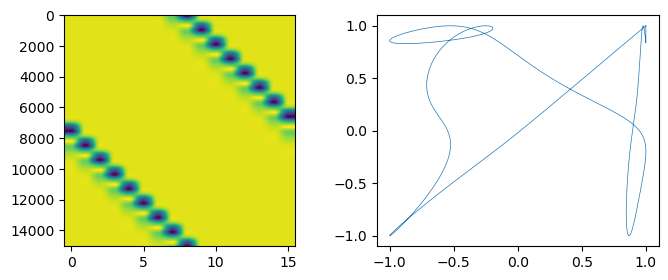

2 [ 3.00000000e+00  7.73654515e-01  1.50320000e+02  6.96058501e-03
 -1.00000000e+00 -2.00000000e+00] 12011


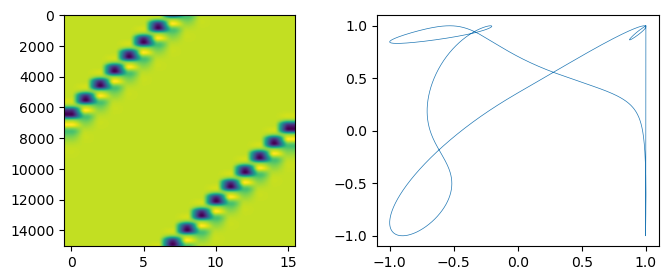

3 [ 1.40000000e+01  6.87676178e-01  1.48690000e+02  1.64853541e-02
 -2.00000000e+00 -2.00000000e+00] 4238


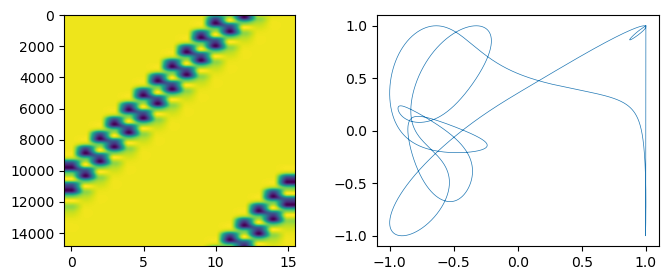

4 [ 4.00000000e+00  6.87679299e-01  1.48690000e+02  1.64896903e-02
 -2.00000000e+00  2.00000000e+00] 4222


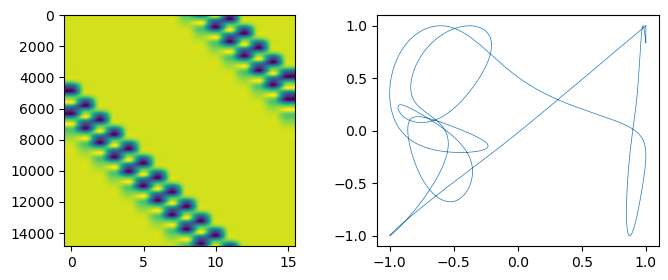

5 [ 5.00000000e+00  6.02617170e-01  1.48650000e+02  2.53250213e-02
 -3.00000000e+00  2.00000000e+00] 2445


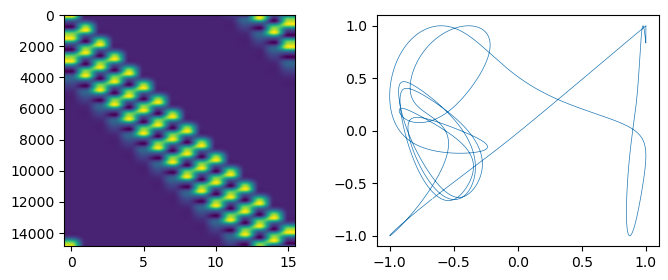

6 [ 6.40000000e+01  6.02617291e-01  1.48650000e+02  2.53254511e-02
 -3.00000000e+00 -2.00000000e+00] 2404


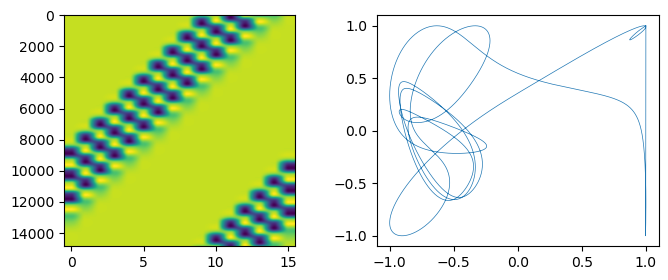

7 [ 48.           0.53479326 148.4          0.43900331  -2.
   2.        ] 1643


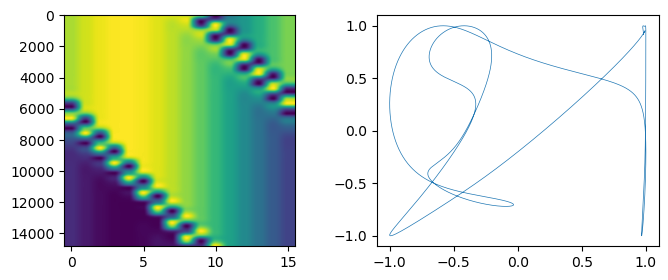

8 [ 26.           0.53479343 148.4          0.4390027   -1.
  -2.        ] 1592


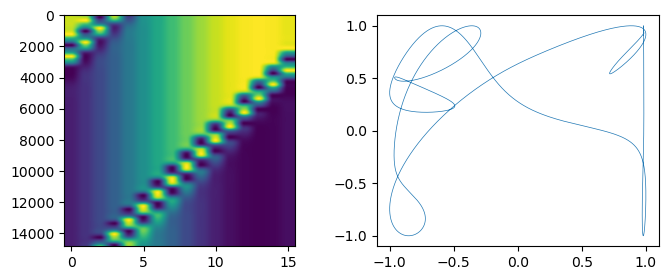

9 [ 96.           0.50826518 148.49         0.47609815  -3.
   2.        ] 781


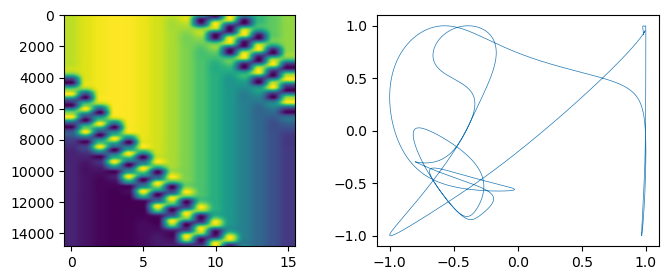

10 [151.           0.53332713 150.57        -0.3480209   -1.
   2.        ] 752


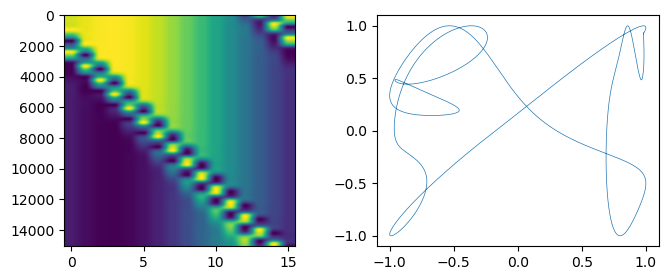

11 [  1.           0.50825905 148.49         0.47610732  -2.
  -2.        ] 750


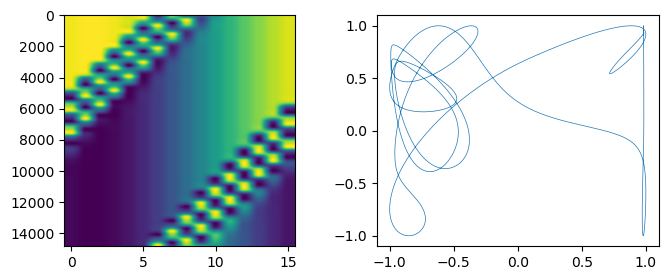

12 [  9.           0.53332781 150.57        -0.34801954  -2.
  -2.        ] 737


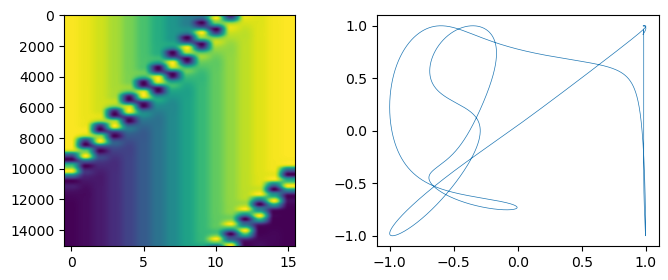

13 [120.           0.54853304 140.61         0.41857042  -1.
   2.        ] 641


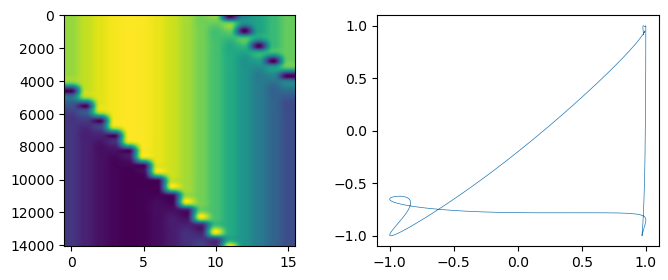

14 [ 4.22000000e+02  5.48534468e-01  1.40610000e+02  4.18567448e-01
  0.00000000e+00 -2.00000000e+00] 610


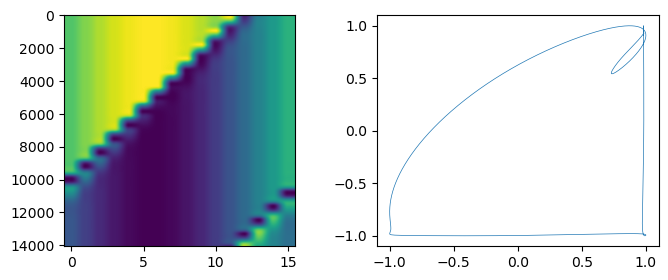

15 [ 8.50000000e+01  4.31566090e-01  1.48640000e+02  3.48831838e-02
 -5.00000000e+00  2.00000000e+00] 595


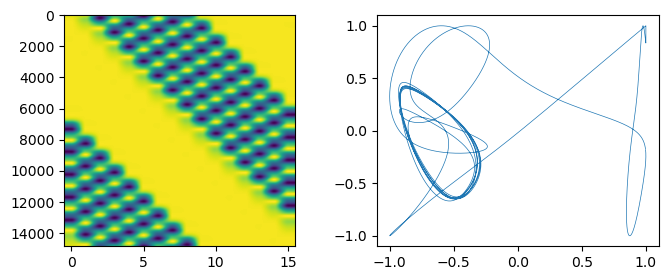

16 [ 2.56000000e+02  4.31564819e-01  1.48640000e+02  3.48859099e-02
 -5.00000000e+00 -2.00000000e+00] 573


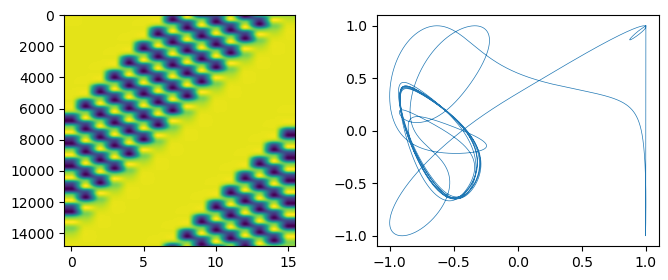

17 [ 6.80000000e+02  5.47102750e-01  1.41780000e+02 -3.23743984e-01
 -1.00000000e+00 -2.00000000e+00] 429


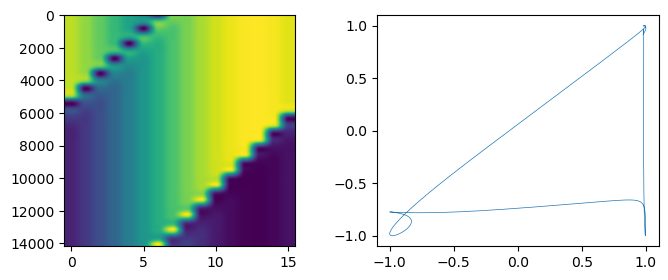

18 [175.           0.54710292 141.78        -0.32374361   0.
   2.        ] 413


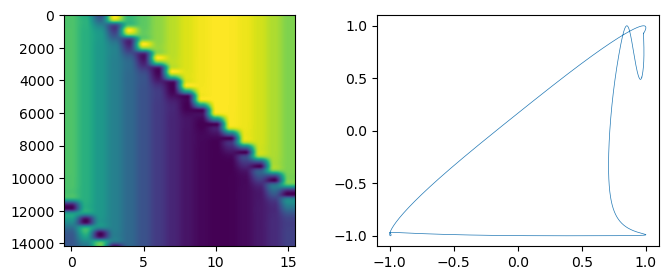

19 [172.           0.46836265 148.48         0.45494524  -4.
   2.        ] 376


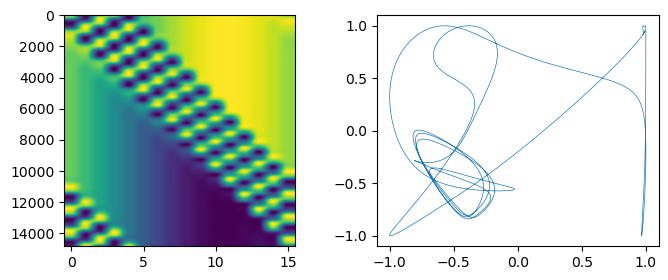

20 [152.           0.46836289 148.48         0.45494257  -3.
  -2.        ] 374


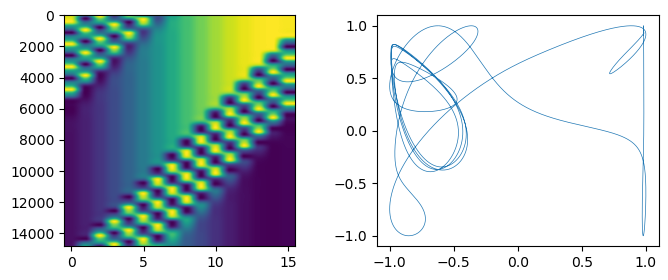

21 [ 3.60000000e+01  6.80529873e-01  1.50320000e+02  9.72833042e-03
 -2.00000000e+00 -2.00000000e+00] 322


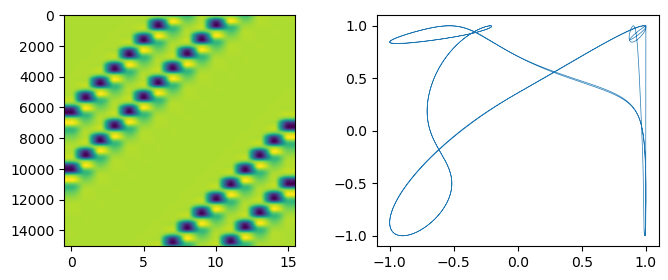

22 [ 6.52000000e+02  6.80529766e-01  1.50320000e+02  9.72790643e-03
 -2.00000000e+00  2.00000000e+00] 283


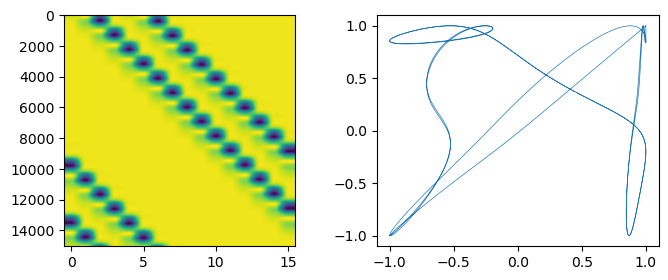

23 [103.           0.50712081 150.83        -0.39440092  -3.
  -2.        ] 262


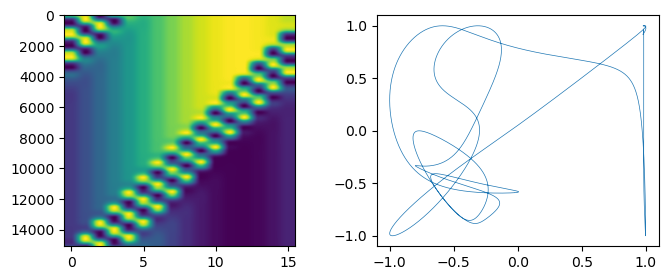

24 [ 4.52000000e+02  5.07120554e-01  1.50830000e+02 -3.94401252e-01
 -2.00000000e+00  2.00000000e+00] 246


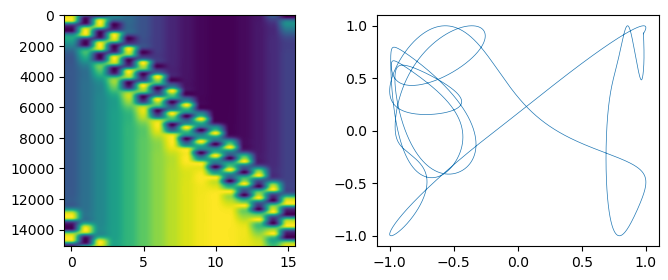

25 [ 9.44000000e+02  5.93872250e-01  1.50320000e+02  1.77499082e-02
 -3.00000000e+00  2.00000000e+00] 230


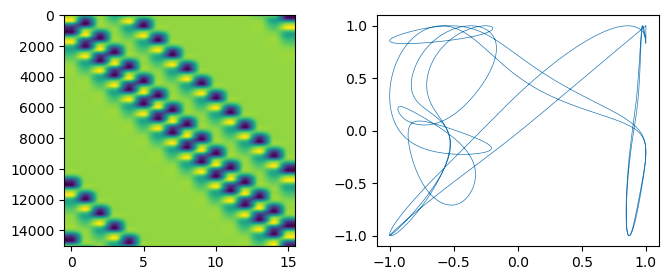

26 [ 6.97000000e+02  5.93870374e-01  1.50320000e+02  1.77508972e-02
 -3.00000000e+00 -2.00000000e+00] 209


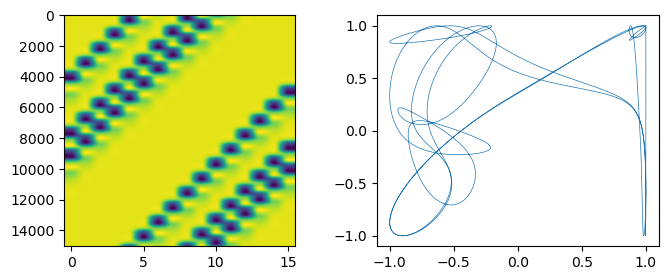

27 [ 8.71000000e+02  4.17928012e-01  1.48470000e+02  3.44793526e-01
 -4.00000000e+00 -2.00000000e+00] 209


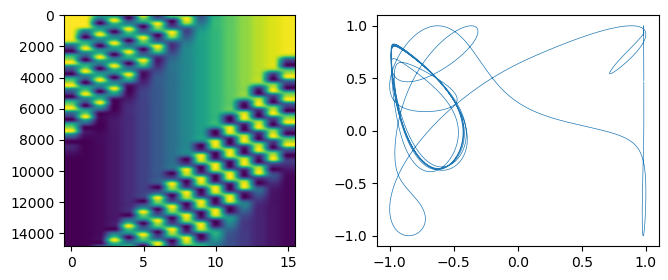

28 [ 60.           0.41792842 148.47         0.34478236  -5.
   2.        ] 207


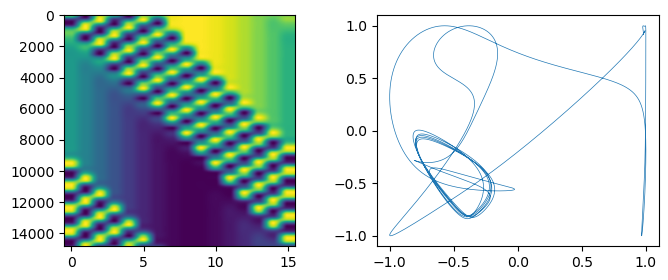

29 [ 5.73000000e+02  4.92865483e-01  1.48390000e+02  4.32861236e-02
 -2.00000000e+00 -2.00000000e+00] 99


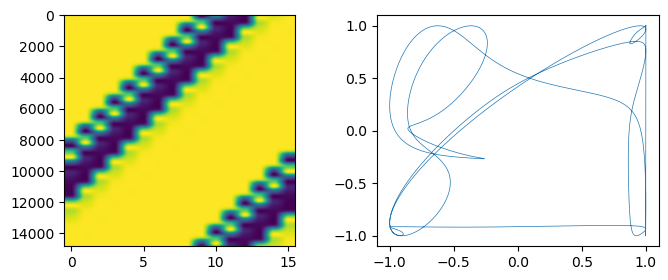

30 [ 1.02200000e+03  4.92866593e-01  1.48390000e+02  4.32967944e-02
 -2.00000000e+00  2.00000000e+00] 95


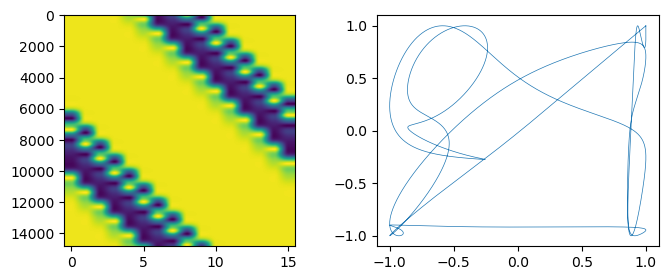

31 [ 1.48500000e+03  5.07127187e-01  1.50830000e+02 -3.94392287e-01
 -3.00000000e+00 -2.00000000e+00] 89


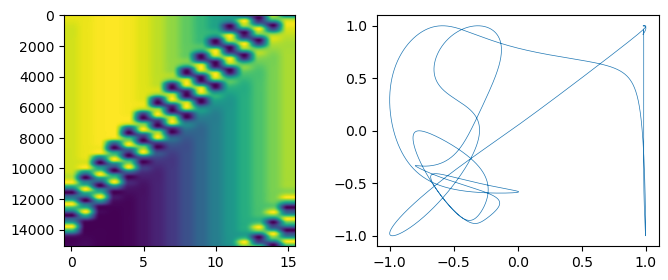

32 [ 7.52000000e+02  4.71580892e-01  1.49770000e+02  3.96435761e-01
 -3.00000000e+00  2.00000000e+00] 79


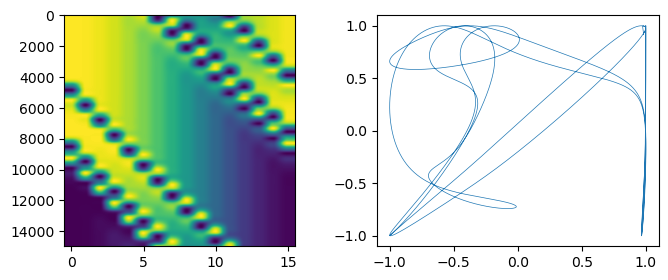

33 [ 4.20900000e+03  3.56847115e-01  1.48470000e+02  2.25801393e-01
 -5.00000000e+00 -2.00000000e+00] 70


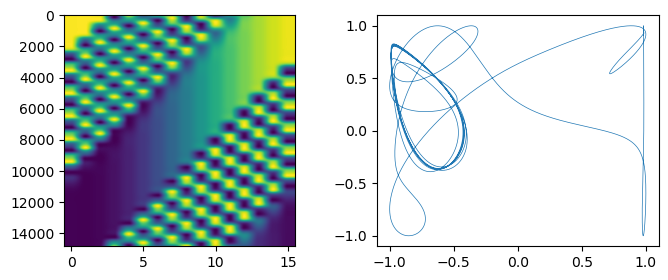

34 [ 2.88100000e+03  5.10937943e-01  1.50320000e+02  2.50147914e-02
 -4.00000000e+00  2.00000000e+00] 68


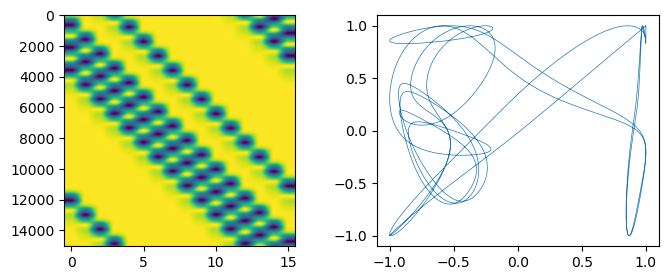

35 [ 1.57000000e+02  6.80156351e-01  1.50310000e+02  5.37053858e-03
 -2.00000000e+00 -2.00000000e+00] 65


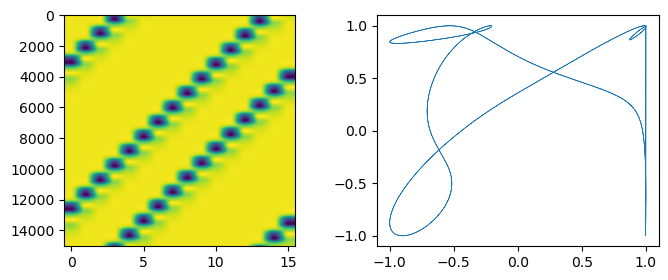

36 [ 8.56000000e+02  6.78568570e-01  1.50320000e+02  6.71237956e-03
 -2.00000000e+00  3.00000000e+01] 63


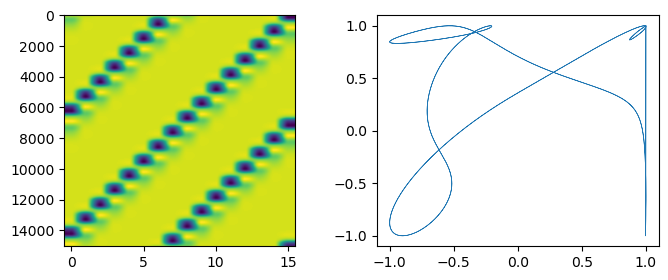

37 [ 2.96500000e+03  5.07126923e-01  1.50830000e+02 -3.94392685e-01
 -2.00000000e+00  2.00000000e+00] 62


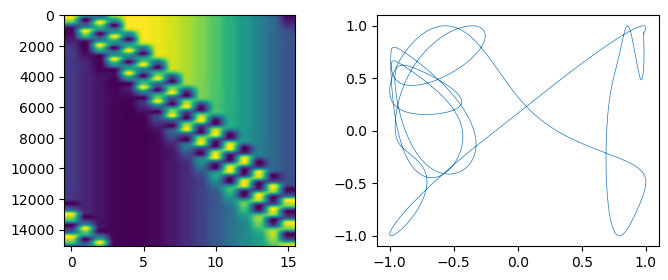

38 [ 1.22800000e+03  5.10936318e-01  1.50320000e+02  2.50081851e-02
 -4.00000000e+00 -2.00000000e+00] 61


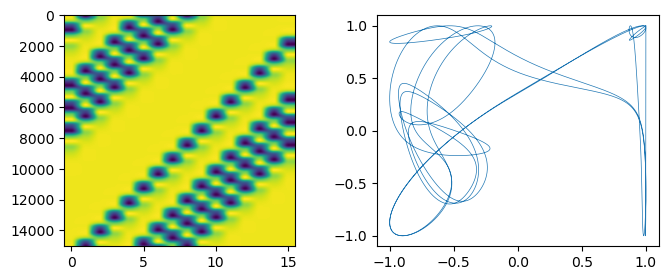

39 [ 3.40300000e+03  4.71583708e-01  1.49770000e+02  3.96433534e-01
 -2.00000000e+00 -2.00000000e+00] 61


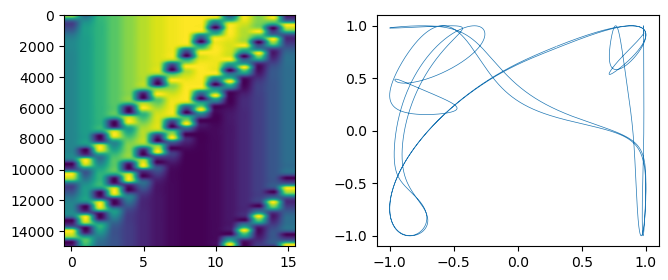

40 [ 4.99000000e+02  3.56850156e-01  1.48470000e+02  2.25796297e-01
 -6.00000000e+00  2.00000000e+00] 59


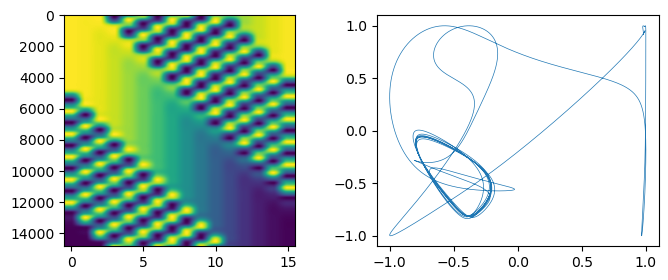

41 [ 7.67000000e+02  6.78772594e-01  1.50320000e+02  6.49797423e-03
 -2.00000000e+00 -3.00000000e+01] 49


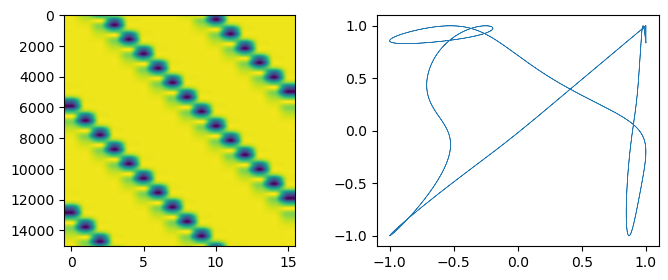

42 [ 3.68200000e+03  3.51347352e-01  1.48390000e+02  5.38670205e-02
 -3.00000000e+00  2.00000000e+00] 48


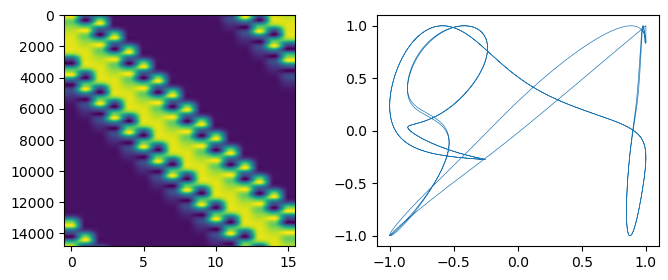

43 [ 3.46200000e+03  6.79961231e-01  1.50320000e+02  4.40752041e-03
 -2.00000000e+00  2.00000000e+00] 46


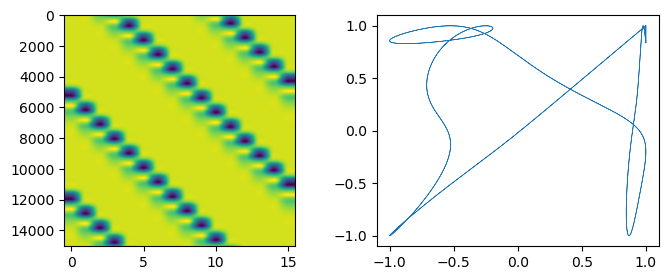

44 [ 8.23000000e+02  3.51347771e-01  1.48390000e+02  5.38778302e-02
 -3.00000000e+00 -2.00000000e+00] 40


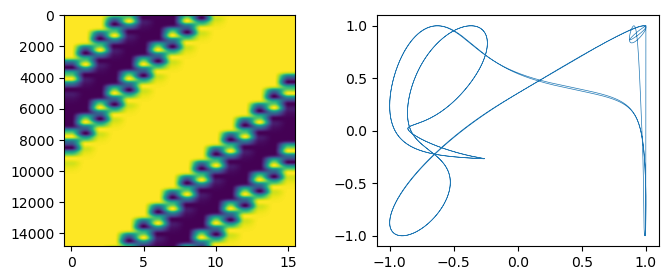

45 [ 1.99000000e+02  6.79611272e-01  1.50320000e+02  4.12010001e-03
 -2.00000000e+00  3.00000000e+01] 35


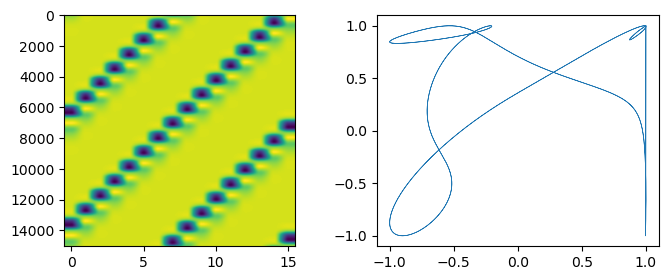

46 [ 2.01000000e+02  9.77457257e-02  1.50760000e+02  7.25826412e-01
 -2.00000000e+00  2.00000000e+00] 33


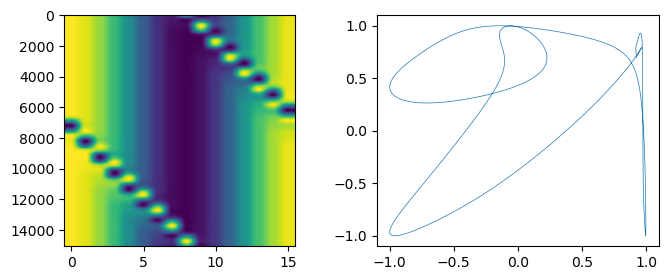

47 [ 6.93000000e+02  6.79777593e-01  1.50320000e+02  3.69638637e-03
 -2.00000000e+00 -3.00000000e+01] 29


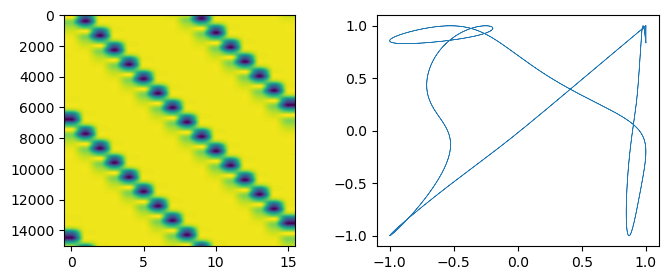

48 [ 3.67100000e+03  1.52791725e-01  1.48390000e+02  6.42542046e-02
 -3.00000000e+00 -2.00000000e+00] 29


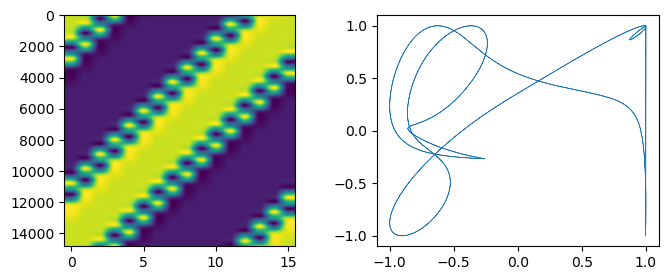

49 [ 6.79900000e+03  9.77483904e-02  1.50760000e+02  7.25821418e-01
  0.00000000e+00 -2.00000000e+00] 27


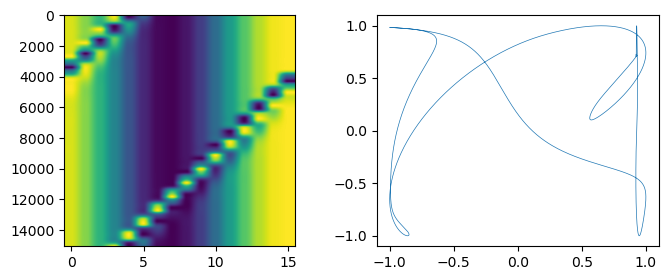

50 [ 1.05800000e+03  2.66535372e-01  1.48390000e+02  5.39190776e-02
 -4.00000000e+00 -2.00000000e+00] 23


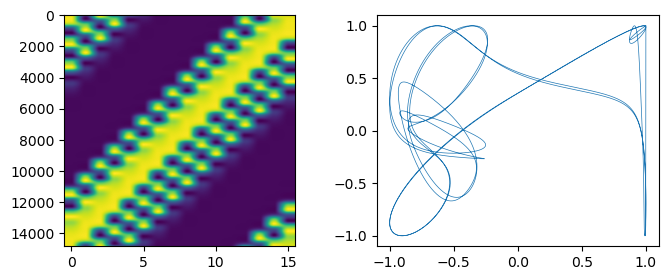

51 [ 3.50300000e+03  4.75030965e-01  1.52360000e+02 -3.17155844e-01
 -2.00000000e+00  2.00000000e+00] 21


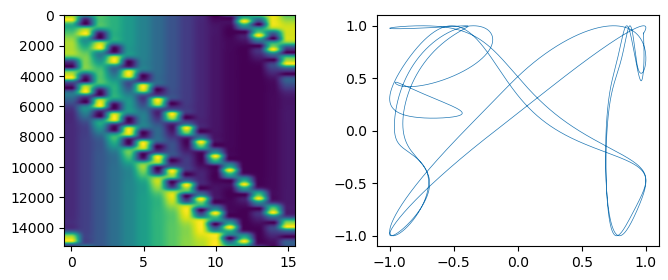

52 [ 2.92300000e+03  2.71369205e-01  1.48620000e+02  5.56353278e-02
 -4.00000000e+00  2.00000000e+00] 21


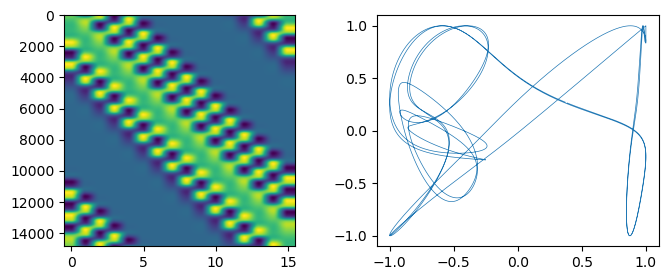

53 [ 6.85500000e+03  4.75029204e-01  1.52360000e+02 -3.17156998e-01
 -3.00000000e+00 -2.00000000e+00] 18


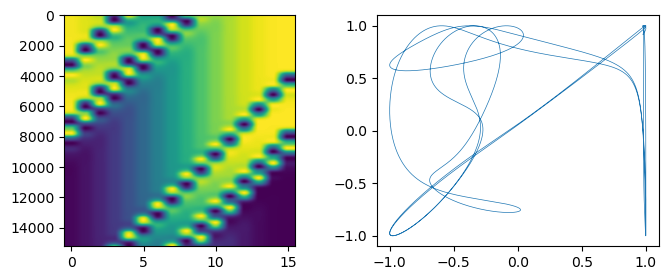

54 [ 1.85870000e+04  1.52064873e-01  1.48390000e+02  6.42859125e-02
 -3.00000000e+00  2.00000000e+00] 18


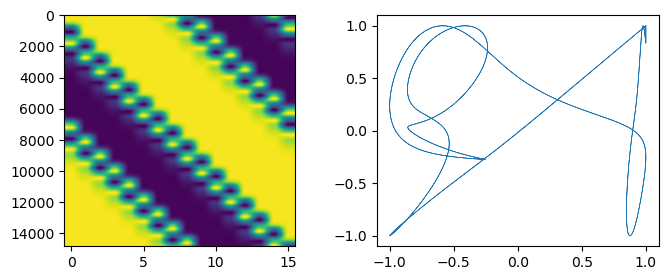

55 [ 1.43040000e+04  5.07391467e-01  1.48700000e+02  4.35897836e-03
 -4.00000000e+00 -2.00000000e+00] 15


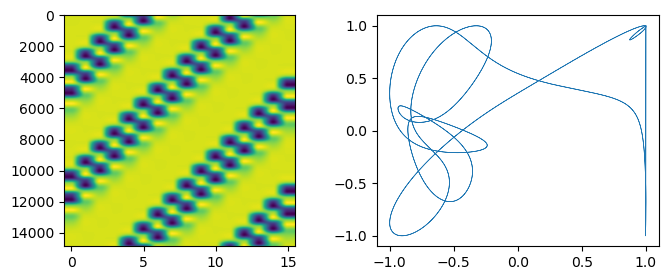

56 [ 6.01700000e+03  2.88200930e-01  1.48480000e+02  1.31860262e-01
 -6.00000000e+00 -2.00000000e+00] 15


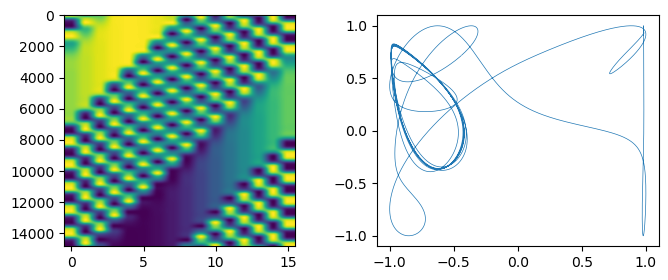

57 [ 1.1943000e+04  1.3009681e-01  1.4862000e+02  6.0726576e-02
 -4.0000000e+00  2.0000000e+00] 13


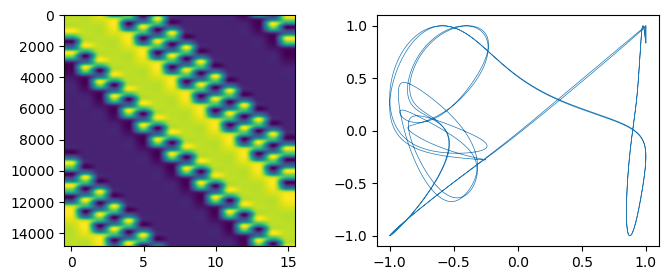

58 [ 3.57000000e+03  3.09693655e-01  1.39850000e+02  6.01794652e-02
 -1.00000000e+00 -2.00000000e+00] 13


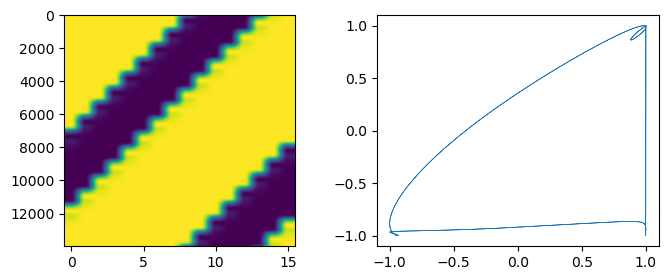

59 [ 4.87900000e+03  4.44461200e-01  1.48450000e+02  3.64804144e-01
 -2.00000000e+00 -2.00000000e+00] 12


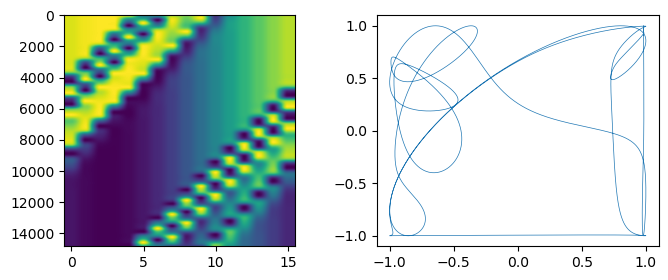

60 [ 2.41850000e+04  4.21711156e-01  1.48730000e+02  9.42493584e-03
 -5.00000000e+00 -2.00000000e+00] 11


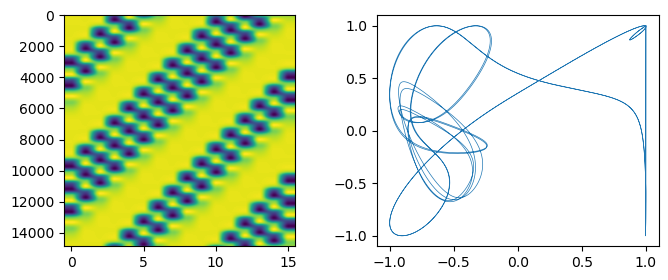

61 [ 3.93300000e+03  4.44464545e-01  1.48450000e+02  3.64801012e-01
 -3.00000000e+00  2.00000000e+00] 11


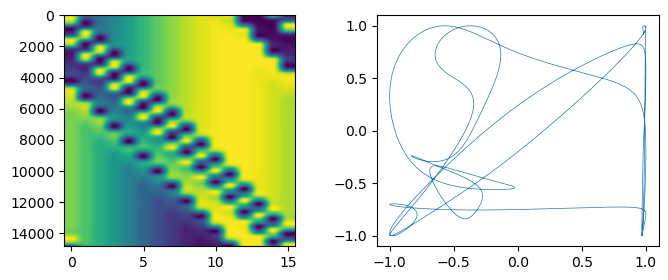

62 [ 7.47700000e+03  5.09245387e-01  1.39840000e+02  4.30362558e-02
 -1.00000000e+00  2.00000000e+00] 11


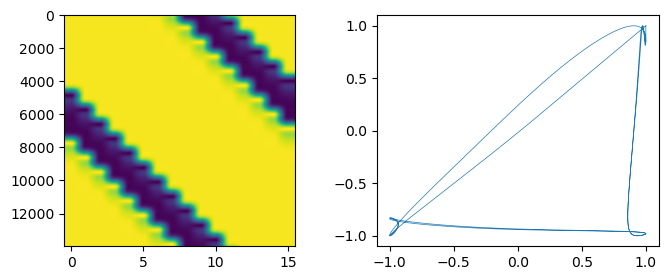

63 [ 2.58600000e+03  4.34717293e-01  1.49770000e+02  3.65488295e-01
 -4.00000000e+00  2.00000000e+00] 10


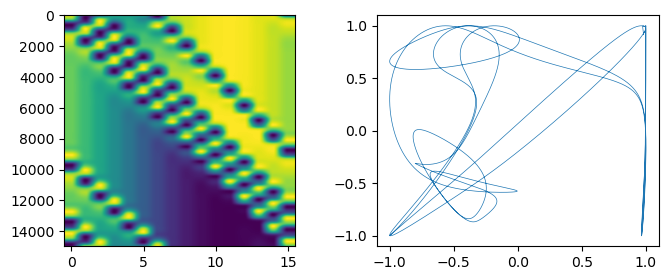

64 [ 1.01500000e+03  1.26864037e-01  1.48620000e+02  6.08367484e-02
 -4.00000000e+00 -2.00000000e+00] 10


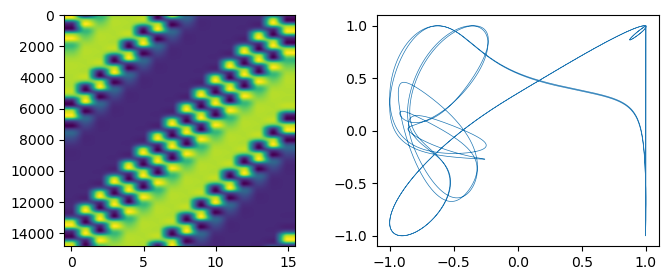

In [28]:
filebase='data/randomjanus_int'
filebase2='data/janus_int'
for i in range(len(sortedchimeras)):
    print(i+1,orders[chimerainds[sortedchimeras[i]]], nums[sortedchimeras[i]])
    phases=np.loadtxt('%s/cycles/%icycle.dat'%(filebase,np.array(chimeras[sortedchimeras[i]])[0]))

    N=int((phases.shape[1]-1+2)/4)    
    t=phases[:,0]
    x=phases[:,1:N]
    y=phases[:,N:2*N-1]
    u=phases[:,2*N-1:3*N-1]
    v=phases[:,3*N-1:]
    phi=np.unwrap(np.arctan2(y,x),axis=0)

    phi=np.concatenate([np.zeros(t.shape).reshape(-1,1),phi],axis=1)
    theta=np.unwrap(np.arctan2(v,u),axis=0)
    Theta=1/(2*N)*(np.sum(theta,axis=1)+np.sum(phi,axis=1))[:,np.newaxis]
    theta=np.mod(theta-Theta+np.pi,2*np.pi)-np.pi
    phi=np.mod(phi-Theta+np.pi,2*np.pi)-np.pi
    period=periods[sortedchimeras[i]]
    plt.subplots(1,2,figsize=(8,3))
    plt.subplot(1,2,1)
    plt.imshow(np.cos(phi),aspect=N/period)
    plt.subplot(1,2,2)
    plt.plot(np.cos(phi[:,1]-phi[:,0]),np.cos(phi[:,2]-phi[:,0]),lw=0.5,alpha=1)
    
    plt.clim(-1,1)
    plt.show()
    if not os.path.exists('%s/%i'%(filebase2,i+1)):
        os.mkdir('%s/%i'%(filebase2,i+1))
    os.system('cp %s/cycles/%icycle.dat %s/%i/cycle.dat'%(filebase,np.array(chimeras[sortedchimeras[i]])[0],filebase2,i+1))


1


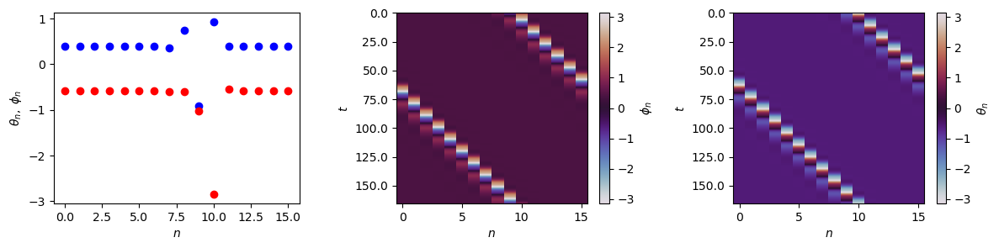

2


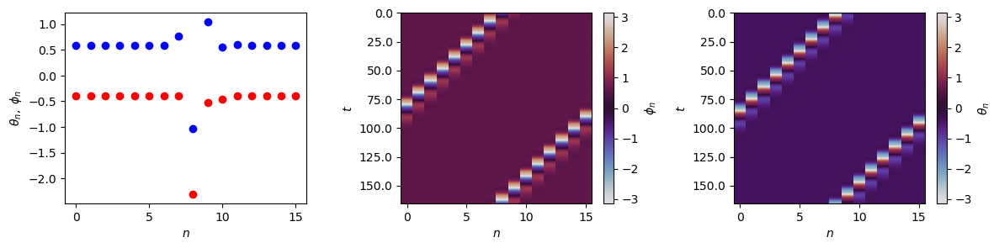

3


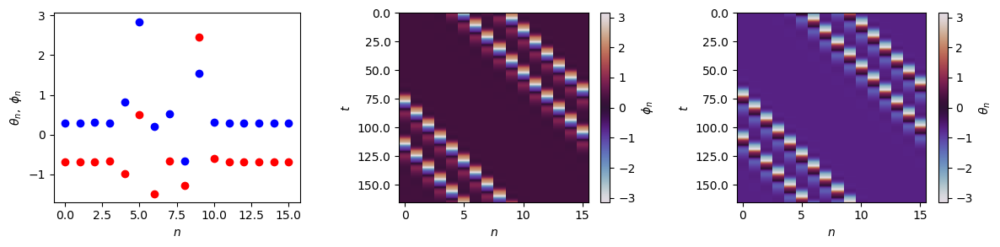

4


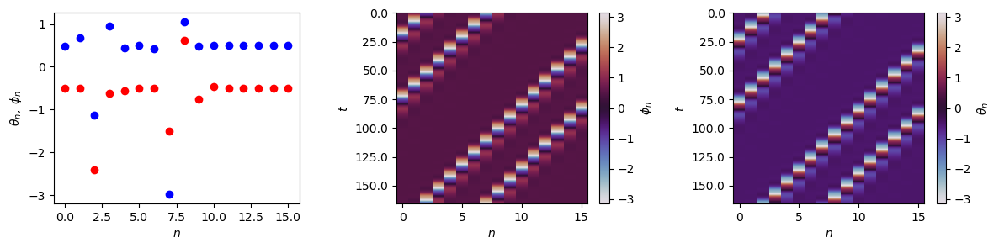

5


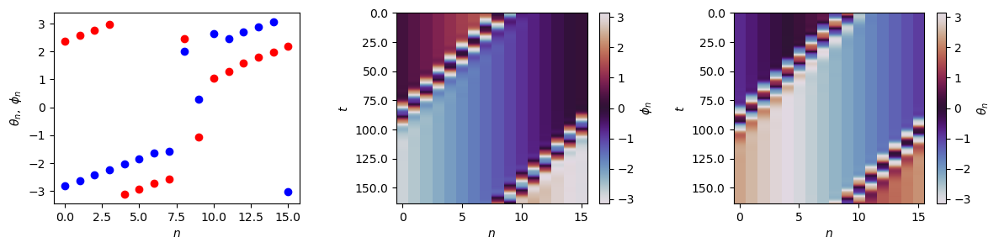

6


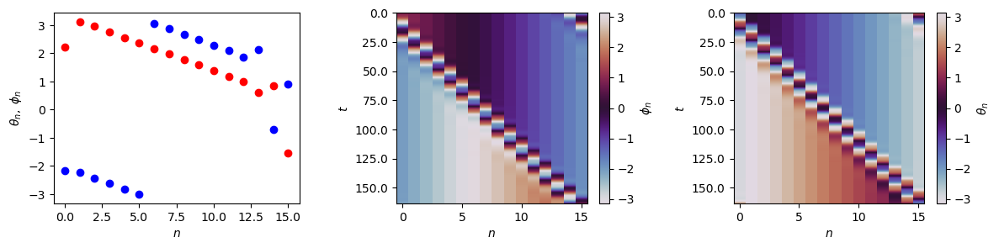

7


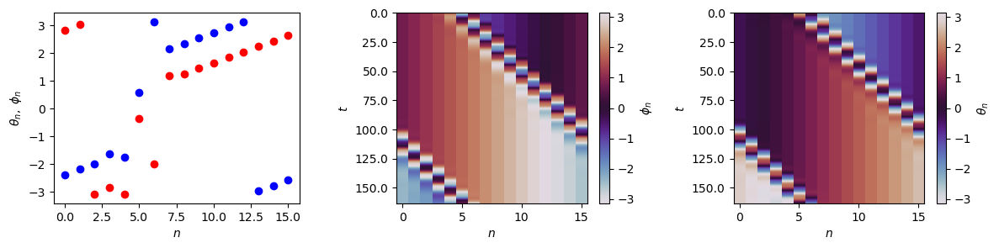

8


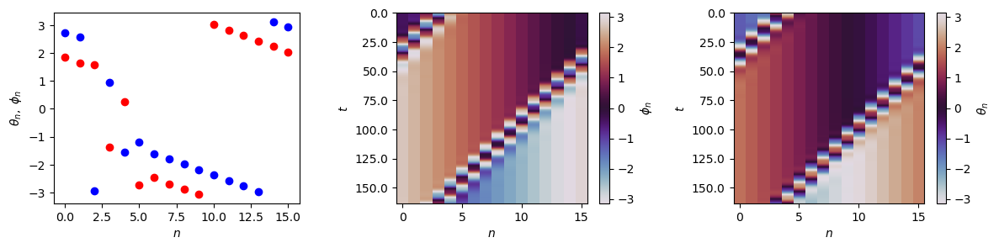

9


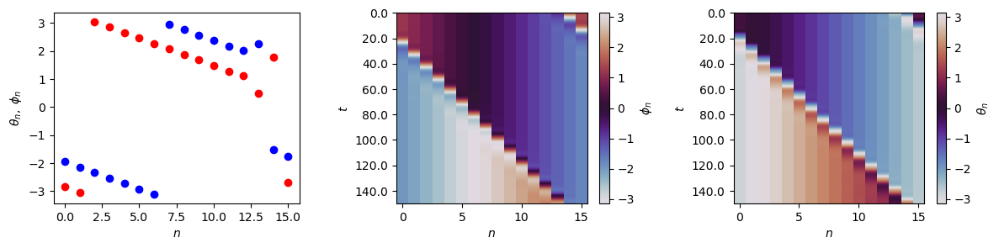

10


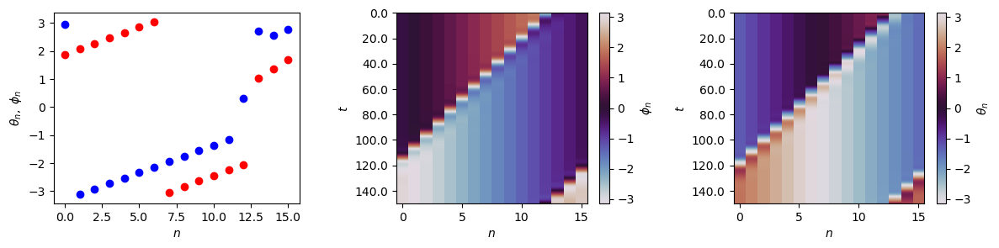

11


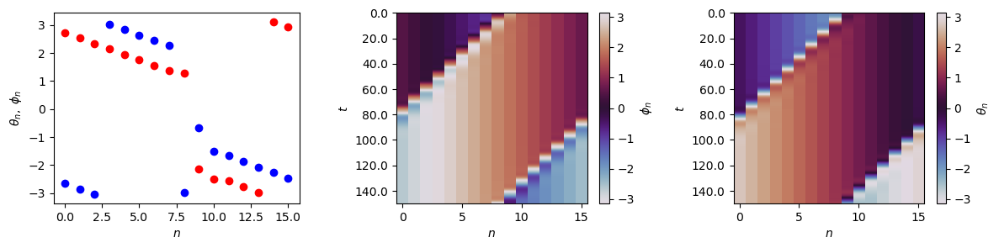

12


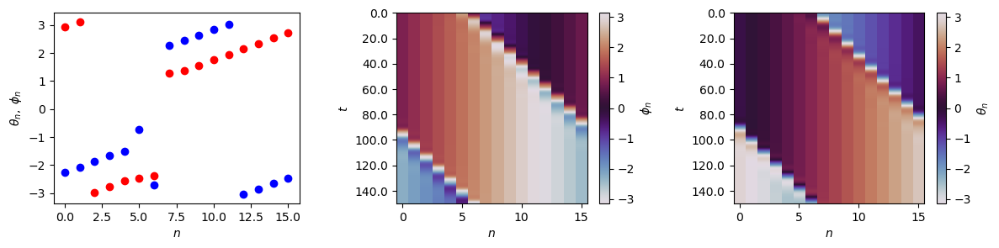

13


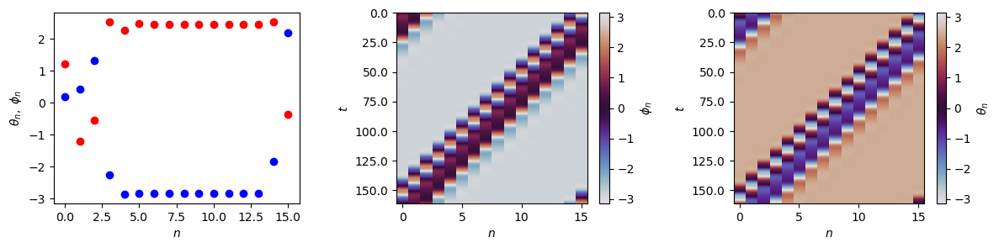

14


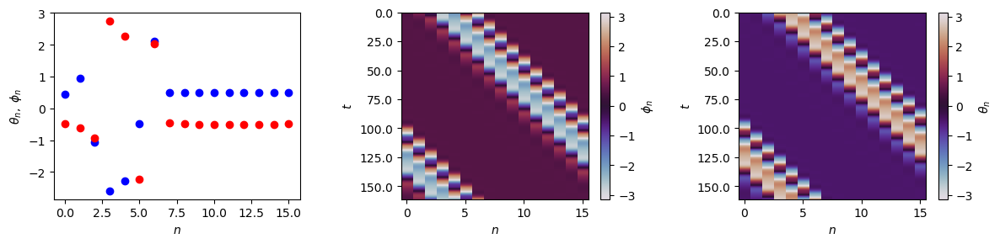

15


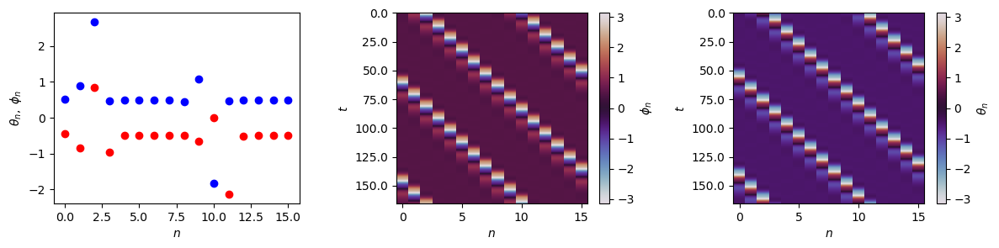

16


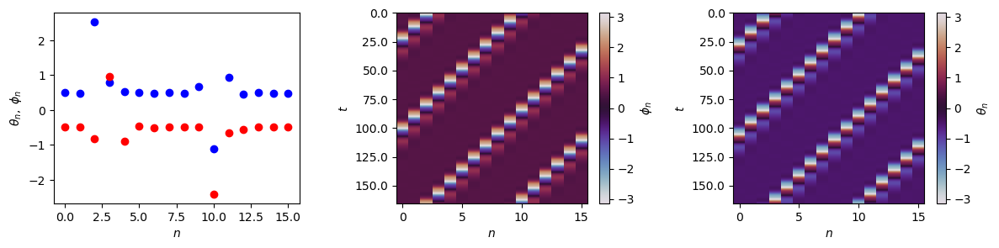

17


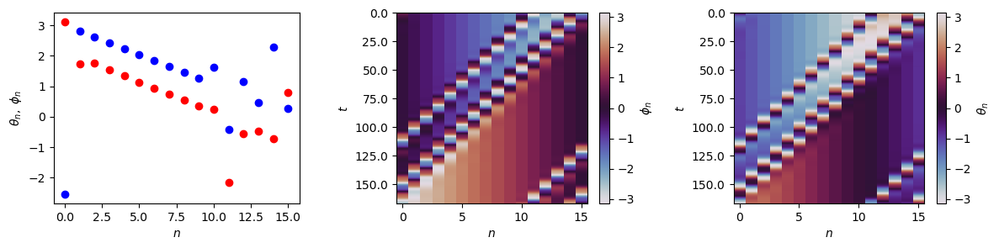

18


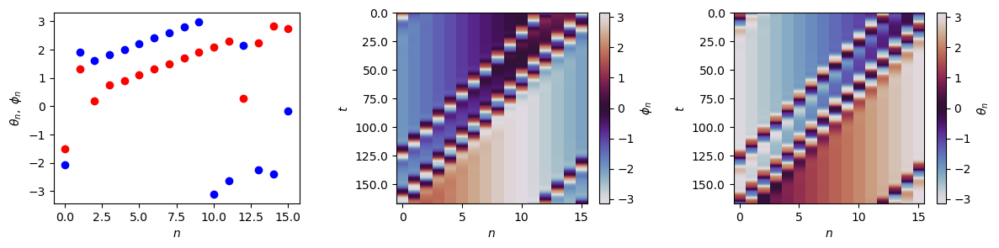

19


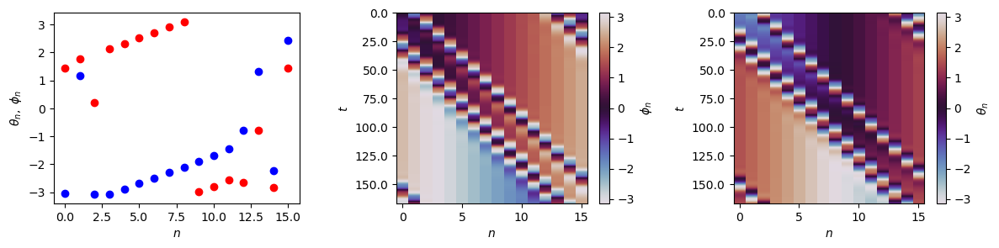

20


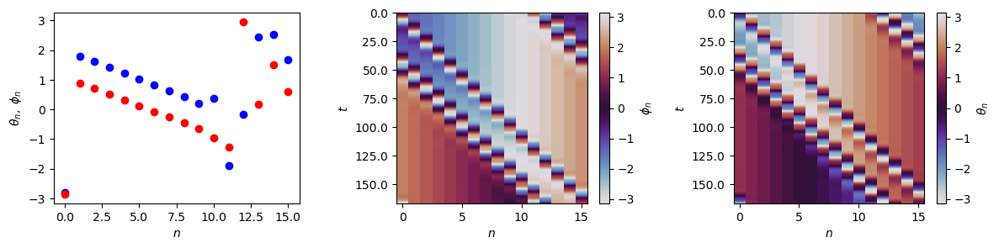

21


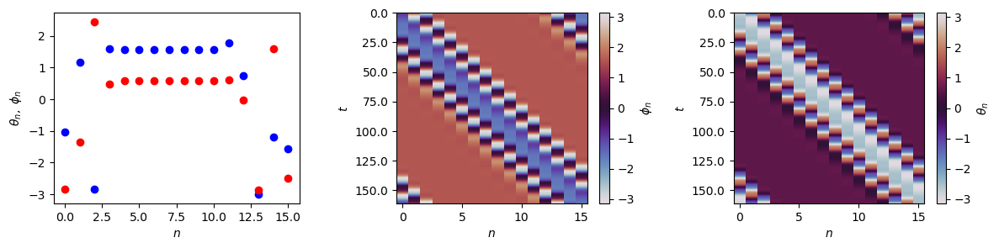

22


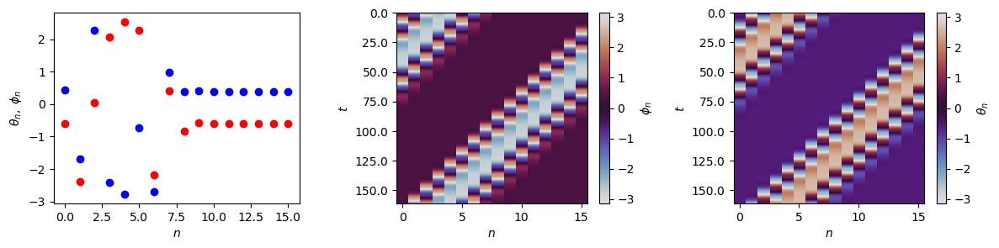

23


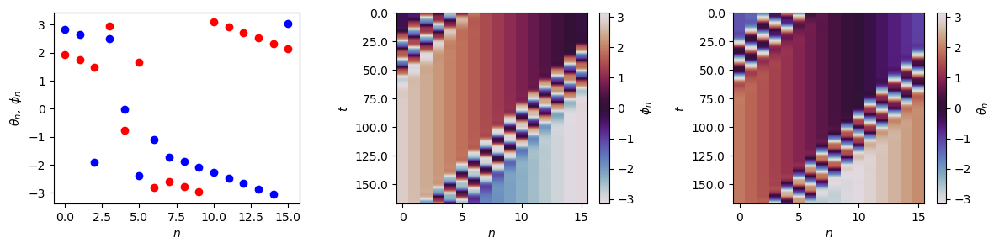

24


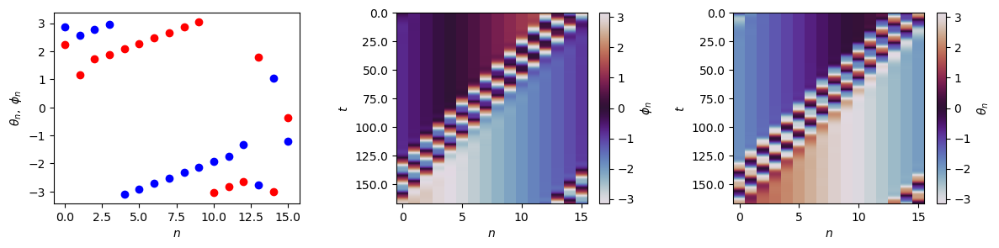

25


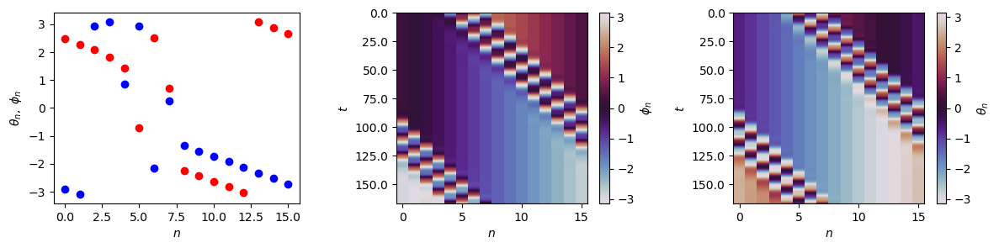

26


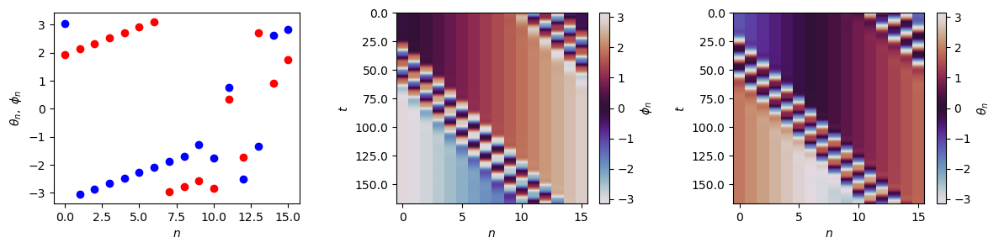

27


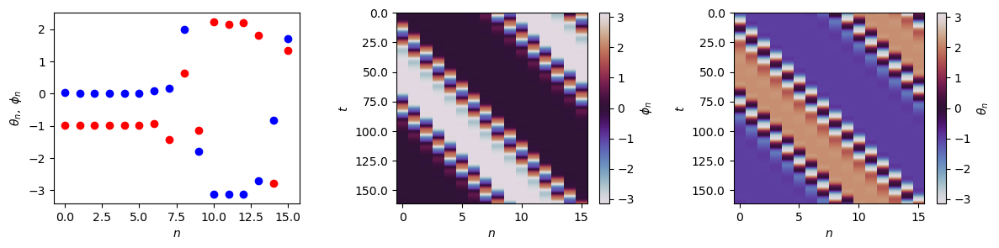

28


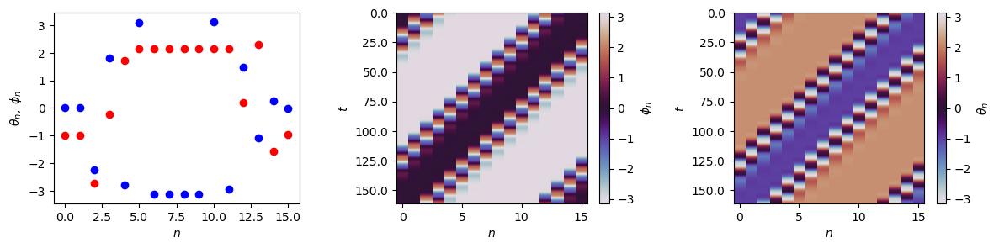

29


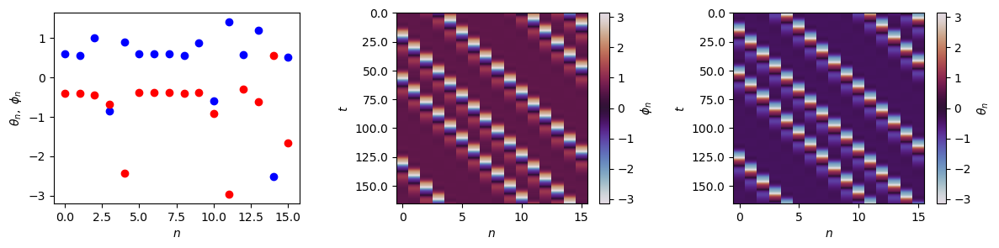

30


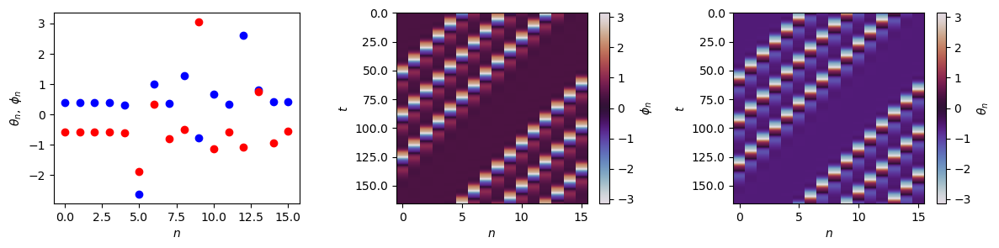

31


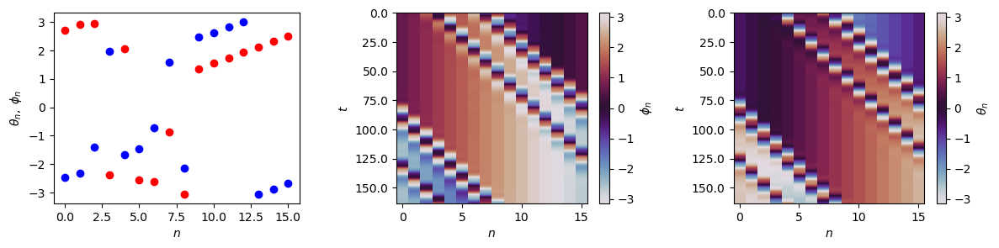

32


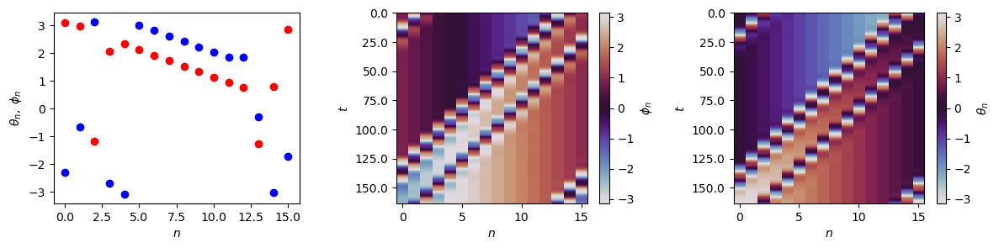

33


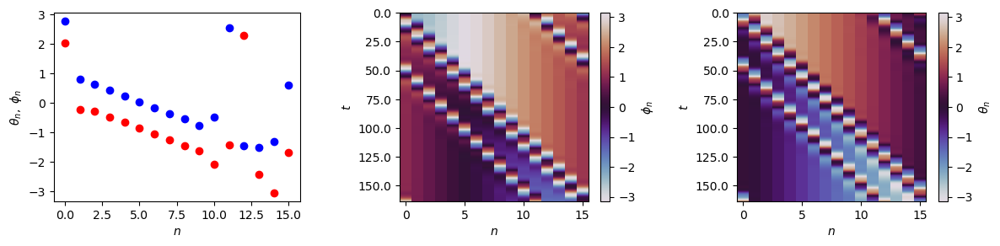

34


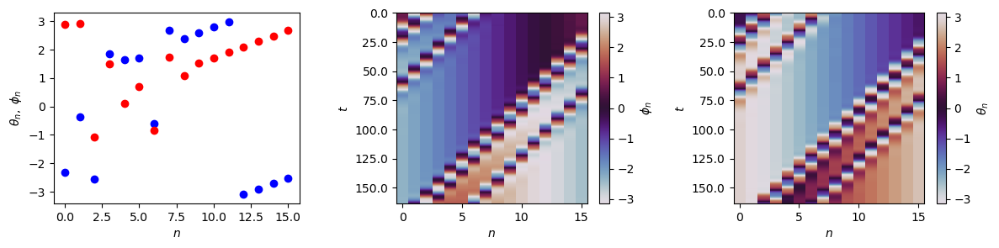

35


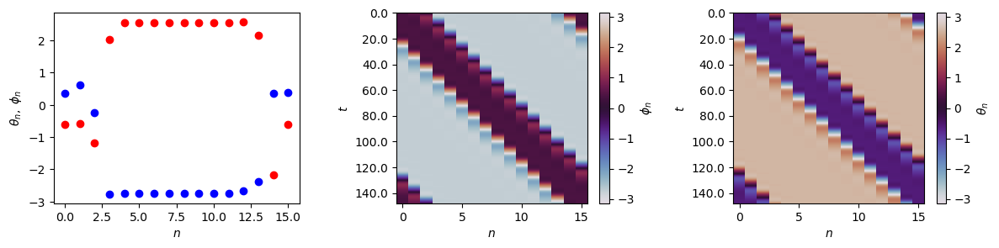

36


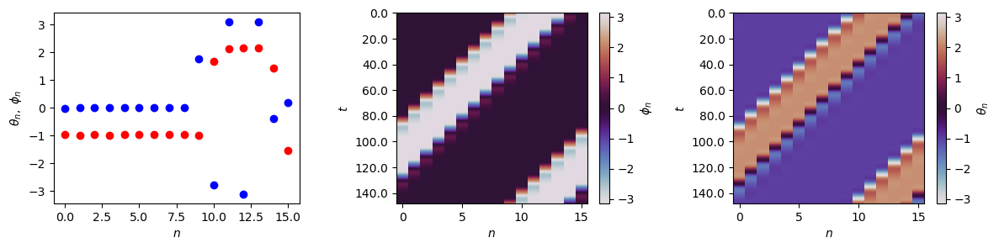

37


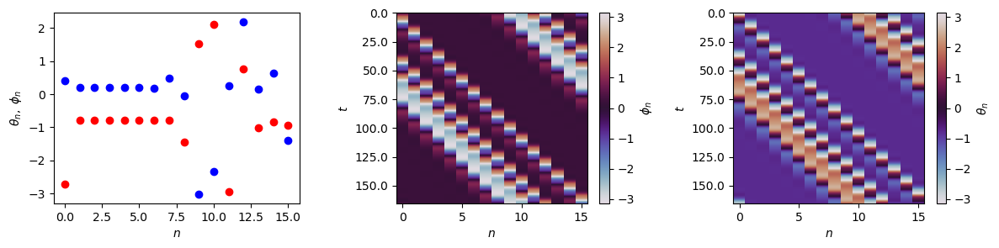

38


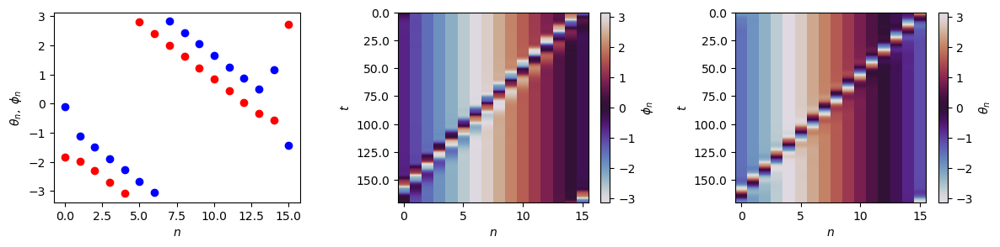

39


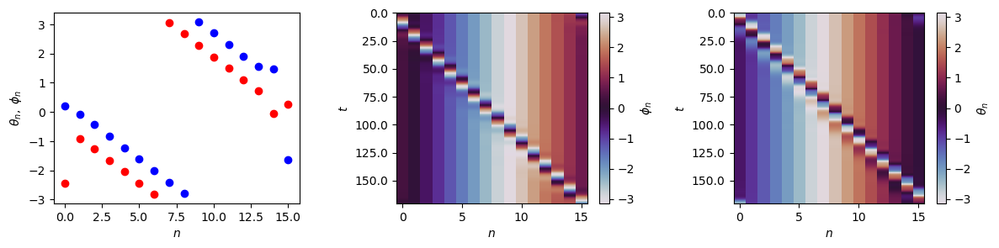

40


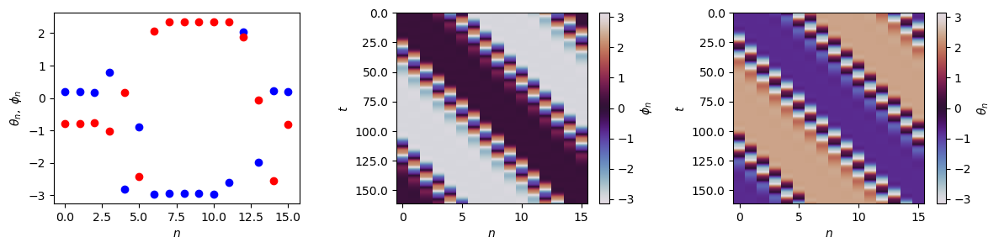

41


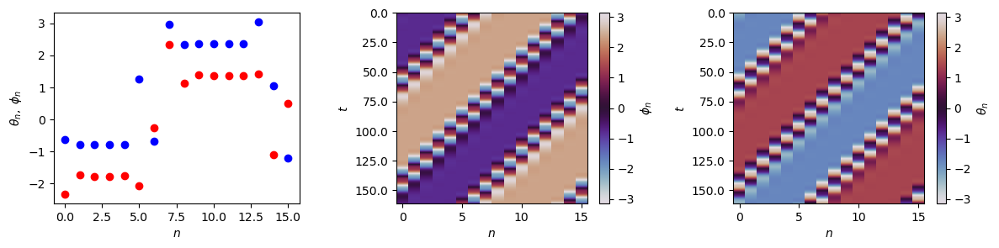

42


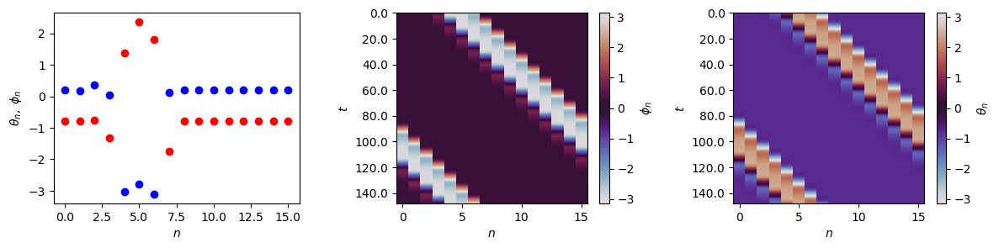

43


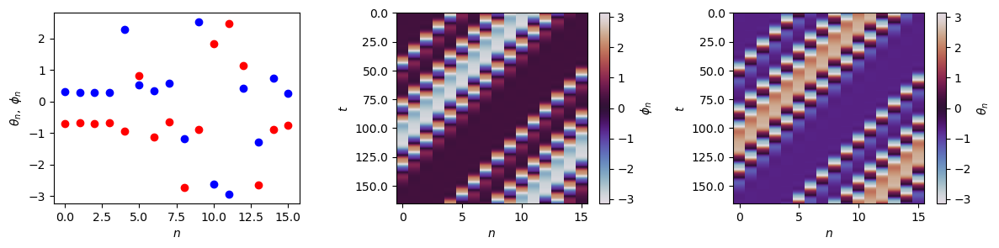

44


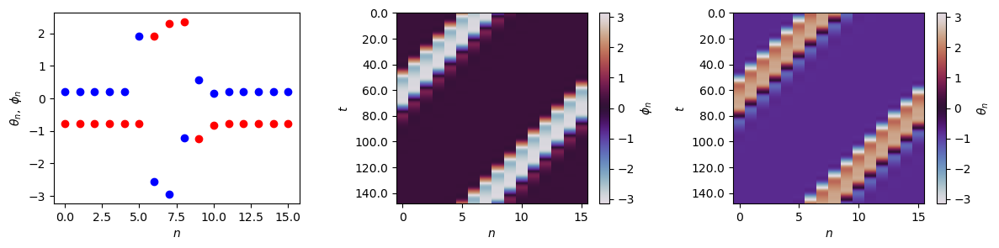

45


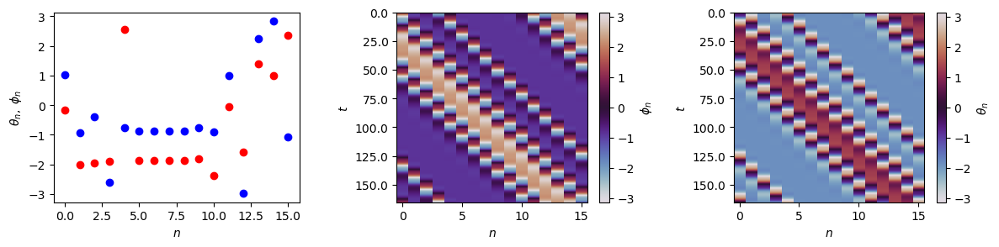

46


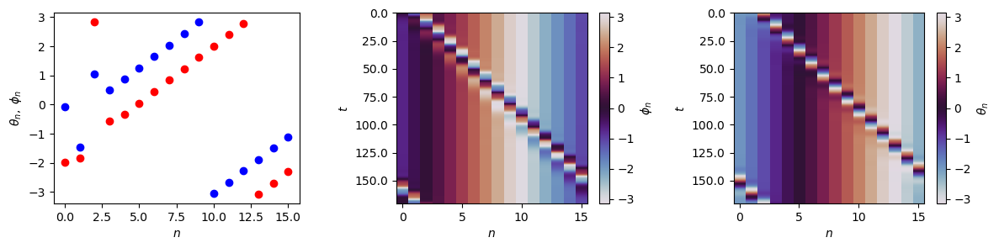

47


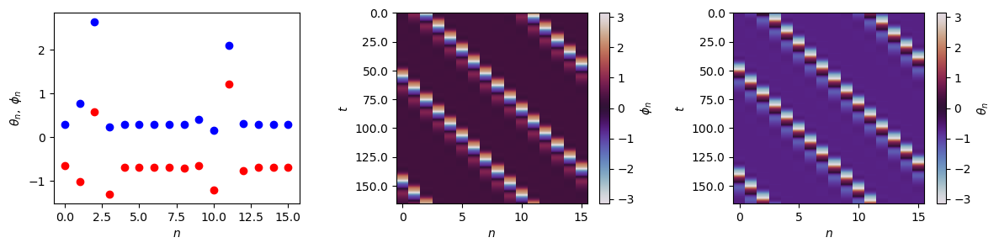

48


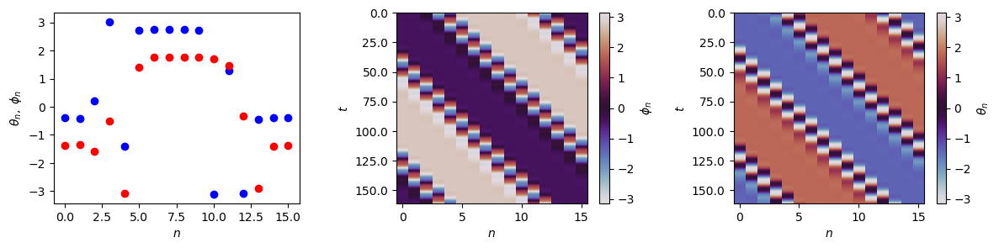

49


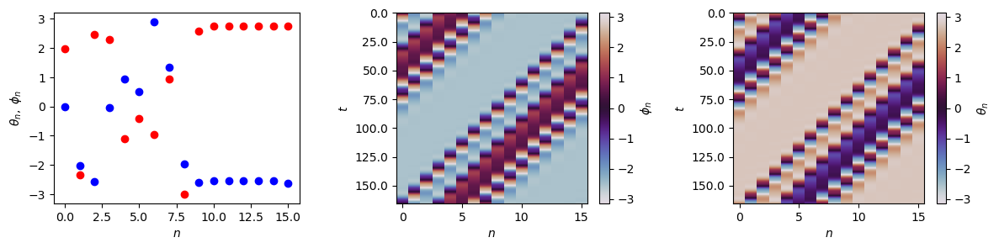

50


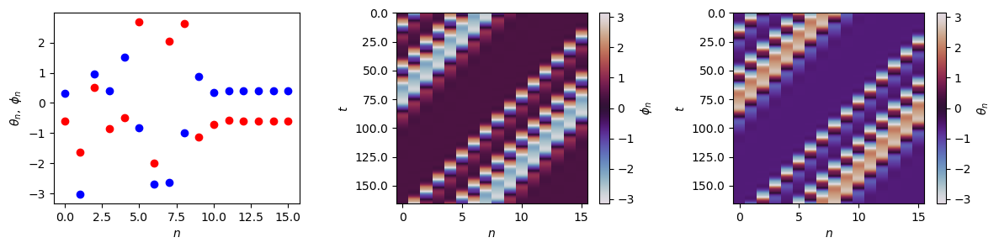

51


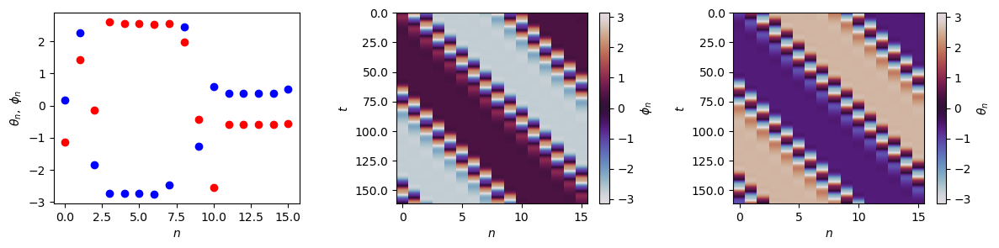

52


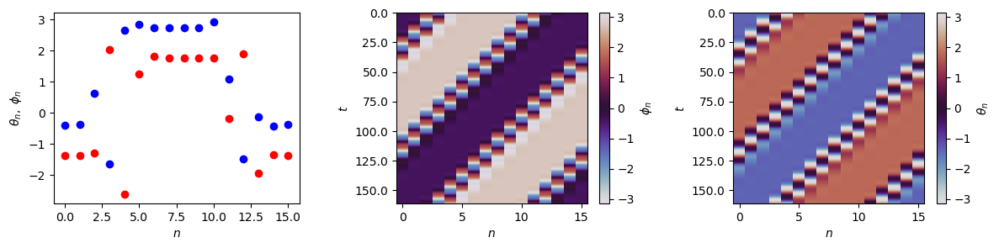

53


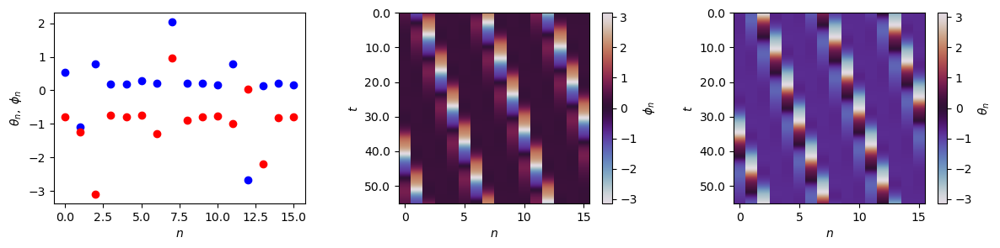

54


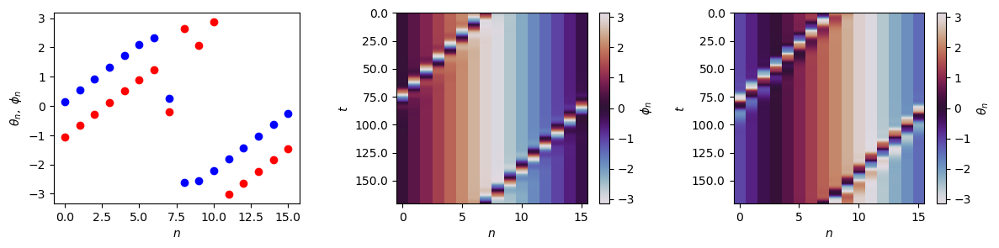

55


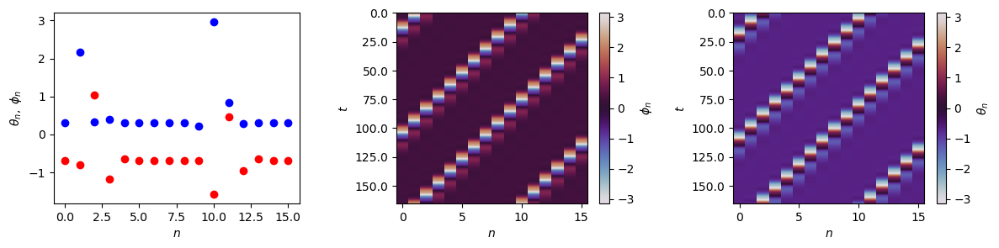

56


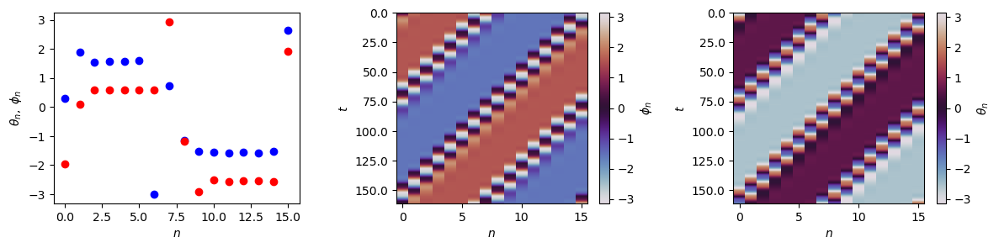

57


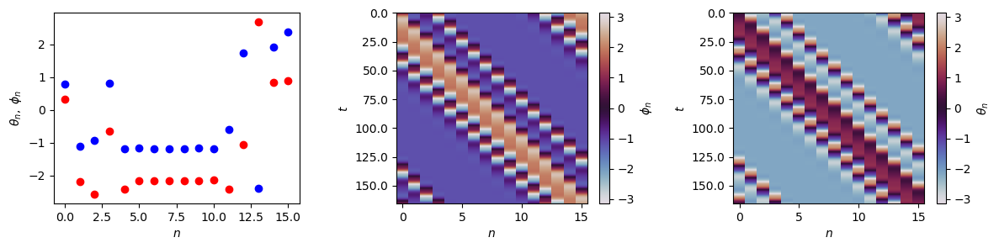

58


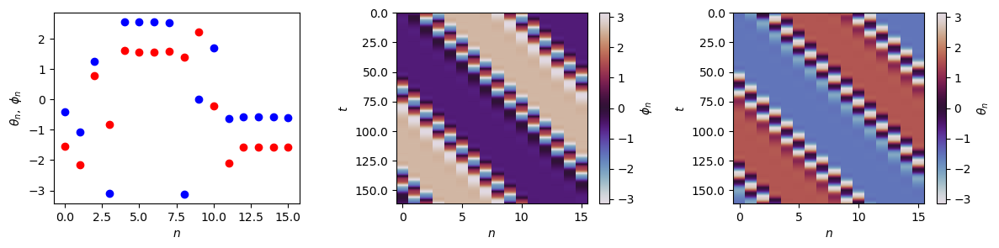

59


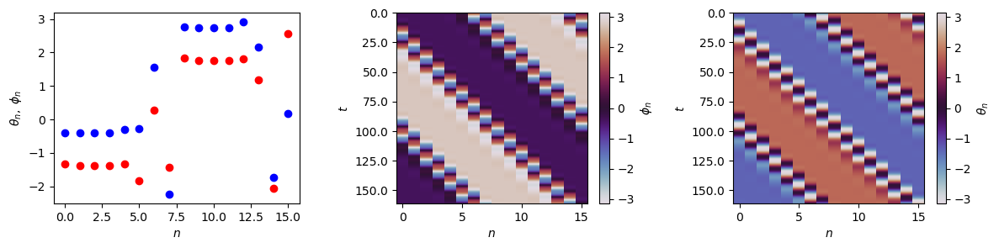

60


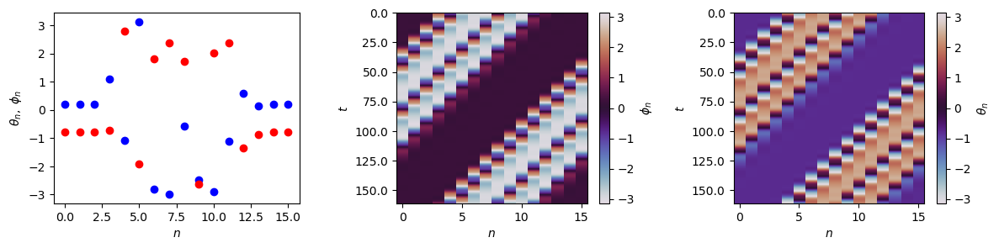

61


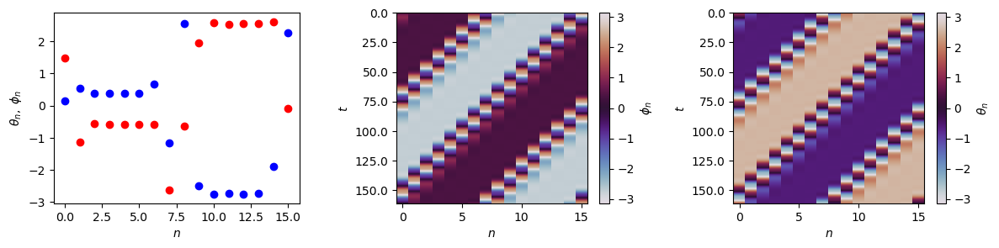

62


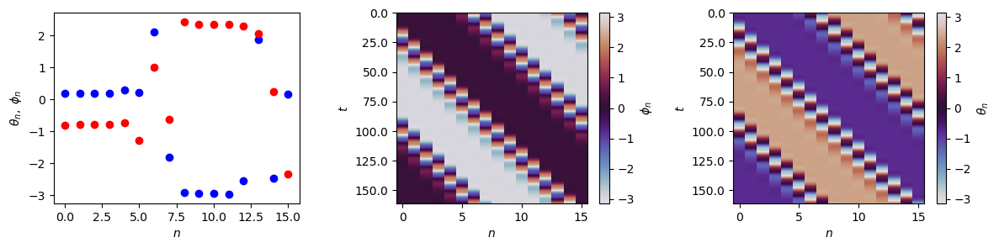

63


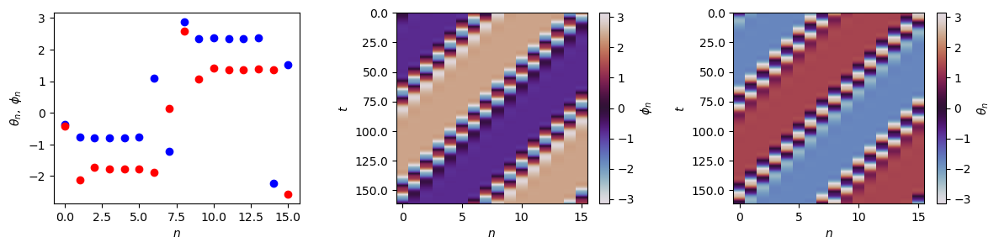

64


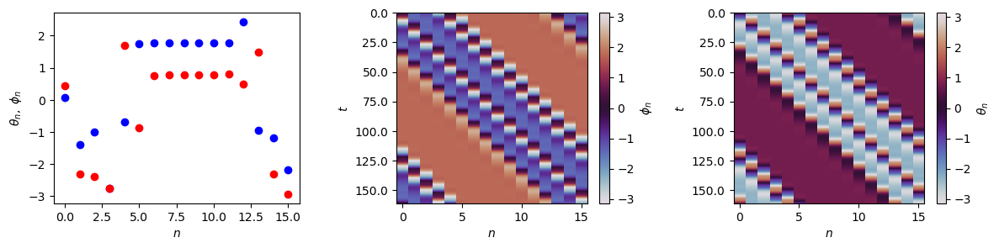

In [4]:
for i in range(len(sortedchimeras)):
    print(i+1)
    phases=np.loadtxt('data/randomjanus/cycles/%icycle.dat'%(np.array(chimeras[sortedchimeras[i]])[0]))

    N=int((phases.shape[1]-1+2)/4)    
    t=phases[:,0]
    x=phases[:,1:N]
    y=phases[:,N:2*N-1]
    u=phases[:,2*N-1:3*N-1]
    v=phases[:,3*N-1:]
    phi=np.unwrap(np.arctan2(y,x),axis=0)

    phi=np.concatenate([np.zeros(t.shape).reshape(-1,1),phi],axis=1)
    theta=np.unwrap(np.arctan2(v,u),axis=0)
    Theta=1/(2*N)*(np.sum(theta,axis=1)+np.sum(phi,axis=1))[:,np.newaxis]
    theta=np.mod(theta-Theta+np.pi,2*np.pi)-np.pi
    phi=np.mod(phi-Theta+np.pi,2*np.pi)-np.pi
    period=periods[sortedchimeras[i]]
    
    plt.subplots(1,3,figsize=(12,3))

    plt.subplot(1,3,1)
    plt.scatter(np.arange(N),phi[-1],c='b')
    plt.scatter(np.arange(N),theta[-1],c='r')
    plt.xlabel('$n$')
    plt.ylabel(r'$\theta_n,~\phi_n$')
    
    plt.subplot(1,3,2)
    plt.imshow(phi,aspect=N/period,cmap='twilight',interpolation='none')
    ticks=plt.gca().get_yticks().astype(int)
    plt.gca().set_yticks(ticks[1:-1],labels=t[np.mod(ticks[1:-1],len(t))])
    plt.clim(-np.pi,np.pi)
    plt.colorbar(label=r'$\phi_n$')
    plt.xlabel('$n$')
    plt.ylabel('$t$')
    
    plt.subplot(1,3,3)
    plt.imshow(theta,aspect=N/period,cmap='twilight',interpolation='none')
    ticks=plt.gca().get_yticks().astype(int)
    plt.gca().set_yticks(ticks[1:-1],labels=t[np.mod(ticks[1:-1],len(t))])
    plt.clim(-np.pi,np.pi)
    plt.colorbar(label=r'$\theta_n$')
    plt.xlabel('$n$')
    plt.ylabel('$t$')
    
    plt.tight_layout()
    plt.savefig('data/randomjanus/cycles/%icycle.pdf'%(i+1))
    plt.show()


Time-parity reversal symmetry

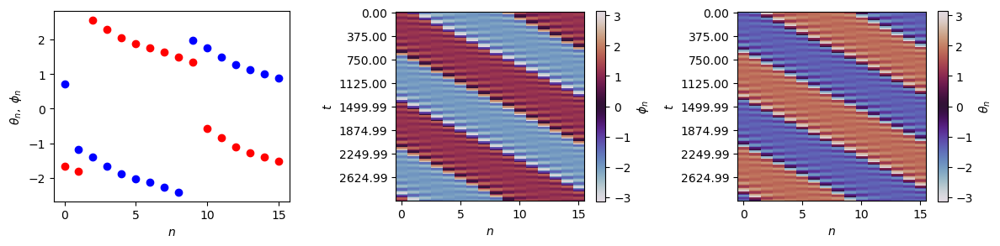

In [99]:
N=16

filebase='data/janus2/42/swrv'
total=np.loadtxt(filebase+'.dat')
tf2=np.load(filebase+'final.dat.npy')[0]
xf2=np.load(filebase+'final.dat.npy')[1:N].T
yf2=np.load(filebase+'final.dat.npy')[N:2*N-1].T
uf2=np.load(filebase+'final.dat.npy')[2*N-1:3*N-1].T
vf2=np.load(filebase+'final.dat.npy')[3*N-1:].T
phif2=np.unwrap(np.arctan2(yf2,xf2),axis=0)
phif2=np.concatenate([np.zeros(tf2.shape).reshape(-1,1),phif2],axis=1)
thetaf2=np.unwrap(np.arctan2(vf2,uf2),axis=0)
Theta=1/(2*N)*(np.sum(thetaf2,axis=1)+np.sum(phif2,axis=1))[:,np.newaxis]
thetaf2=thetaf2-Theta
phif2=phif2-Theta

phif2=np.concatenate([phif2,phif2[-1,0]-phif2[0,0]+phif2],axis=0)
thetaf2=np.concatenate([thetaf2,thetaf2[-1,0]-thetaf2[0,0]+thetaf2],axis=0)
tf2=np.concatenate([tf2,tf2+tf2[-1]])

phases=np.concatenate([np.cos(phif2),np.sin(phif2),np.cos(thetaf2),np.sin(thetaf2)],axis=1)
omega=1.0
gamma=0.1
beta=total[-1,0]
sigma=total[-1,0]
period=total[-1,2]
sigma0=total[-1,0]
t0=0
sym=0

Nt=2000

ftheta2=interp1d(tf2,thetaf2,axis=0)
fphi2=interp1d(tf2,phif2,axis=0)
phi2f2=np.mod(fphi2(2*np.arange(Nt)/Nt)+np.pi,2*np.pi)-np.pi
theta2f2=np.mod(ftheta2(2*np.arange(Nt)/Nt)+np.pi,2*np.pi)-np.pi

T=2*total[-1][2]
t=np.arange(Nt)/Nt*T

plt.subplots(1,3,figsize=(12,3))

plt.subplot(1,3,1)
plt.scatter(np.arange(N),phi2f2[-1],c='b')
plt.scatter(np.arange(N),theta2f2[-1],c='r')
plt.xlabel('$n$')
plt.ylabel(r'$\theta_n,~\phi_n$')

plt.subplot(1,3,2)
plt.imshow(phi2f2,aspect=phi2f2.shape[1]/phi2f2.shape[0],cmap='twilight',interpolation='none')
ticks=plt.gca().get_yticks().astype(int)
plt.gca().set_yticks(ticks[1:-1],labels=['%.2f'%(ti) for ti in t[np.mod(ticks[1:-1],len(t))]])
plt.clim(-np.pi,np.pi)
plt.colorbar(label=r'$\phi_n$')
plt.xlabel('$n$')
plt.ylabel('$t$')

plt.subplot(1,3,3)
plt.imshow(theta2f2,aspect=theta2f2.shape[1]/theta2f2.shape[0],cmap='twilight',interpolation='none')
ticks=plt.gca().get_yticks().astype(int)
plt.gca().set_yticks(ticks[1:-1],labels=['%.2f'%(ti) for ti in t[np.mod(ticks[1:-1],len(t))]])
plt.clim(-np.pi,np.pi)
plt.colorbar(label=r'$\theta_n$')
plt.xlabel('$n$')
plt.ylabel('$t$')

plt.tight_layout()
plt.show()

skip=10
if not os.path.exists(filebase+"animation.mp4"):
    os.system('rm animation/*')
    if not os.path.exists('animation'):
        os.mkdir('animation')

    for n in range(0,Nt,skip):
        print(n,end='\r')
        plt.figure(figsize=(4,4))
        plt.plot(np.mod(phi2f2[n]+np.pi,2*np.pi)-np.pi,'bo')
        plt.plot(np.mod(theta2f2[n]+np.pi,2*np.pi)-np.pi,'ro')
        plt.title(r'$\sigma=%.3f$, $T=%.1f$'%(total[-1,0],total[-1,2]))
        plt.gca().set_yticklabels([])
        plt.ylim(-np.pi,np.pi)
        plt.xlabel(r'$i$')
        plt.savefig('animation/%04d.png'%(n//skip),dpi=100)
        plt.close()
    os.system('encode.sh animation %sanimation 15 &> /dev/null'%(filebase))
display(Video(filebase+"animation.mp4",width=250,embed=False))

plt.show()

$\pi_4(\theta_n,\phi_n,t)=(\pi-\theta_{N-n+1},-\phi_{N-n},-t)$

3.8750961385603637


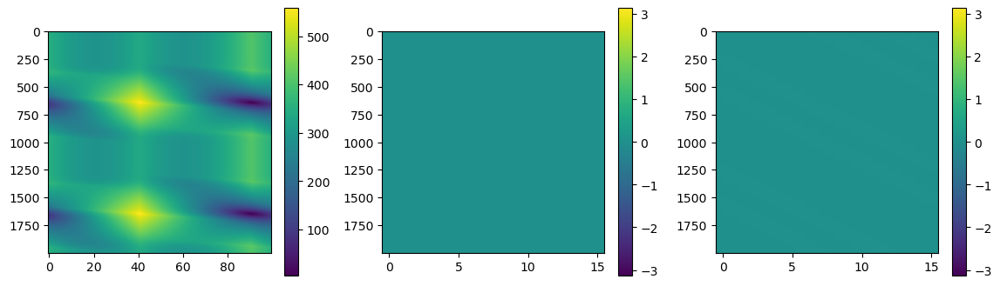

In [94]:
rolls=np.arange(0,Nt,1)
phi0s=-np.pi+2*np.pi*np.arange(100)/100
norms=np.array([np.linalg.norm(np.mod(theta2f2.reshape(Nt,N,1)+phi0s.reshape(1,1,-1)+np.roll(np.roll(np.flip(np.flip(theta2f2,axis=1),axis=0),roll,axis=0),-1,axis=1).reshape(Nt,N,1)+np.pi,2*np.pi)-np.pi,axis=(0,1)) for roll in rolls])

plt.subplots(1,3,figsize=(14,4))
plt.subplot(1,3,1)
print(np.min(norms))
plt.imshow(norms,aspect=norms.shape[1]/norms.shape[0])
roll=rolls[np.where(np.min(norms)==norms)[0]][0]
phi0=phi0s[np.where(np.min(norms)==norms)[1]][0]
plt.colorbar()

plt.subplot(1,3,2)
plt.imshow(np.mod(theta2f2+phi0+np.roll(np.roll(np.flip(np.flip(theta2f2,axis=1),axis=0),roll,axis=0),-1,axis=1)+np.pi,2*np.pi)-np.pi,aspect=phi2f2.shape[1]/phi2f2.shape[0])
plt.clim(-np.pi,np.pi)
plt.colorbar()

plt.subplot(1,3,3)
plt.imshow(np.mod(phi2f2+phi0-np.pi+np.roll(np.roll(np.flip(np.flip(phi2f2,axis=1),axis=0),roll,axis=0),-2,axis=1)+np.pi,2*np.pi)-np.pi,aspect=phi2f2.shape[1]/phi2f2.shape[0])
plt.clim(-np.pi,np.pi)
plt.colorbar()

plt.show()

$\pi_1(\theta_n,\phi_n,t)=(\pi+\phi_{N-n},\theta_{N-n},-t)$

0.8156885819133852


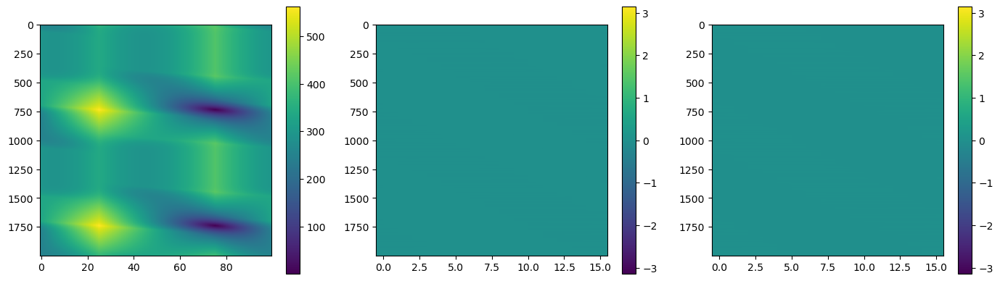

In [95]:
rolls=np.arange(0,Nt,1)
phi0s=-np.pi+2*np.pi*np.arange(100)/100
norms=np.array([np.linalg.norm(np.mod(-phi2f2.reshape(Nt,N,1)+phi0s.reshape(1,1,-1)+np.roll(np.flip(np.flip(theta2f2,axis=1),axis=0),roll,axis=0).reshape(Nt,N,1)+np.pi,2*np.pi)-np.pi,axis=(0,1)) for roll in rolls])

plt.subplots(1,3,figsize=(14,4))
print(np.min(norms))
plt.subplot(1,3,1)
plt.imshow(norms,aspect=norms.shape[1]/norms.shape[0])
roll=rolls[np.where(np.min(norms)==norms)[0]][0]
phi0=phi0s[np.where(np.min(norms)==norms)[1]][0]
plt.colorbar()

plt.subplot(1,3,2)
plt.imshow(np.mod(-phi2f2+phi0+np.roll(np.flip(np.flip(theta2f2,axis=1),axis=0),roll,axis=0)+np.pi,2*np.pi)-np.pi,aspect=phi2f2.shape[1]/phi2f2.shape[0])
plt.clim(-np.pi,np.pi)
plt.colorbar()

plt.subplot(1,3,3)
plt.imshow(np.mod(-theta2f2-np.pi+phi0+np.roll(np.flip(np.flip(phi2f2,axis=1),axis=0),roll,axis=0)+np.pi,2*np.pi)-np.pi,aspect=phi2f2.shape[1]/phi2f2.shape[0])
plt.clim(-np.pi,np.pi)
plt.colorbar()

plt.tight_layout()
plt.show()

$\pi_5(\theta_n,\phi_n,t)=(-\phi_n,-\theta_{n+1},t)$

3.9832269367112416


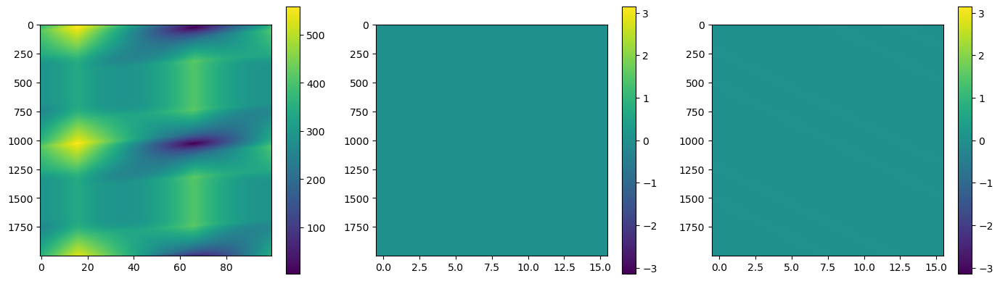

In [96]:
rolls=np.arange(0,Nt,1)
phi0s=-np.pi+2*np.pi*np.arange(100)/100
norms=np.array([np.linalg.norm(np.mod(phi2f2.reshape(Nt,N,1)+phi0s.reshape(1,1,-1)+np.roll(theta2f2,roll,axis=0).reshape(Nt,N,1)+np.pi,2*np.pi)-np.pi,axis=(0,1)) for roll in rolls])

plt.subplots(1,3,figsize=(14,4))
print(np.min(norms))
plt.subplot(1,3,1)
plt.imshow(norms,aspect=norms.shape[1]/norms.shape[0])
roll=rolls[np.where(np.min(norms)==norms)[0]][0]
phi0=phi0s[np.where(np.min(norms)==norms)[1]][0]
plt.colorbar()

plt.subplot(1,3,2)
plt.imshow(np.mod(phi2f2+phi0+np.roll(theta2f2,roll,axis=0)+np.pi,2*np.pi)-np.pi,aspect=phi2f2.shape[1]/phi2f2.shape[0])
plt.clim(-np.pi,np.pi)
plt.colorbar()

plt.subplot(1,3,3)
plt.imshow(np.mod(theta2f2+phi0+np.roll(np.roll(phi2f2,1,axis=1),roll,axis=0)+np.pi,2*np.pi)-np.pi,aspect=phi2f2.shape[1]/phi2f2.shape[0])
plt.clim(-np.pi,np.pi)
plt.colorbar()

plt.tight_layout()
plt.show()

steady states

1 fw 0.42379644711 1499.9937897


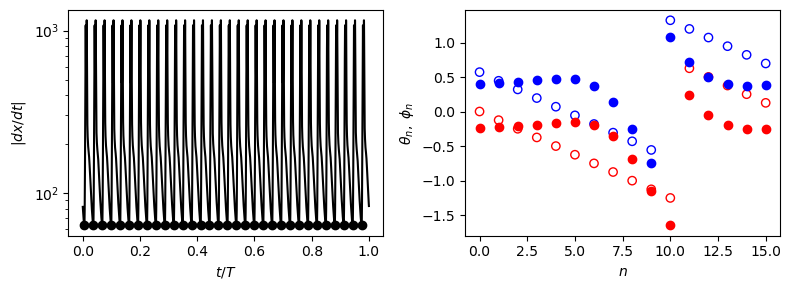

1 rv 0.42379644714 1499.9937916


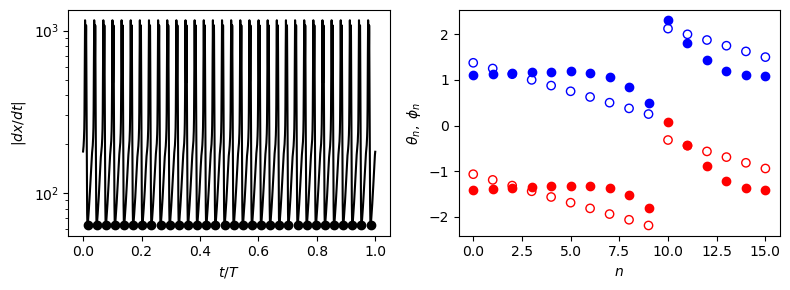

2 fw 0.42379644711 1499.9937894


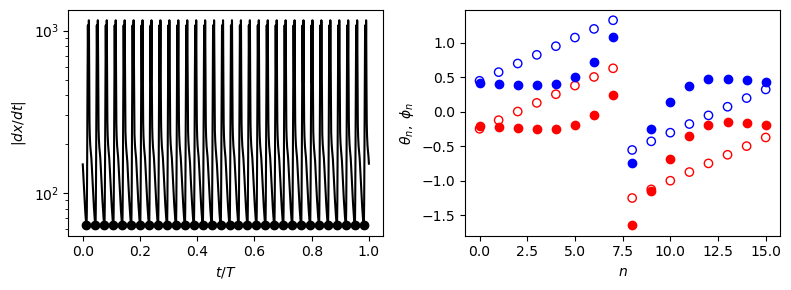

2 rv 0.42379644717 1499.9937939


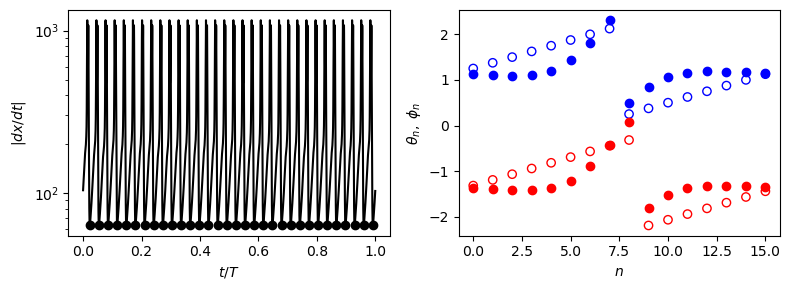

3 fw 0.42750920207 1499.9994054


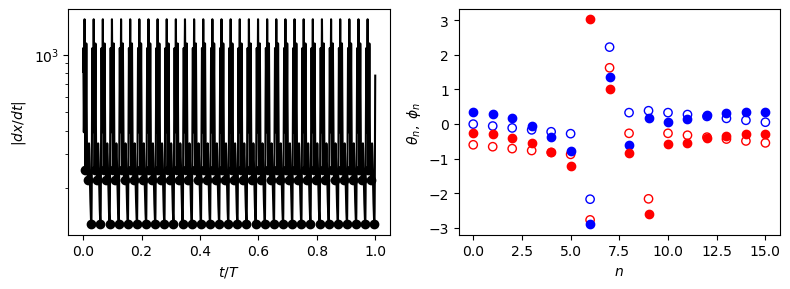

3 rv 0.42750920207 1499.9994055


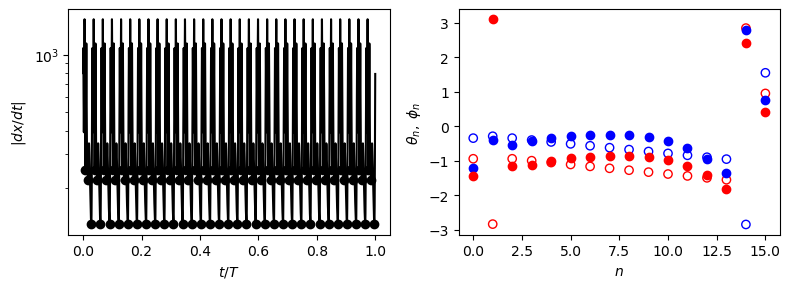

4 fw 0.4440126931 1500.0031894


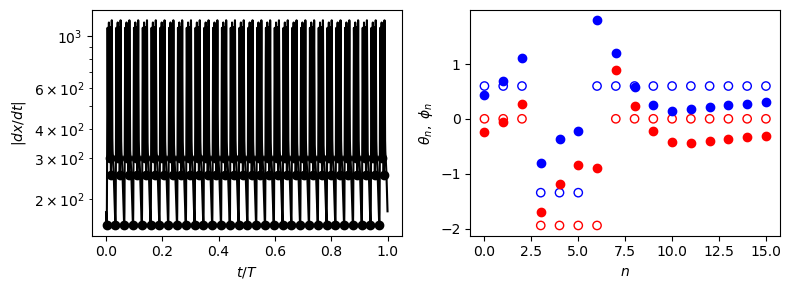

4 rv 0.44401269302 1500.0031884


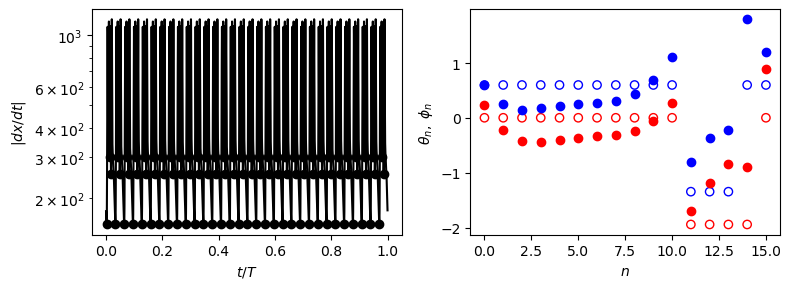

5 fw 0.35354332628 1500.0000989


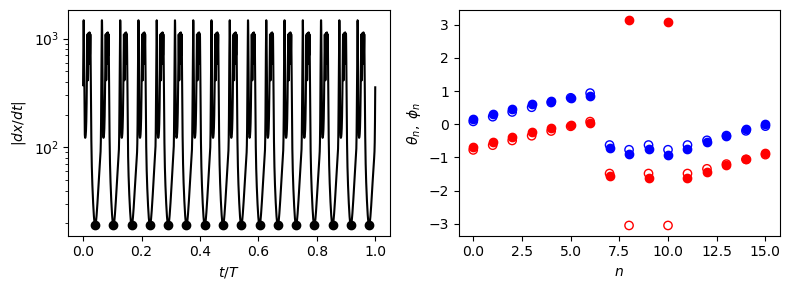

5 rv 0.35354332628 1500.0000988


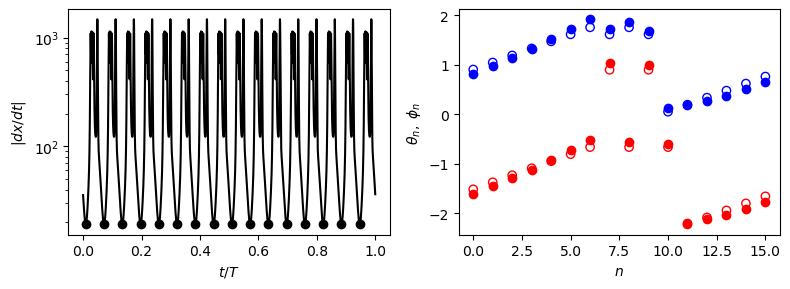

6 fw 0.35354332628 1500.0000983


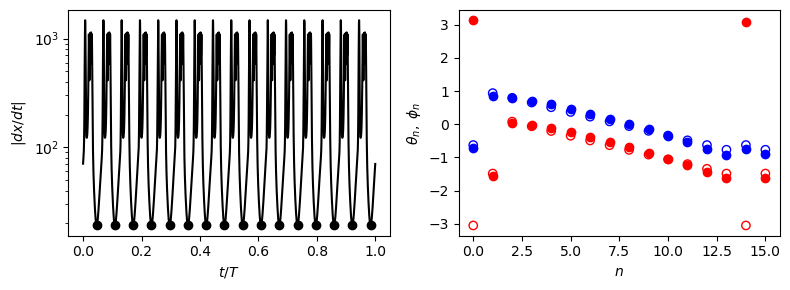

6 rv 0.35354332628 1500.0000988


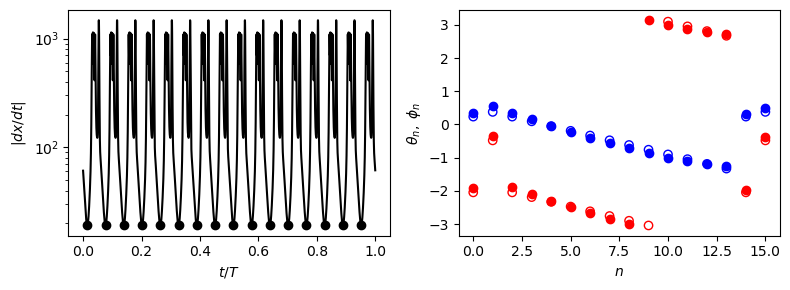

7 fw 0.35354332637 1500.0000029


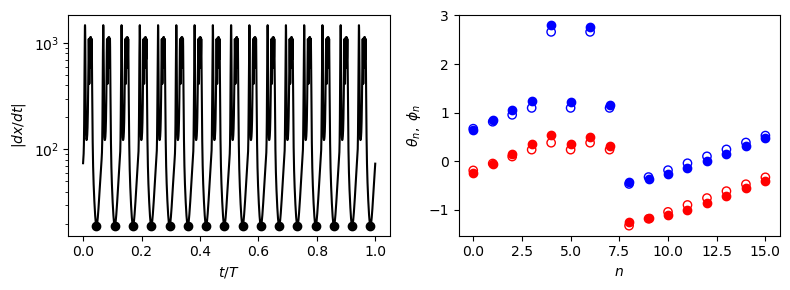

7 rv 0.35354332637 1500.0000031


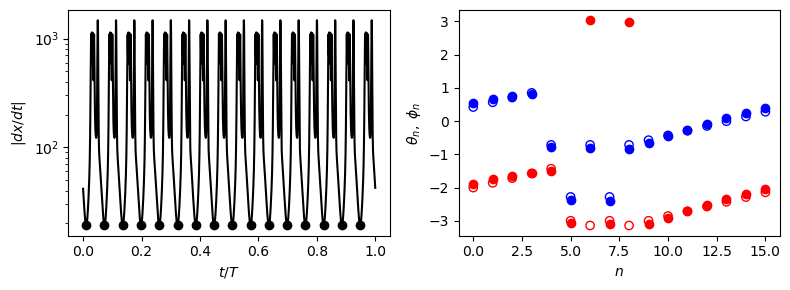

8 fw 0.35354332637 1500.0000029


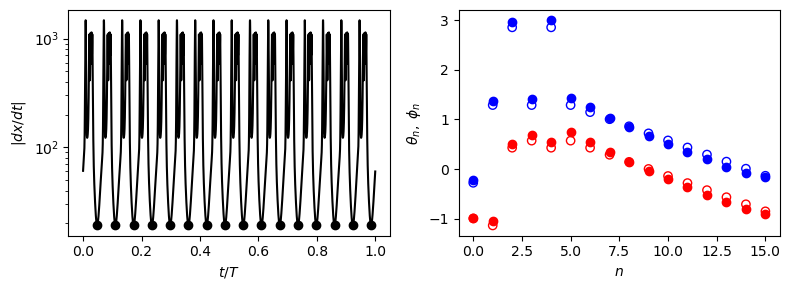

8 rv 0.35354332637 1500.0000031


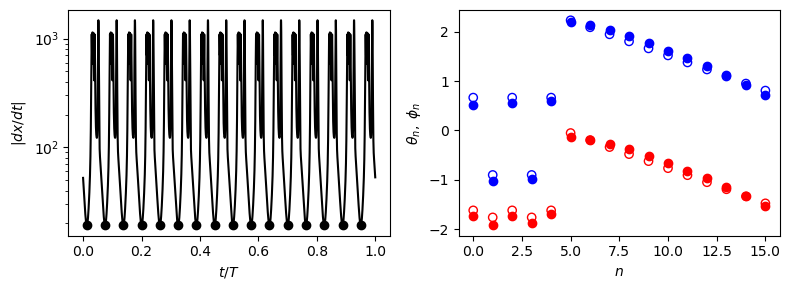

9 fw 0.3865919642 1500.0000022


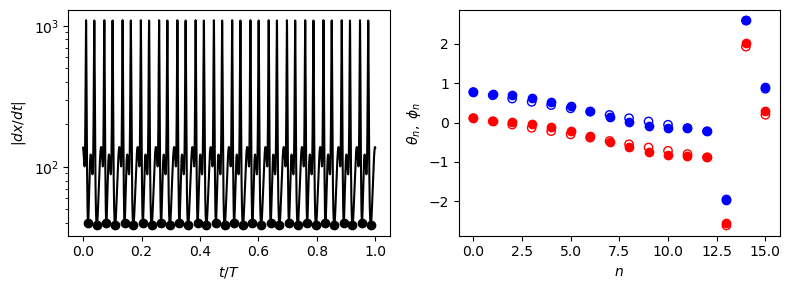

9 rv 0.38659195328 1500.0029243


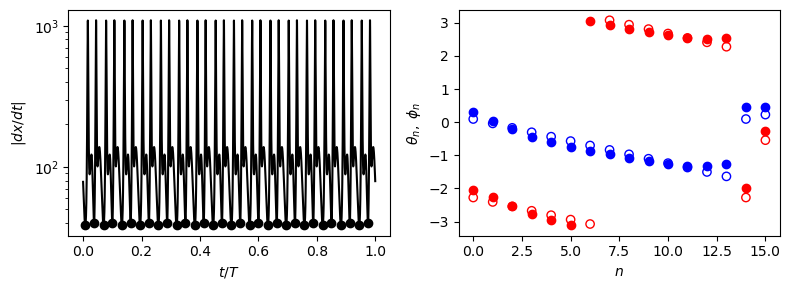

10 fw 0.3865919642 1500.0000022


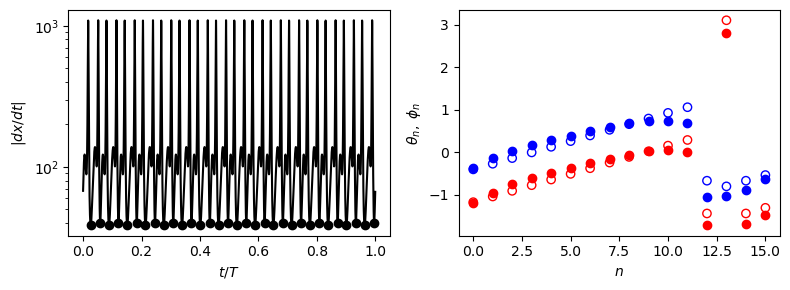

10 rv 0.38659195328 1500.0029243


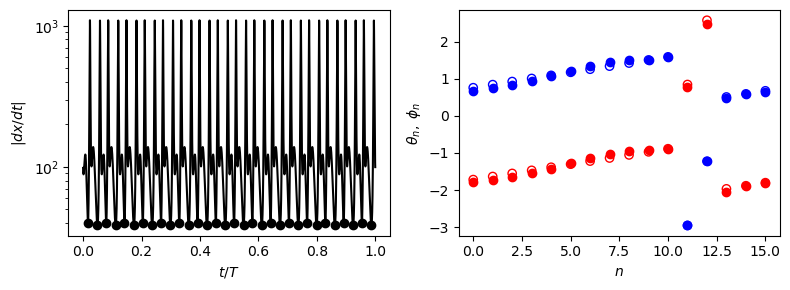

11 fw 0.38659194792 1500.0043583


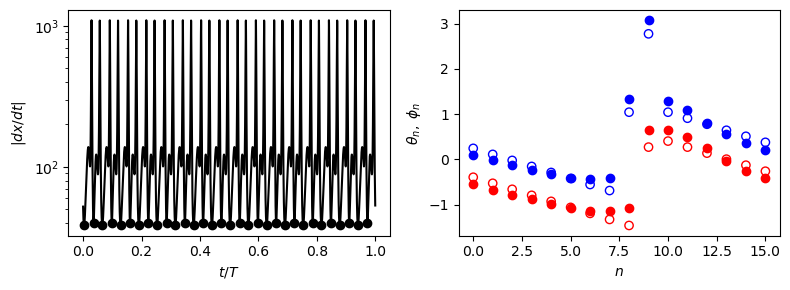

11 rv 0.38659194679 1500.0046612


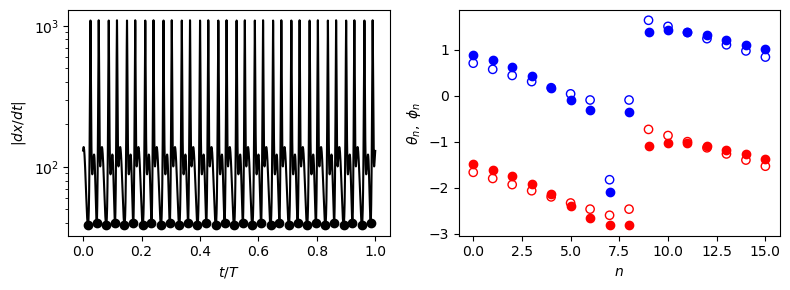

12 fw 0.38659194792 1500.0043583


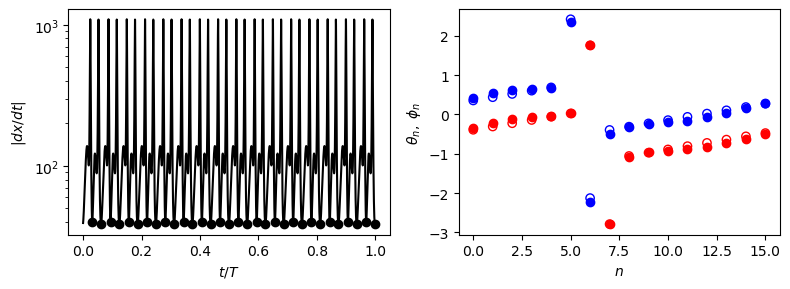

12 rv 0.38659194679 1500.0046612


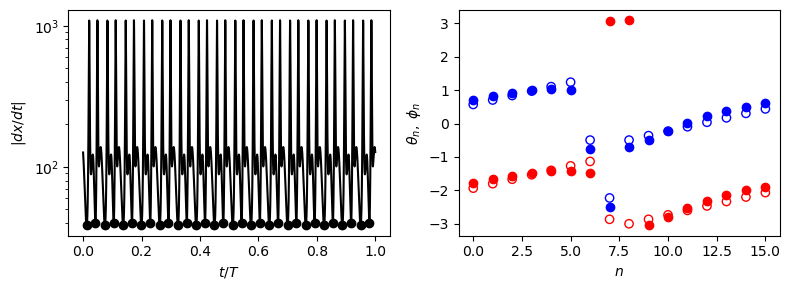

13 fw 0.43441271239 1499.9955935


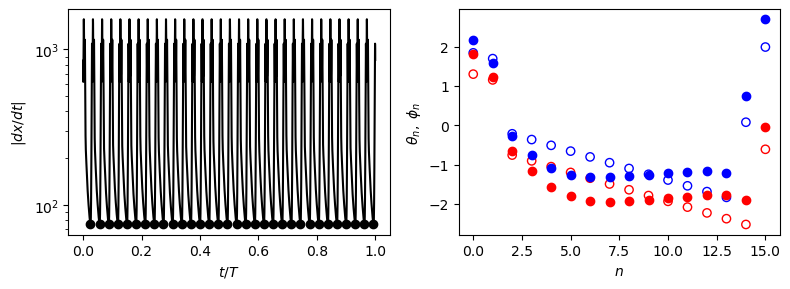

13 rv 0.42027519478 1500.0006009


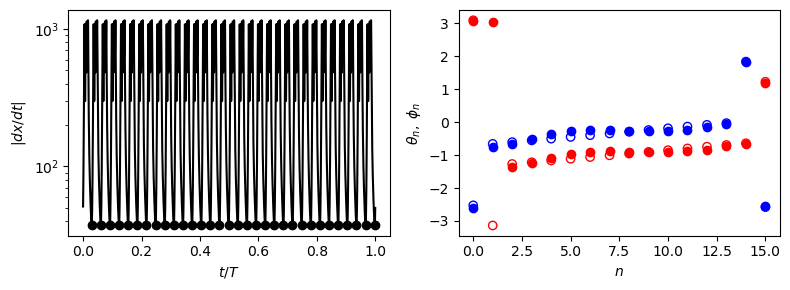

14 fw 0.43441271239 1499.9955935


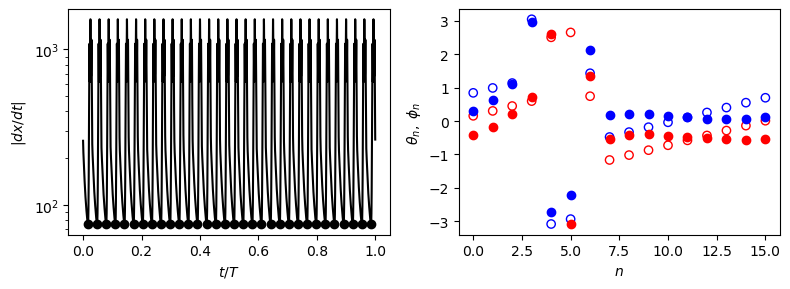

14 rv 0.42027519477 1500.0006009


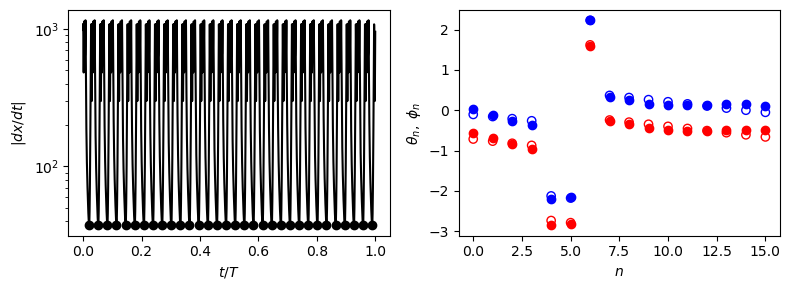

15 fw 0.42934976588 1499.9984306


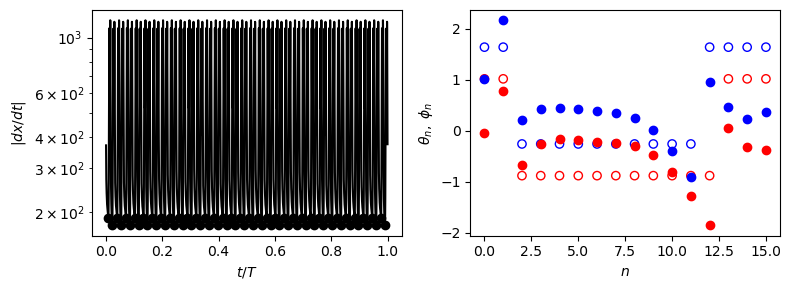

15 rv 0.42934976588 1499.9984307


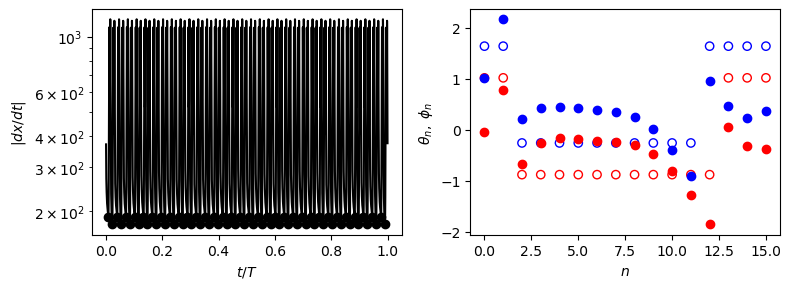

21 fw 0.43585203209 1500.0018702


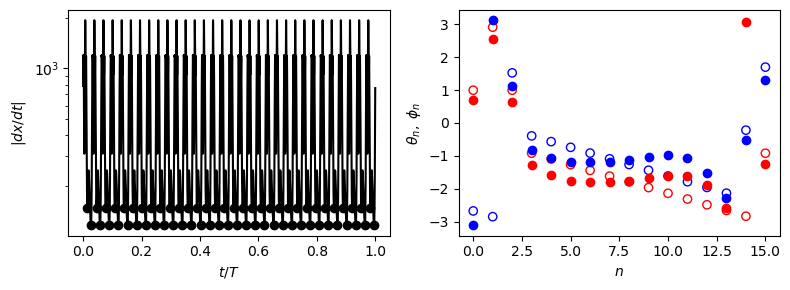

21 rv 0.43585203209 1500.0018705


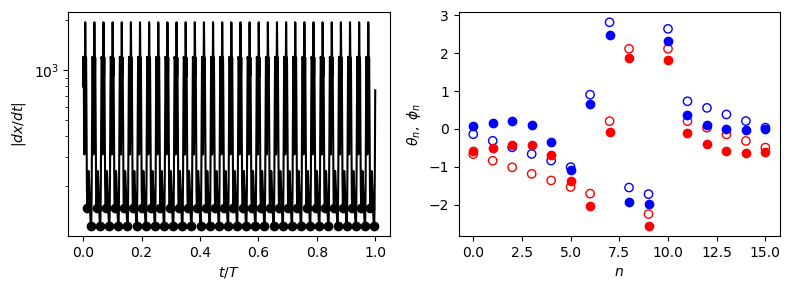

22 fw 0.43585203209 1500.0018702


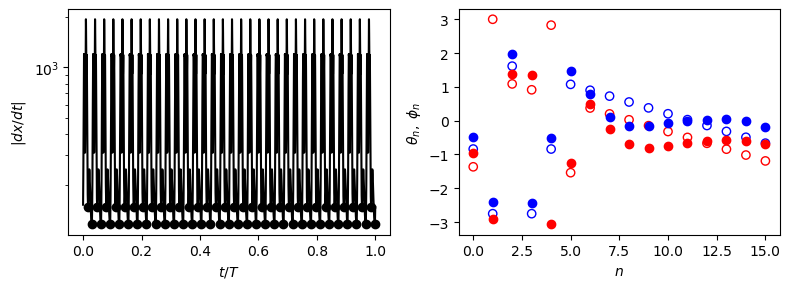

22 rv 0.43585203209 1500.0018705


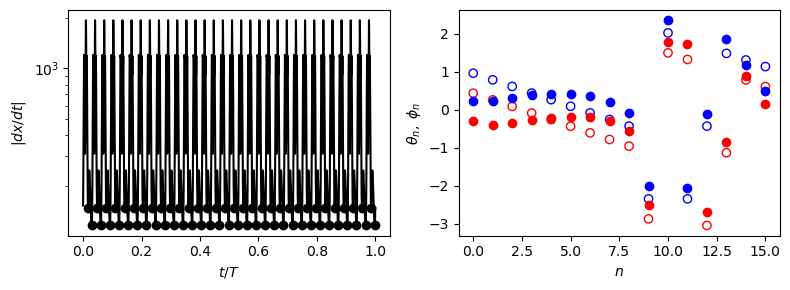

23 fw 0.3476343532 1499.9996791


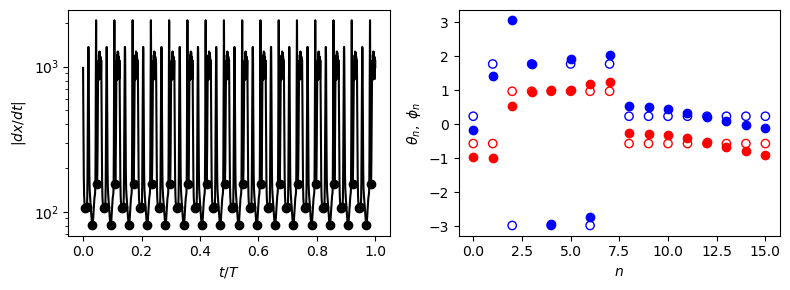

23 rv 0.3476343532 1499.9996791


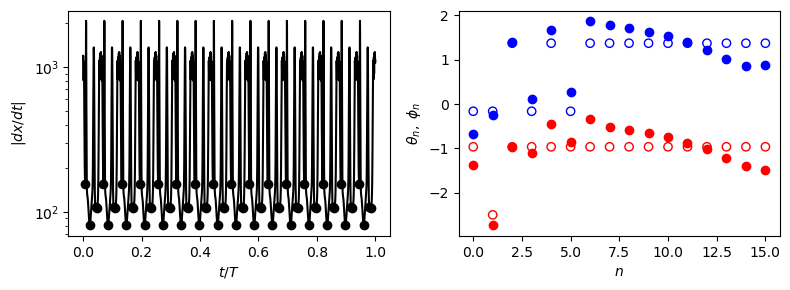

24 fw 0.34763435146 1499.9993121


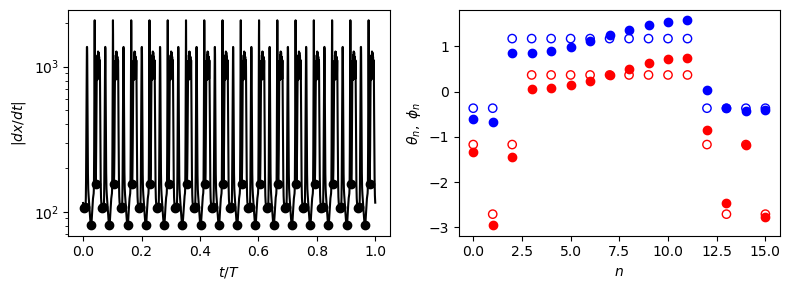

24 rv 0.34763435146 1499.9993121


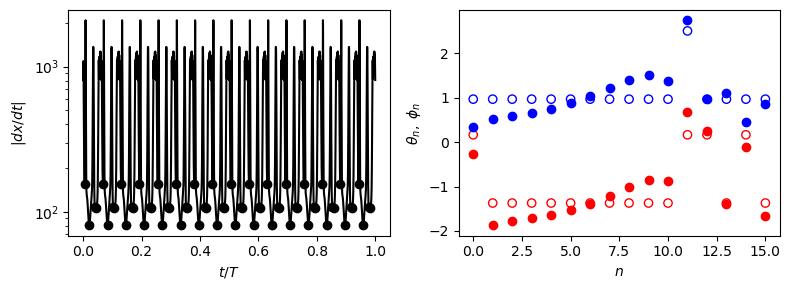

25 fw 0.34763435146 1499.9993121


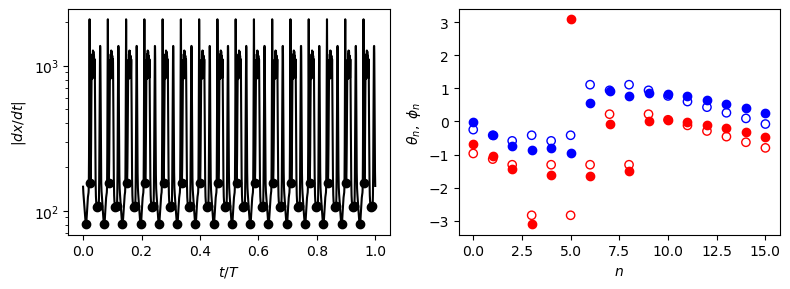

25 rv 0.34763435146 1499.9993121


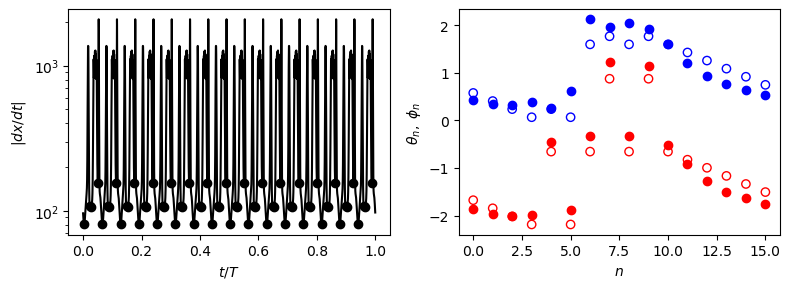

26 fw 0.3476343532 1499.9996791


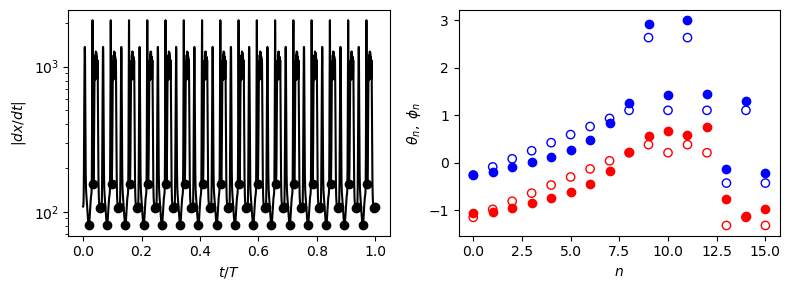

26 rv 0.3476343532 1499.9996791


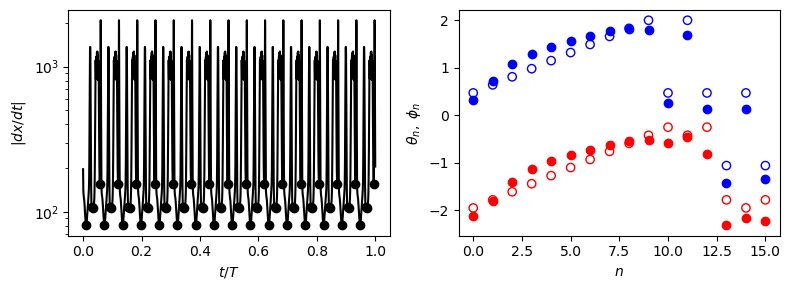

27 fw 0.42744089108 1499.9979606


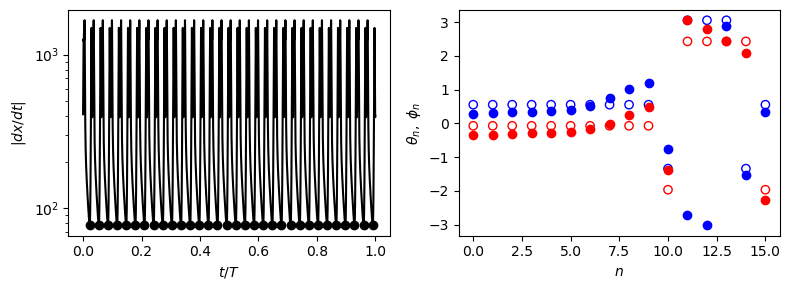

27 rv 0.42744089109 1499.9979624


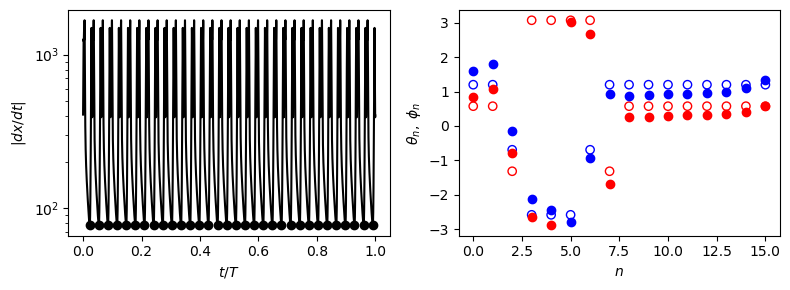

28 fw 0.42744089108 1499.9979606


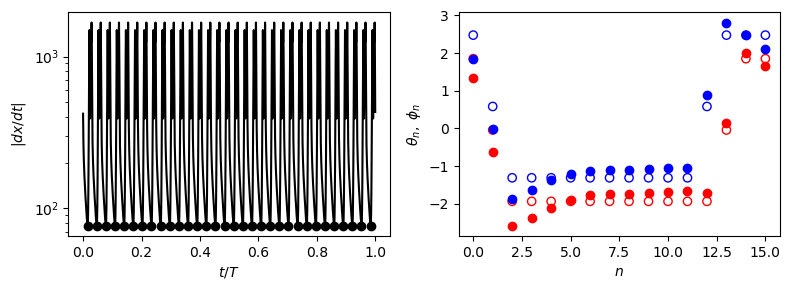

28 rv 0.42744089109 1499.9979624


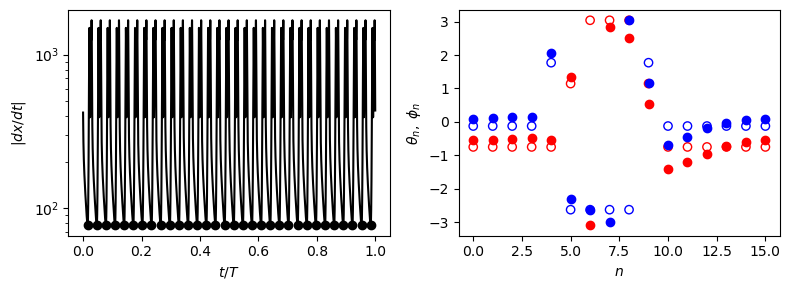

29 fw 0.43388735785 1500.0008999


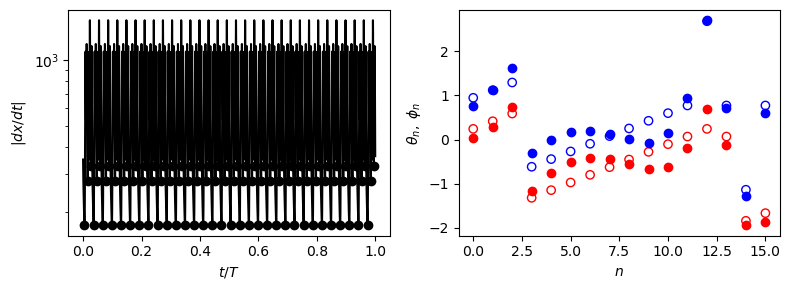

29 rv 0.43688116009 1499.9999124


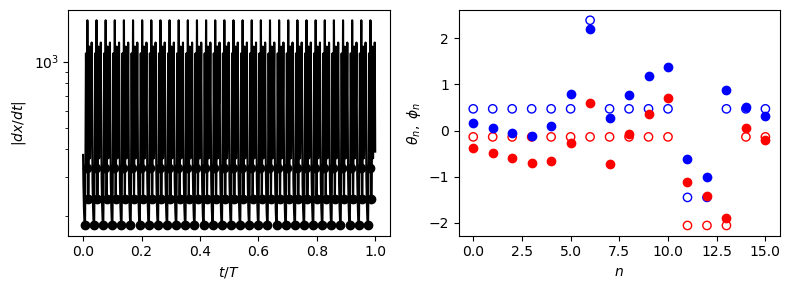

30 fw 0.42692106202 1499.9993182


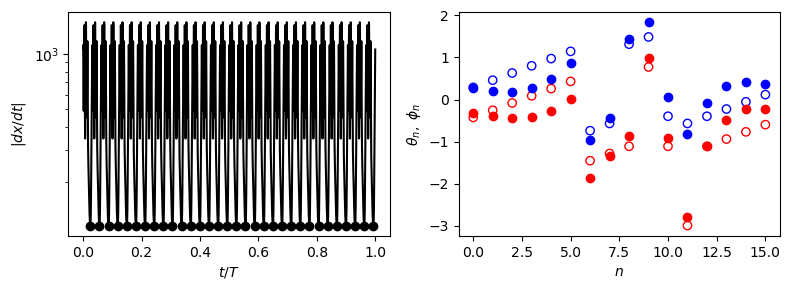

30 rv 0.41693633428 1499.9999679


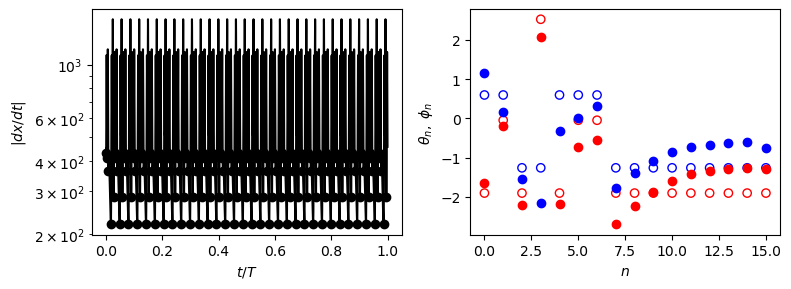

35 fw 0.39310859423 1499.9945146


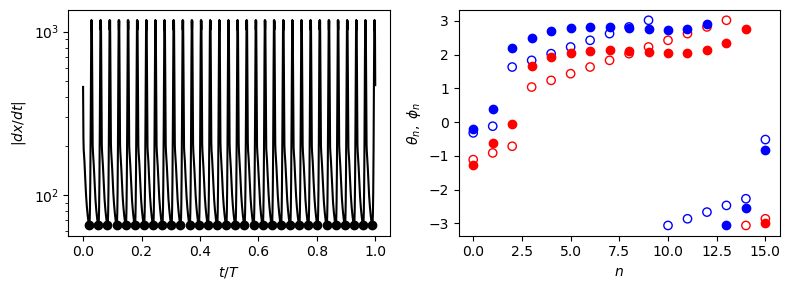

35 rv 0.39634404676 719.51770718


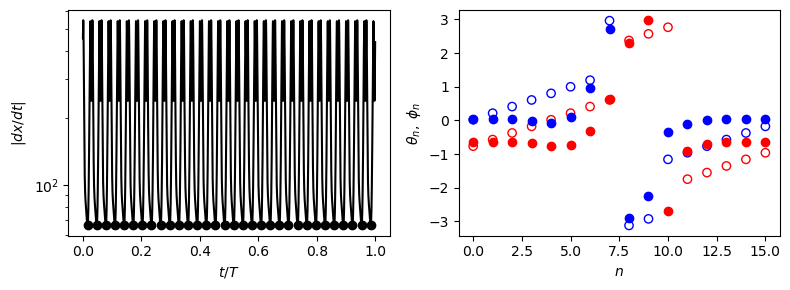

36 fw 0.39310859423 1499.9945146


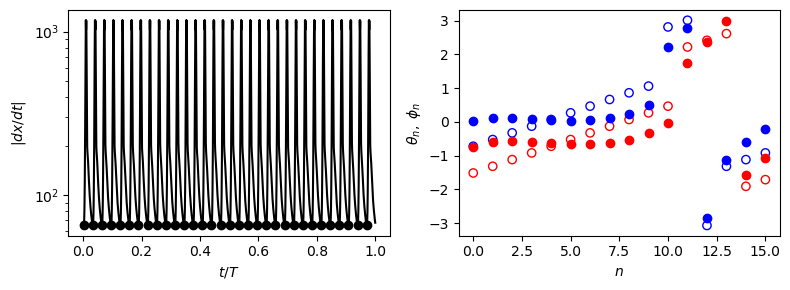

36 rv 0.39634404676 719.5177072


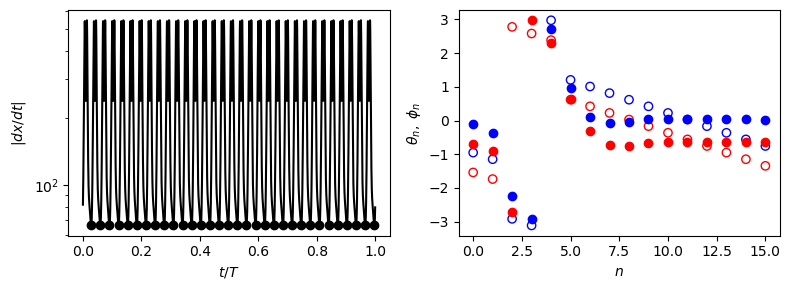

37 fw 0.39047242271 1500.0025936


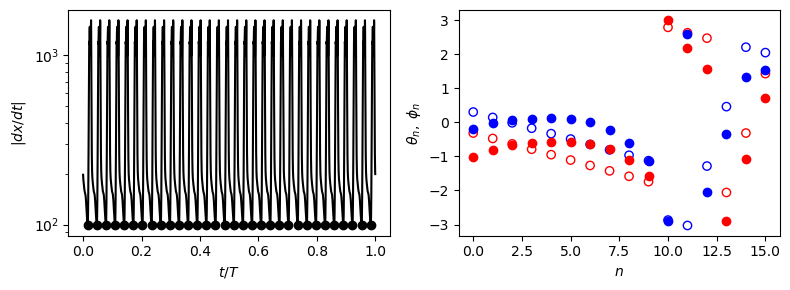

37 rv 0.40484119192 1499.9999997


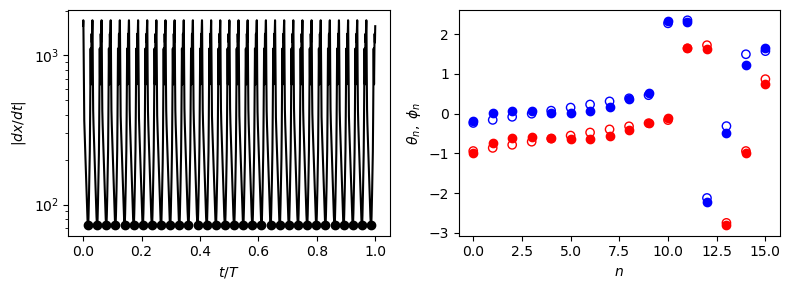

38 fw 0.33302569399 1599.995213


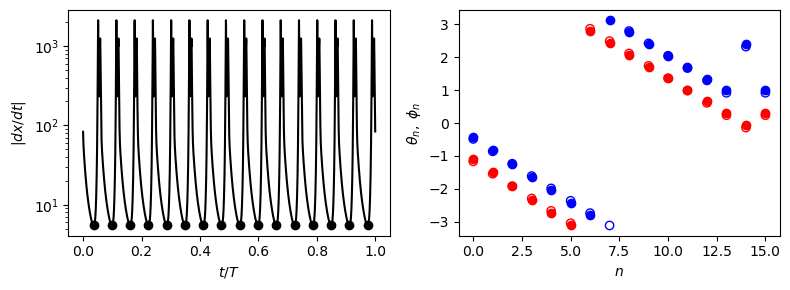

38 rv 0.33265255422 1499.9964277


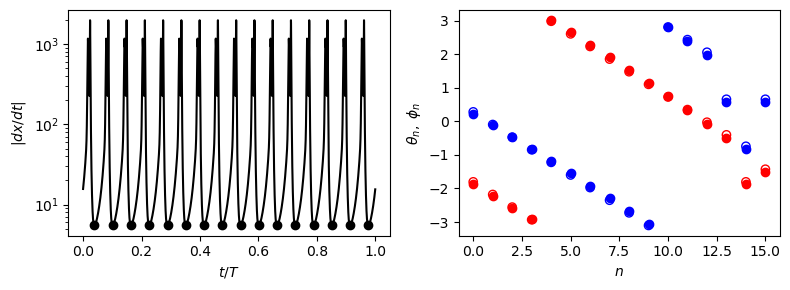

39 fw 0.33265254417 1499.9940232


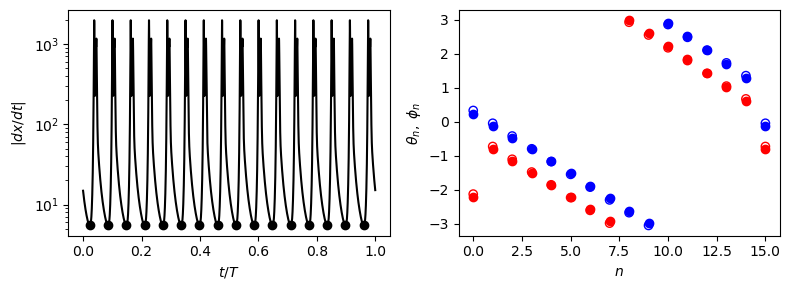

39 rv 0.33265254417 1499.9940232


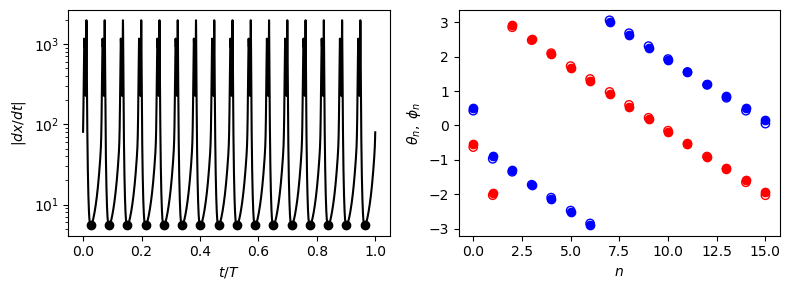

40 fw 0.42758869234 1499.9997774


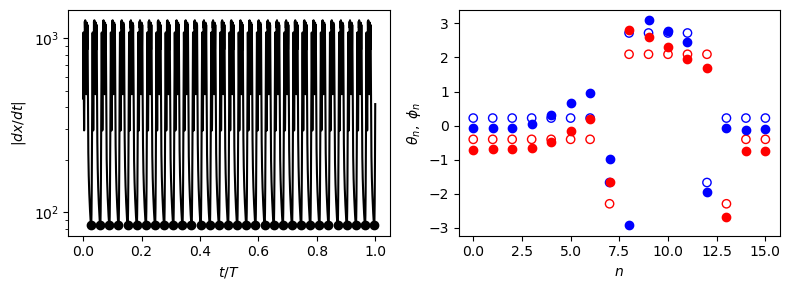

41 fw 0.42758869234 1499.9997774


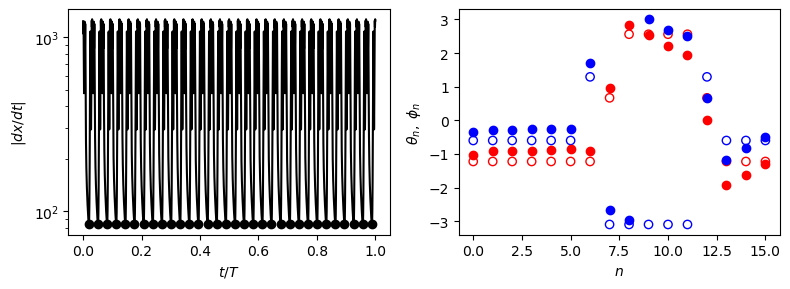

42 fw 0.38408787215 1499.9980591


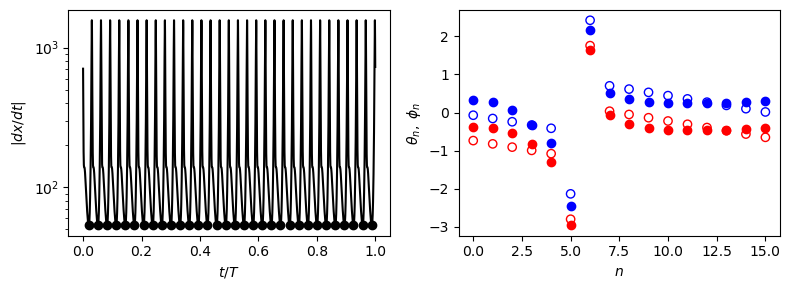

42 rv 0.38921650697 517.38843886


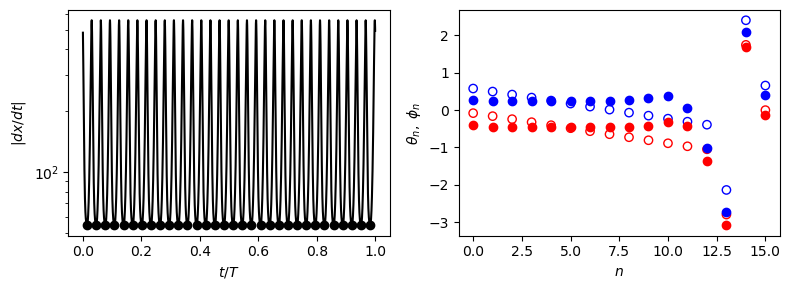

43 fw 0.39080342156 1499.9969473


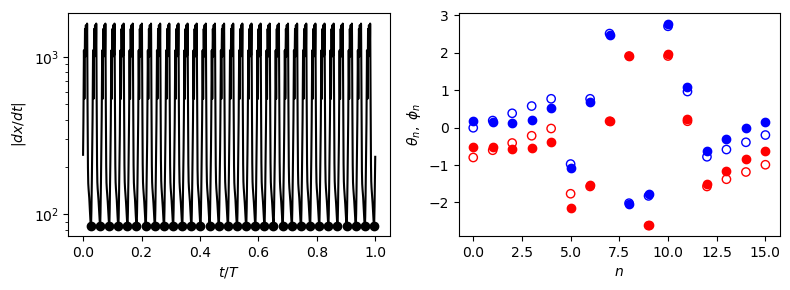

43 rv 0.4018421065 1499.9999243


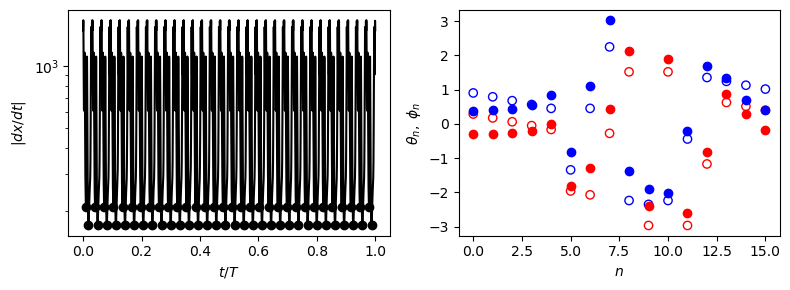

44 fw 0.38408787215 1499.9980591


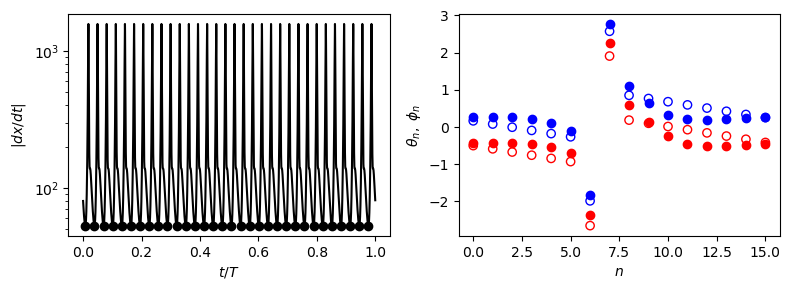

44 rv 0.38921650697 517.38843881


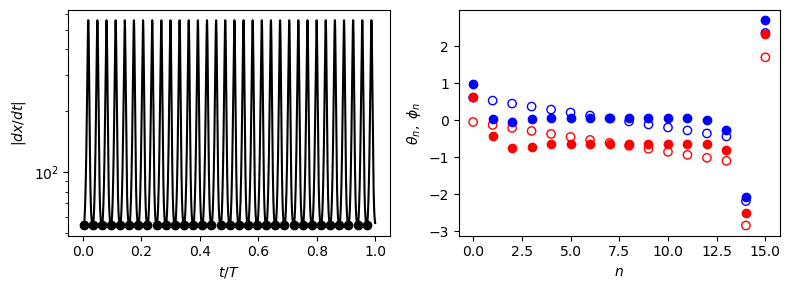

45 fw 0.39080342156 1499.9969473


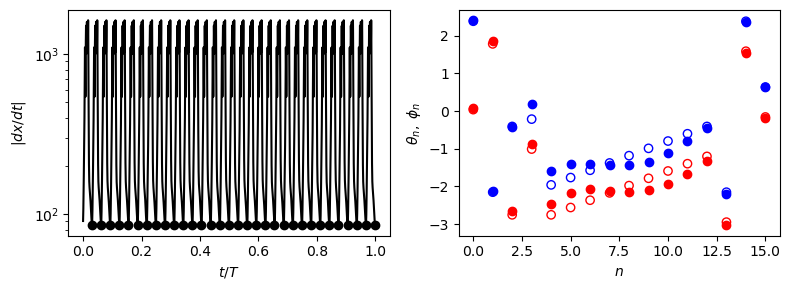

45 rv 0.4018421065 1499.9999243


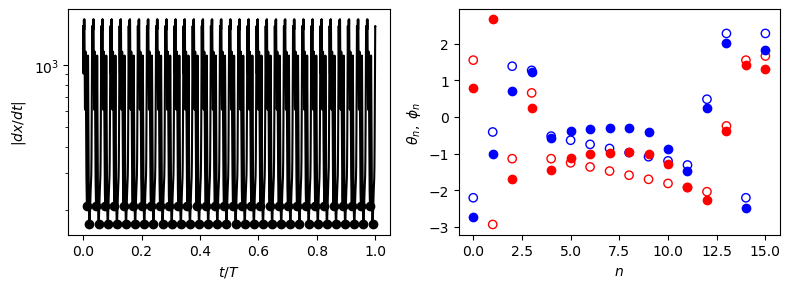

46 fw 0.33302569399 1599.995213


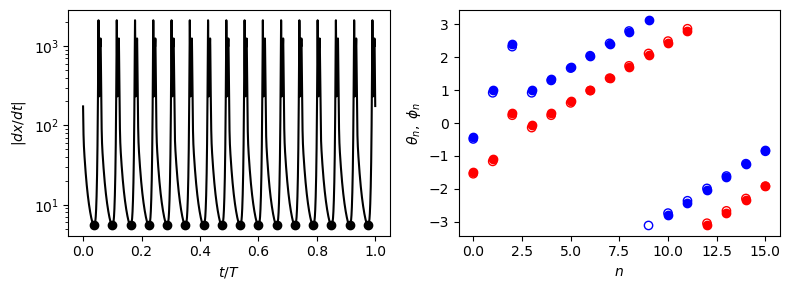

46 rv 0.33265255422 1499.9964277


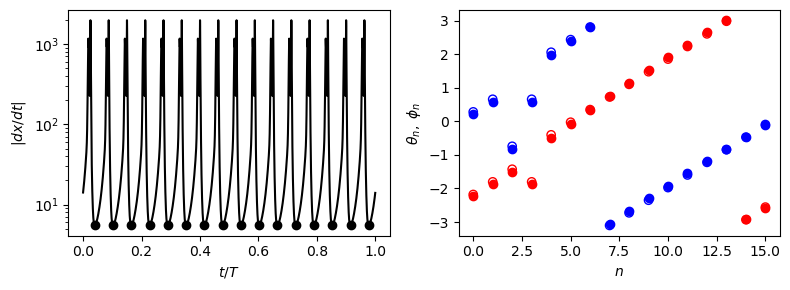

47 fw 0.42216544484 1499.9987602


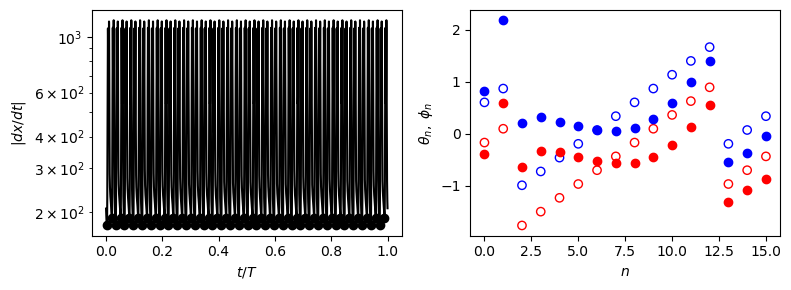

47 rv 0.42216544484 1499.9987602


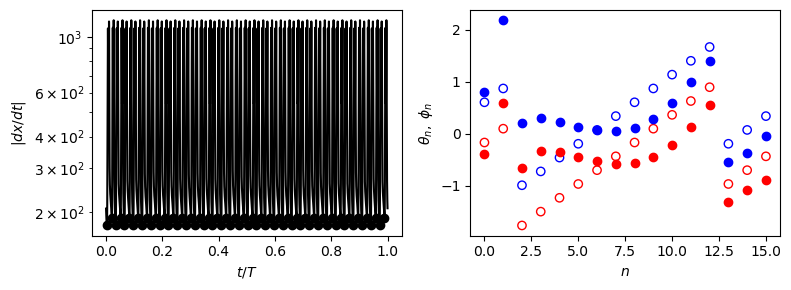

48 fw 0.42758869234 1499.9997774


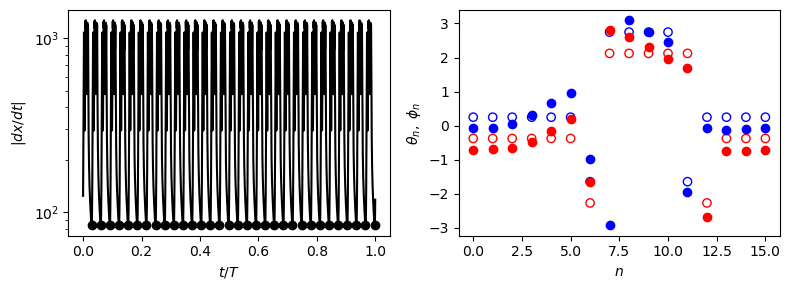

49 fw 0.41541828114 1499.9997662


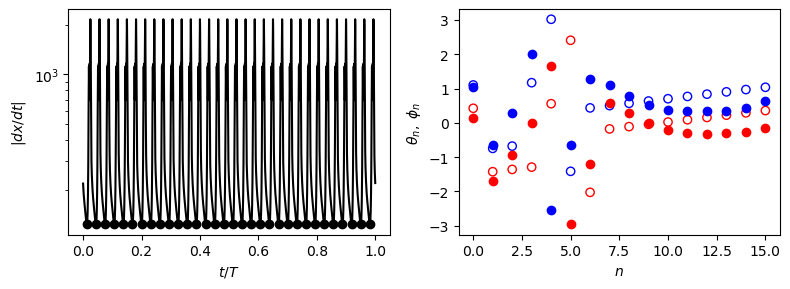

49 rv 0.42717018579 1499.9965161


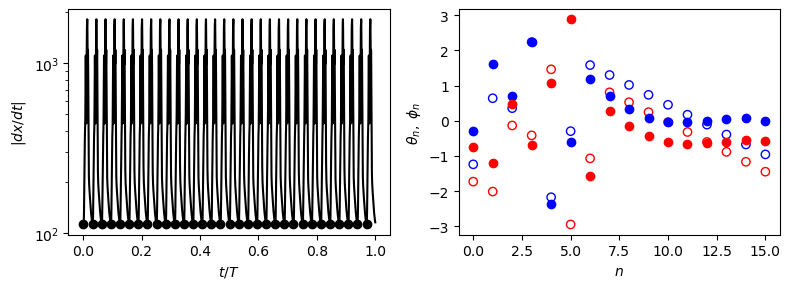

50 fw 0.39047242271 1500.0025936


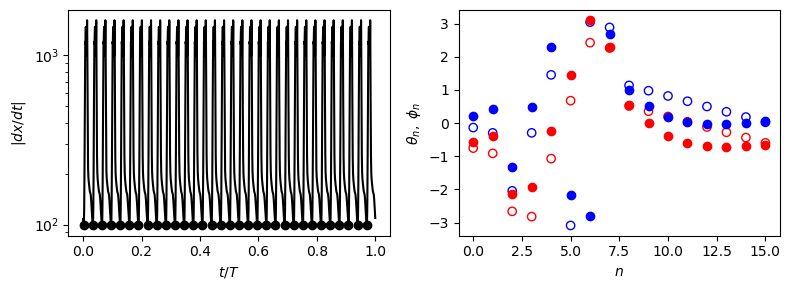

50 rv 0.40484119192 1499.9999997


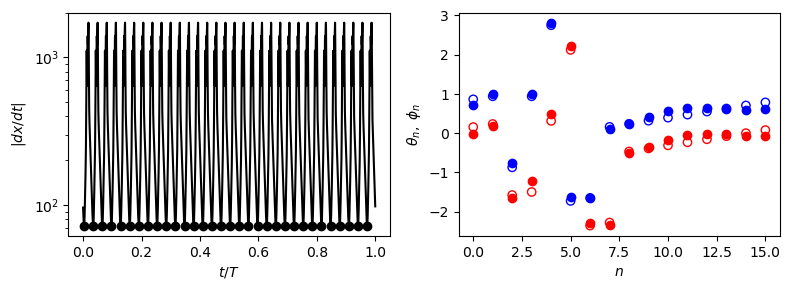

51 fw 0.42758869234 1499.9997774


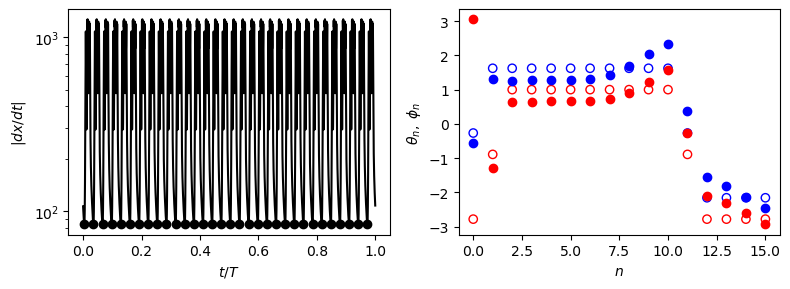

52 fw 0.42758869234 1499.9997774


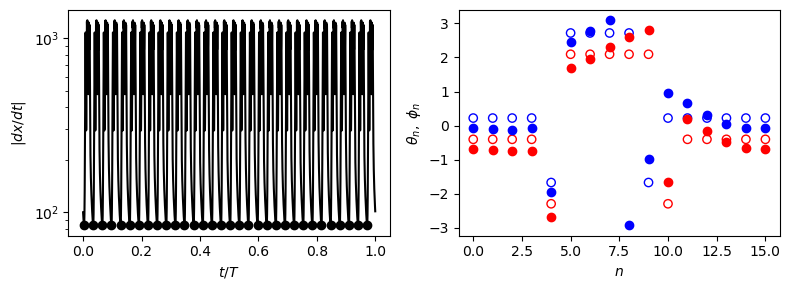

53 fw 0.40858025106 1499.9943096


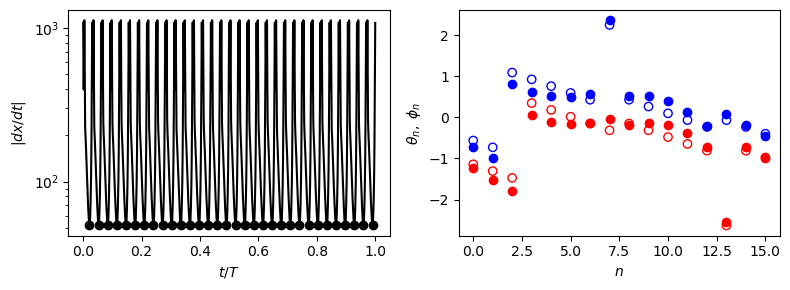

53 rv 0.40858025106 1499.9943096


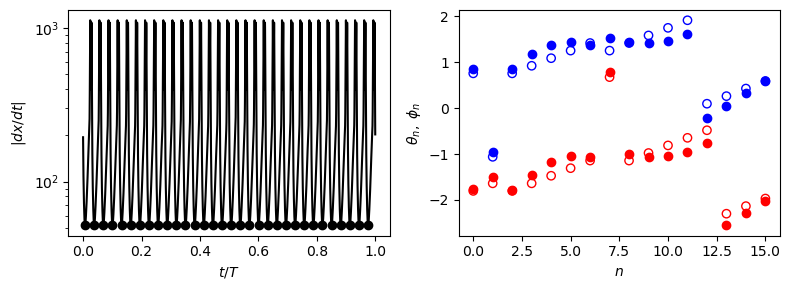

54 fw 0.33265254417 1499.9940233


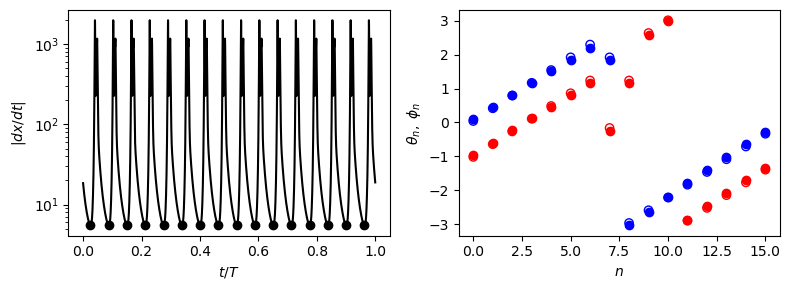

54 rv 0.33265254417 1499.9940233


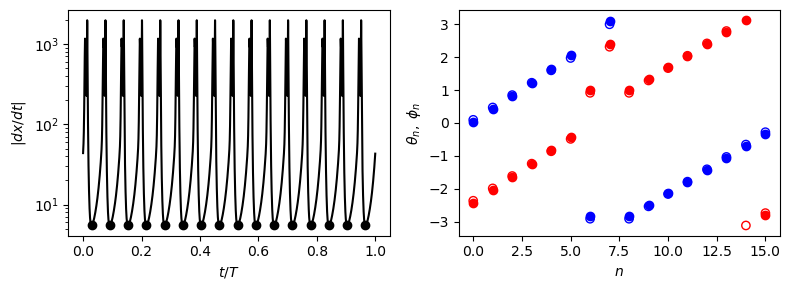

55 fw 0.42216544484 1499.9987602


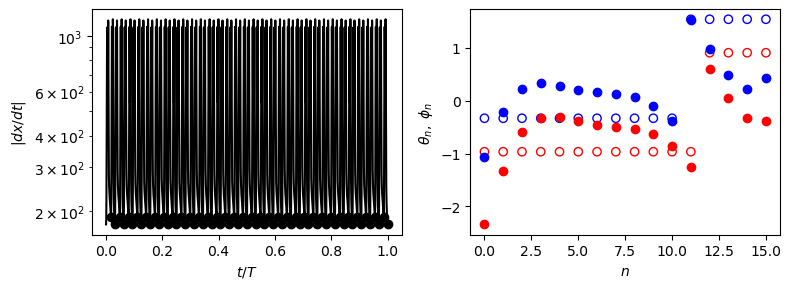

55 rv 0.42216544484 1499.9987602


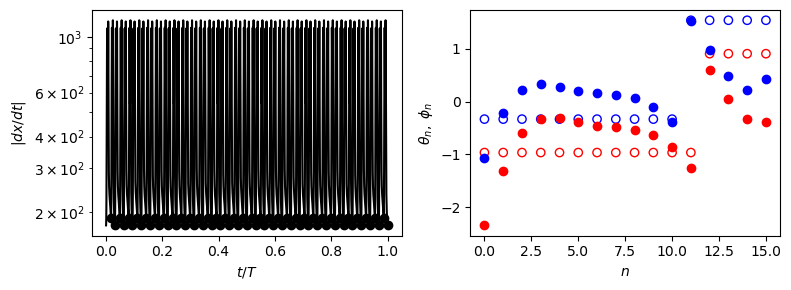

57 fw 0.41541828112 1499.9997656


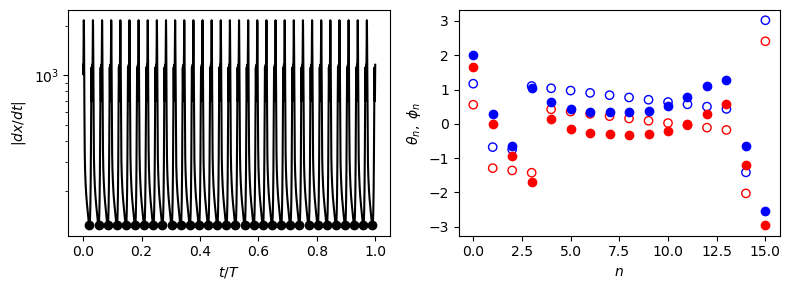

57 rv 0.42717018579 1499.9965161


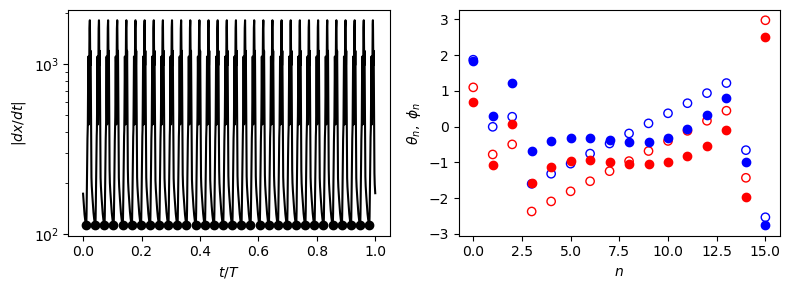

59 fw 0.42758869234 1499.9997774


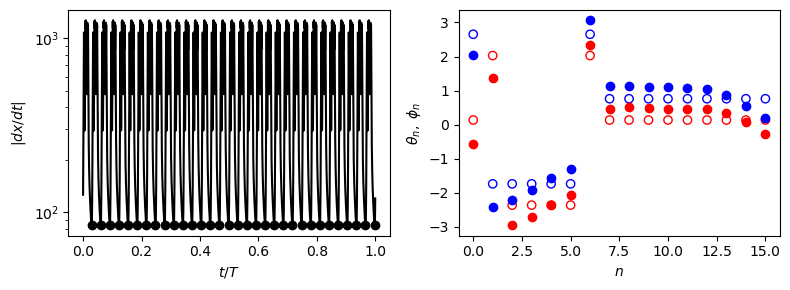

59 rv 0.42758869234 1499.9997774


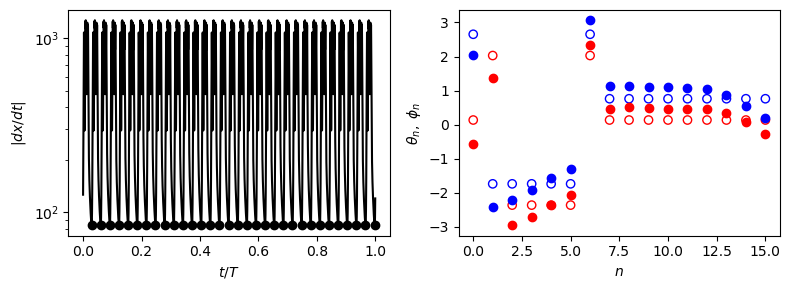

60 fw 0.43301374045 1499.9984443


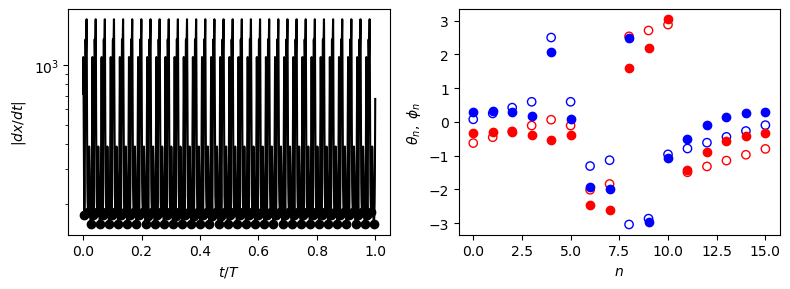

60 rv 0.43257993252 1499.9995838


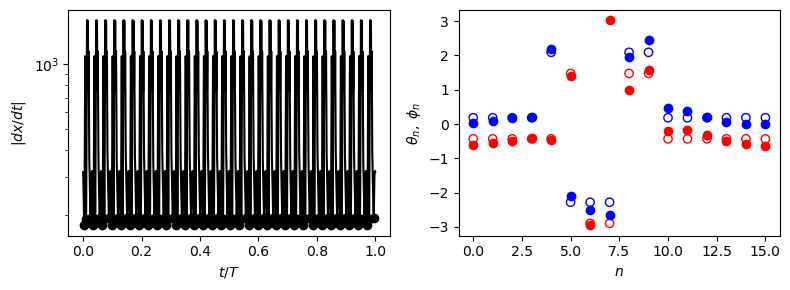

61 fw 0.42758869234 1499.9997774


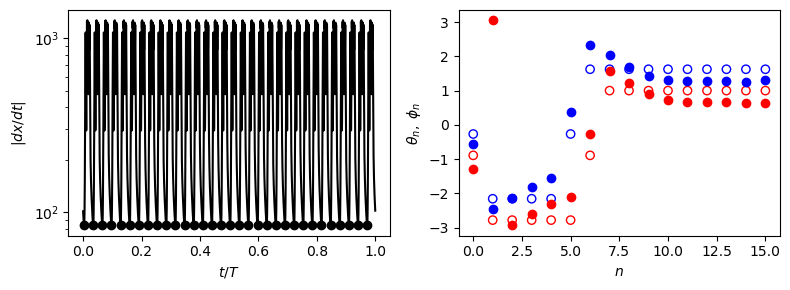

61 rv 0.42758869234 1499.9997774


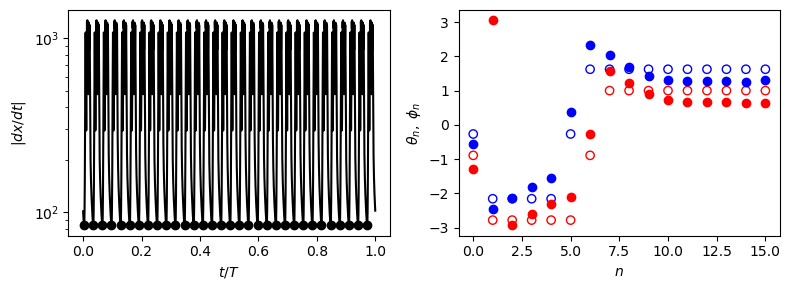

63 fw 0.42758869234 1499.9997774


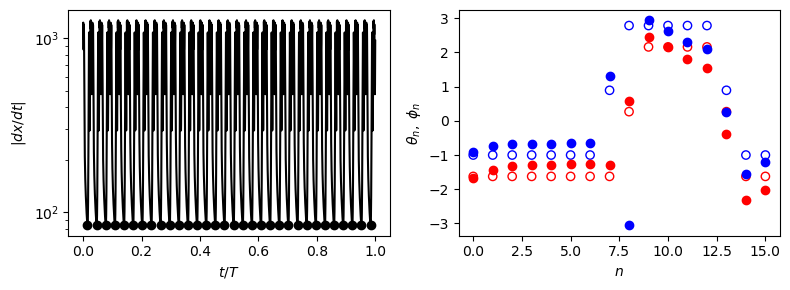

63 rv 0.42758869234 1499.9997774


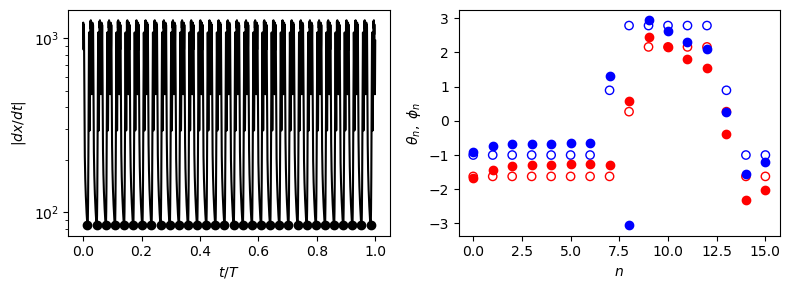

64 fw 0.43301374045 1499.9984442


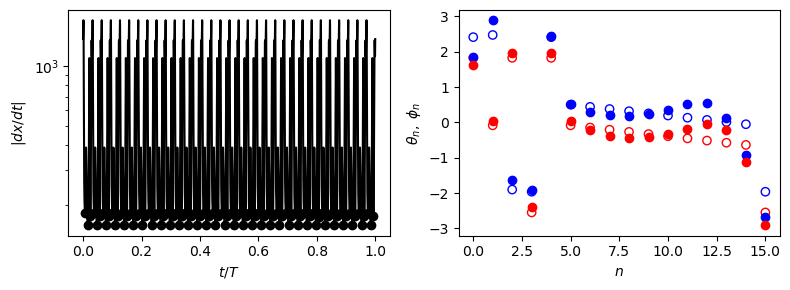

64 rv 0.43257993252 1499.9995838


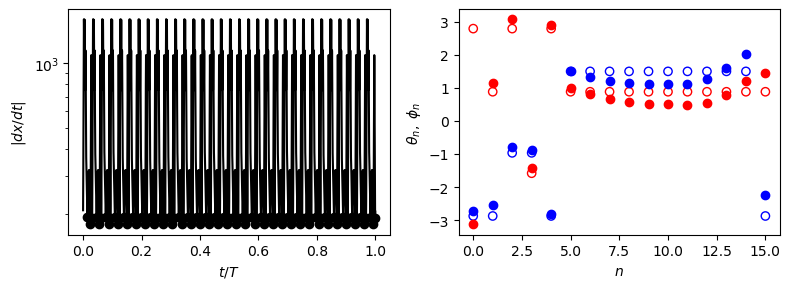

In [12]:
N=16
filebase='data/janus2/'
num_chimeras=np.count_nonzero([st.isdigit() for st in os.listdir(filebase)])

for i in range(1,num_chimeras+1):
    os.system('mkdir -p %s/%i/steadys'%(filebase,i))
    os.system('cp %s/{janus_rel.c,c.steady} %s/%i/steadys'%(filebase,filebase,i))
    file = open(filebase+"%i/steadys/steadys.auto"%(i), "w")
    nocycle=True
    successes=[]
    try:
        for direction in ['fw','rv']:

            total=np.loadtxt(filebase+'%i/%s.dat'%(i,direction))
            if len(total)<=2:
                continue
            if total[-1,2]>500:
                nocycle=False
                print(i, direction, total[-1,0], total[-1,2])
                omega=1.0
                gamma=0.1
                beta=total[-1,0]
                sigma=total[-1,0]
                period=total[-1,2]
                sigma0=total[-1,0]
                t0=0
                sym=0

                tf=np.load(filebase+'%i/%sfinal.dat.npy'%(i,direction))[0]
                xf=np.load(filebase+'%i/%sfinal.dat.npy'%(i,direction))[1:N].T
                yf=np.load(filebase+'%i/%sfinal.dat.npy'%(i,direction))[N:2*N-1].T
                uf=np.load(filebase+'%i/%sfinal.dat.npy'%(i,direction))[2*N-1:3*N-1].T
                vf=np.load(filebase+'%i/%sfinal.dat.npy'%(i,direction))[3*N-1:].T
                phif=np.unwrap(np.arctan2(yf,xf),axis=0)
                phif=np.concatenate([np.zeros(tf.shape).reshape(-1,1),phif],axis=1)
                thetaf=np.unwrap(np.arctan2(vf,uf),axis=0)
                Theta=1/(2*N)*(np.sum(thetaf,axis=1)+np.sum(phif,axis=1))[:,np.newaxis]
                thetaf=np.mod(thetaf-Theta+np.pi,2*np.pi)-np.pi
                phif=np.mod(phif-Theta+np.pi,2*np.pi)-np.pi
                phases=np.concatenate([np.cos(phif),np.sin(phif),np.cos(thetaf),np.sin(thetaf)],axis=1)

                norms=np.linalg.norm(np.diff(phases,axis=0)/np.diff(tf,axis=0)[:,np.newaxis],axis=1)
                inds=find_peaks(-norms,height=-2*np.min(norms))[0]
                successes=[]
                stableinds=np.array(np.where(total[:,9]==4*N-2)[0])
                stablebranches=[]
                jumps=np.where(np.diff(stableinds)>1)[0]
                cuts=np.zeros(2+2*len(jumps),dtype=int)
                cuts[0]=0
                cuts[-1]=-1
                cuts[1:-1:2]=jumps
                cuts[2:-1:2]=jumps+1
                for j in range(0,len(cuts),2):
                    stablebranches=stablebranches+[stableinds[cuts[j]:cuts[j+1]]]

                plt.subplots(1,2,figsize=(8,3))
                print("fw=bd([])",file=file)
                print("rv=bd([])",file=file)
        
                plotted=False
                for ind in inds[:len(inds)//N]:
                    sol=root(lambda x: janus.janus(0,x,N,omega,sigma,beta,gamma,sigma0,0,sym),phases[ind],method='lm')
                    successes=successes+[sol.success]
                    if sol.success:
                        z=(sol.x[:N]+1j*sol.x[N:2*N])
                        w=(sol.x[2*N:3*N]+1j*sol.x[3*N:])
                        x0=np.concatenate([np.real(z/z[0])[1:],np.imag(z/z[0])[1:],np.real(w/z[0]),np.imag(w/z[0])])
                        print("fw=fw+run('janus_rel',c='steady',IPS=1,PAR={1:%f},U={"%(sigma),end='',file=file)
                        for j in range(len(x0)):
                            print("%i:%f,"%(j+1,x0[j]),end='',file=file)
                        print('})',file=file)

                        print("rv=rv+run('janus_rel',c='steady',IPS=1,DS='-',PAR={1:%f},U={"%(sigma),end='',file=file)
                        for j in range(len(x0)):
                            print("%i:%f,"%(j+1,x0[j]),end='',file=file)
                        print('})',file=file)

                    if not plotted:
                        plt.subplot(1,2,1)
                        plt.plot(tf[:-1],norms,c='black')
                        plt.scatter(tf[inds],norms[inds],c='black')

                        plt.xlabel(r'$t/T$')
                        plt.ylabel(r'$|dx/dt|$')
                        plt.yscale('log')

                        plt.subplot(1,2,2)

                        x=sol.x[:N]
                        y=sol.x[N:2*N]
                        u=sol.x[2*N:3*N]
                        v=sol.x[3*N:]
                        phi=np.arctan2(y,x)
                        theta=np.arctan2(v,u)
                        plt.scatter(np.arange(N),phi,facecolors='none',edgecolors='b',label=r'$\phi$ root')
                        plt.scatter(np.arange(N),theta,facecolors='none',edgecolors='r', label=r'$\theta$ root')

                        x=phases[ind][:N]
                        y=phases[ind][N:2*N]
                        u=phases[ind][2*N:3*N]
                        v=phases[ind][3*N:]
                        phi=np.arctan2(y,x)
                        theta=np.arctan2(v,u)
                        plt.scatter(np.arange(N),phi,facecolors='b',edgecolors='b',label=r'$\phi$ min')
                        plt.scatter(np.arange(N),theta,facecolors='r',edgecolors='r',label=r'$\theta$ min')

                        plt.xlabel(r'$n$')
                        plt.ylabel(r'$\theta_n,~\phi_n$')
                        
                        plotted=True

                print("sv(fw,'steady%sfw')"%(direction), file=file)
                print("sv(rv,'steady%srv')"%(direction), file=file)
                print('total=fw+rv', file=file)
                print("total.writeRawFilename('total%ssteady.dat')"%(direction), file=file)

#                 plt.legend()

                plt.tight_layout()
                plt.savefig(filebase+'%i/%ssteadys.pdf'%(i,direction))
                plt.show()

    except Exception as e:
        pass
    
    print('cl()',file=file)
    file.close()
    if not np.any(successes):
        os.system('rm '+ filebase+"%i/steadys/steadys.auto"%(i))                

continuation plots

/tmp/ipykernel_87299/3606536802.py:72: UserWarning: loadtxt: input contained no data: "data/janus2/6/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))
/tmp/ipykernel_87299/3606536802.py:72: UserWarning: loadtxt: input contained no data: "data/janus2/16/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))
/tmp/ipykernel_87299/3606536802.py:72: UserWarning: loadtxt: input contained no data: "data/janus2/26/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))
/tmp/ipykernel_87299/3606536802.py:72: UserWarning: loadtxt: input contained no data: "data/janus2/35/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))
/tmp/ipykernel_87299/3606536802.py:72: UserWarning: loadtxt: input contained no data: "data/janus2/36/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))
/tmp/ipykernel_87299/3606536802.py:72: UserWarning: loadtxt: input contained no data: "data/janus2/56/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))
/tmp/ipykernel_87299/3606536802.py:72: UserWarning: loadtxt: input contained no data: "da

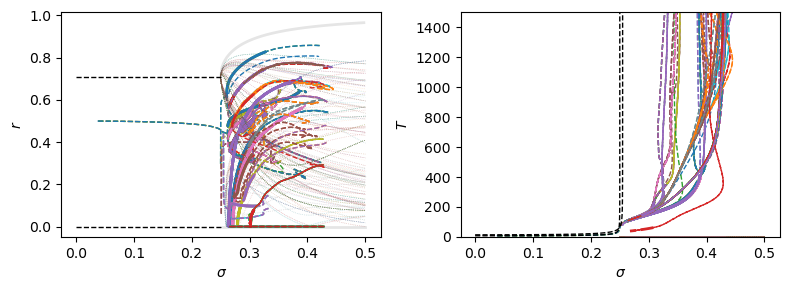

In [29]:
N=16
filebase='data/janus2/'
num_chimeras=np.count_nonzero([st.isdigit() for st in os.listdir(filebase)])

steadyalpha=0.1
allsbps=[]
plt.subplots(1,2,figsize=(8,3))
for i in range(1,num_chimeras+1):
    try:
        br=np.loadtxt(filebase+'%i/total.dat'%(i))
        if len(br)<=2:
            continue
        stableinds=np.array(np.where(br[:,9]==4*N-2)[0])
        stablebranches=[]
        jumps=np.where(np.diff(stableinds)>1)[0]
        cuts=np.zeros(2+2*len(jumps),dtype=int)
        cuts[0]=0
        cuts[-1]=-1
        cuts[1:-1:2]=jumps
        cuts[2:-1:2]=jumps+1
        for j in range(0,len(cuts),2):
            stablebranches=stablebranches+[stableinds[cuts[j]:cuts[j+1]]]

        smallinds=np.where(np.abs(br[:,7])<0.25)[0]
        jumps=np.where(np.diff(smallinds)>1)[0]
        cuts=np.zeros(2+2*len(jumps),dtype=int)
        cuts[0]=0
        cuts[-1]=-1
        cuts[1:-1:2]=jumps
        cuts[2:-1:2]=jumps+1
        smallbranches=[]
        for j in range(0,len(cuts),2):
            smallbranches=smallbranches+[br[smallinds[cuts[j]:cuts[j+1]]]]
        sbps=[]
        for smallbr in smallbranches:
            inds=np.where(np.diff(np.sign(smallbr[:,7]))!=0)[0]
            sbps=sbps+[smallbr[inds]]
        sbps=np.concatenate(sbps,axis=0)
        
        smallinds=np.where(np.abs(br[:,4])<1E-4)[0]
        smallinds=smallinds[np.concatenate([np.where(np.diff(smallinds)>1)[0],[-1]])]
        lps=br[smallinds]

        smallinds=np.where(np.abs(br[:,5])<1E-4)[0]
        smallinds=smallinds[np.concatenate([np.where(np.diff(smallinds)>1)[0],[-1]])]
        trs=br[smallinds]

        
        plt.subplot(1,2,1)
        plt.plot(br[:,0],br[:,3],ls='--',c=colors[i%len(colors)],lw=1)
        for branch in stablebranches:
            plt.plot(br[branch,0],br[branch,3],c=colors[i%len(colors)],lw=2)

        plt.xlabel(r'$\sigma$')
        plt.ylabel(r'$r$')
        
        plt.subplot(1,2,2)
        plt.plot(br[:,0],br[:,2],ls='--',c=colors[i%len(colors)],lw=1)
        for branch in stablebranches:
            plt.plot(br[branch,0],br[branch,2],c=colors[i%len(colors)],lw=2)

        plt.ylim(0,1500)
        plt.xlabel(r'$\sigma$')
        plt.ylabel(r'$T$')
        
    except:
        pass
    
    try:
        br=np.loadtxt(filebase+'%i/sw.dat'%(i))
        if len(br)<=2:
            continue

        stableinds=np.array(np.where(br[:,9]==4*N-2)[0])
        stablebranches=[]
        jumps=np.where(np.diff(stableinds)>1)[0]
        cuts=np.zeros(2+2*len(jumps),dtype=int)
        cuts[0]=0
        cuts[-1]=-1
        cuts[1:-1:2]=jumps
        cuts[2:-1:2]=jumps+1
        for j in range(0,len(cuts),2):
            stablebranches=stablebranches+[stableinds[cuts[j]:cuts[j+1]]]

        smallinds=np.where(np.abs(br[:,7])<0.25)[0]
        jumps=np.where(np.diff(smallinds)>1)[0]
        cuts=np.zeros(2+2*len(jumps),dtype=int)
        cuts[0]=0
        cuts[-1]=-1
        cuts[1:-1:2]=jumps
        cuts[2:-1:2]=jumps+1
        smallbranches=[]
        for j in range(0,len(cuts),2):
            smallbranches=smallbranches+[br[smallinds[cuts[j]:cuts[j+1]]]]
        sbps=[]
        for smallbr in smallbranches:
            inds=np.where(np.diff(np.sign(smallbr[:,7]))!=0)[0]
            sbps=sbps+[smallbr[inds]]
        sbps=np.concatenate(sbps,axis=0)
        allsbps=allsbps+[sbps]
        
        smallinds=np.where(np.abs(br[:,4])<1E-4)[0]
        smallinds=smallinds[np.concatenate([np.where(np.diff(smallinds)>1)[0],[-1]])]
        lps=br[smallinds]

        smallinds=np.where(np.abs(br[:,5])<1E-4)[0]
        smallinds=smallinds[np.concatenate([np.where(np.diff(smallinds)>1)[0],[-1]])]
        trs=br[smallinds]

        
        plt.subplot(1,2,1)
        plt.plot(br[:,0],br[:,3],ls='--',c=colors[i%len(colors)],lw=1)

        plt.xlabel(r'$\sigma$')
        plt.ylabel(r'$r$')
        
        plt.subplot(1,2,2)
        plt.plot(br[:,0],br[:,2],ls='--',c=colors[i%len(colors)],lw=1)
            
        plt.ylim(0,1500)
        plt.xlabel(r'$\sigma$')
        plt.ylabel(r'$T$')
        
    except:
        pass
    
    
    try:
        file=open(filebase+'%i/steadys/totalfwsteady.dat'%(i),'r')
        test=file.read().strip().split('\n')
        starts=np.concatenate([[0],1+np.where(np.array(test)=='')[0]])
        ends=np.concatenate([np.where(np.array(test)=='')[0],[-1]])

        branches=[]
        for j in range(len(starts)):
            branches=branches+[np.array([line.split() for line in test[starts[j]:ends[j]]],dtype=float)]
            
        file.close()
        for br in branches:
            stableinds=np.array(np.where(br[:,9]==4*N-2)[0])
            stablebranches=[]
            jumps=np.where(np.diff(stableinds)>1)[0]
            cuts=np.zeros(2+2*len(jumps),dtype=int)
            cuts[0]=0
            cuts[-1]=-1
            cuts[1:-1:2]=jumps
            cuts[2:-1:2]=jumps+1
            for j in range(0,len(cuts),2):
                stablebranches=stablebranches+[stableinds[cuts[j]:cuts[j+1]]]
            sbp=np.array(np.where(np.abs(np.diff(br[:,9]))>2)[0])
            plt.subplot(1,2,1)
            plt.plot(br[:,0],br[:,3],ls=':',c=colors[i%len(colors)],lw=0.5,alpha=steadyalpha)
            for branch in stablebranches:
                plt.plot(br[branch,0],br[branch,3],c=colors[i%len(colors)],lw=2,alpha=steadyalpha)

            plt.xlabel(r'$\sigma$')
            plt.ylabel(r'$r$')

            plt.subplot(1,2,2)
            plt.plot(br[:,0],0*br[:,2],ls=':',c=colors[i%len(colors)],lw=0.5,alpha=steadyalpha)
            for branch in stablebranches:
                plt.plot(br[branch,0],0*br[branch,2],c=colors[i%len(colors)],lw=2,alpha=steadyalpha)
            plt.xlabel(r'$\sigma$')
            plt.ylabel(r'$T$')
        
    except:
        pass
    
    try:
        file=open(filebase+'%i/steadys/totalrvsteady.dat'%(i),'r')
        test=file.read().strip().split('\n')
        starts=np.concatenate([[0],1+np.where(np.array(test)=='')[0]])
        ends=np.concatenate([np.where(np.array(test)=='')[0],[-1]])

        branches=[]
        for j in range(len(starts)):
            branches=branches+[np.array([line.split() for line in test[starts[j]:ends[j]]],dtype=float)]
            
        file.close()
        for br in branches:
            stableinds=np.array(np.where(br[:,9]==4*N-2)[0])
            stablebranches=[]
            jumps=np.where(np.diff(stableinds)>1)[0]
            cuts=np.zeros(2+2*len(jumps),dtype=int)
            cuts[0]=0
            cuts[-1]=-1
            cuts[1:-1:2]=jumps
            cuts[2:-1:2]=jumps+1
            for j in range(0,len(cuts),2):
                stablebranches=stablebranches+[stableinds[cuts[j]:cuts[j+1]]]
            sbp=np.array(np.where(np.abs(np.diff(br[:,9]))>2)[0])

            plt.subplot(1,2,1)
            plt.plot(br[:,0],br[:,3],ls=':',c=colors[i%len(colors)],lw=0.5,alpha=steadyalpha)
            for branch in stablebranches:
                plt.plot(br[branch,0],br[branch,3],c=colors[i%len(colors)],lw=2,alpha=steadyalpha)

            plt.xlabel(r'$\sigma$')
            plt.ylabel(r'$r$')


            plt.subplot(1,2,2)
            plt.plot(br[:,0],0*br[:,2],ls=':',c=colors[i%len(colors)],lw=0.5,alpha=steadyalpha)
            for branch in stablebranches:
                plt.plot(br[branch,0],0*br[branch,2],c=colors[i%len(colors)],lw=2,alpha=steadyalpha)
            plt.xlabel(r'$\sigma$')
            plt.ylabel(r'$T$')
        
    except:
        pass


plt.subplot(1,2,1)
plt.plot([0,0.25],[0.5**0.5,0.5**0.5],ls='--',c='black',lw=1)
sigmas=np.arange(100)*0.25/100+0.25
plt.plot(sigmas,(0.5+0.5*(1-1/(16*sigmas**2))**0.5)**0.5,ls='-',c='black',lw=2,alpha=steadyalpha)
plt.plot(sigmas,(0.5-0.5*(1-1/(16*sigmas**2))**0.5)**0.5,ls=':',c='black',lw=0.5,alpha=steadyalpha)
nu=2*np.pi/N
sigmac=1/(2*(2*(1+np.cos(nu)))**0.5)
plt.plot([0,sigmac],[0,0],ls='--',c='black',lw=1)
plt.plot([sigmac,0.5],[0,0],ls='-',c='black',lw=2,alpha=steadyalpha)

plt.subplot(1,2,2)
sigmas=np.arange(10001)/10000*0.25-1e-6
plt.plot(sigmas,2*np.pi/(1-16*sigmas**2)**0.5,ls='--',c='black',lw=1)
sigmac=1/(2*(2*(1+np.cos(nu)))**0.5)
sigmas=np.arange(10001)/10000*sigmac-1e-6
plt.plot(sigmas,2*np.pi/(1/2*(1-8*(1+np.cos(nu))*sigmas**2)**0.5),ls='--',c='black',lw=1)


plt.tight_layout()
plt.savefig(filebase+'allbranches.pdf')
plt.show()

1


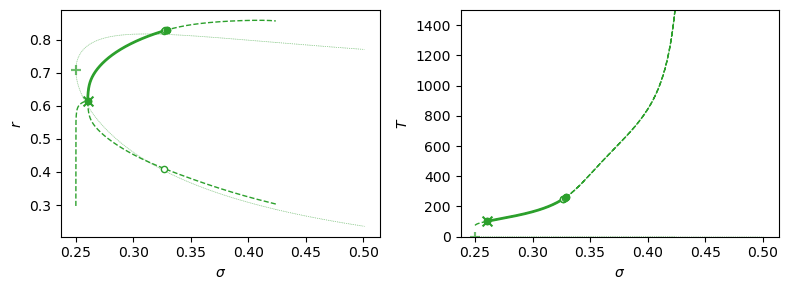

2


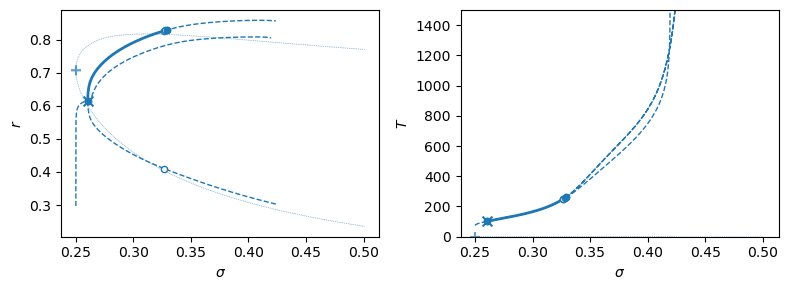

3


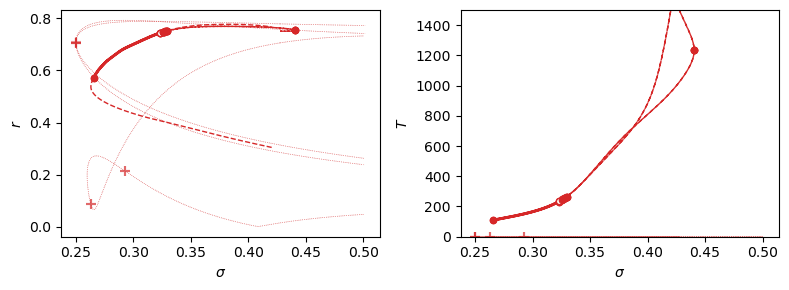

4


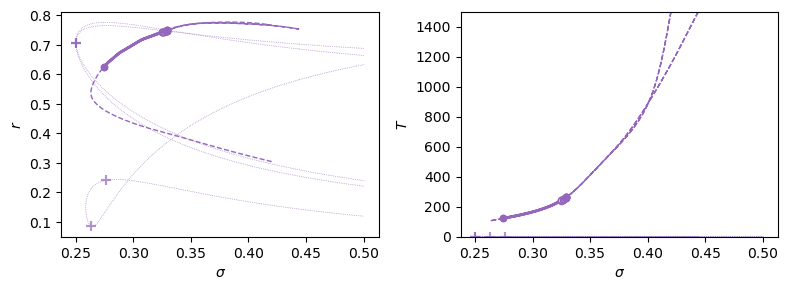

5


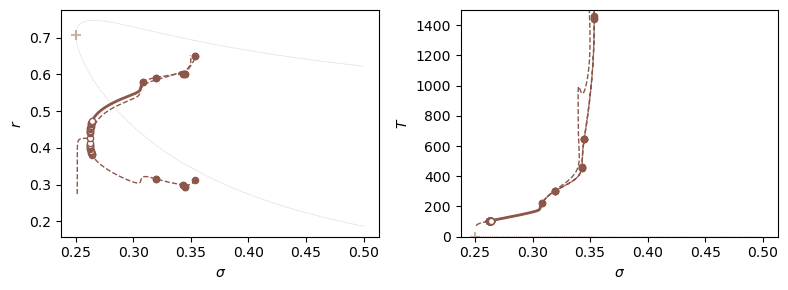

6


/tmp/ipykernel_87299/1565806137.py:110: UserWarning: loadtxt: input contained no data: "data/janus2/6/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))


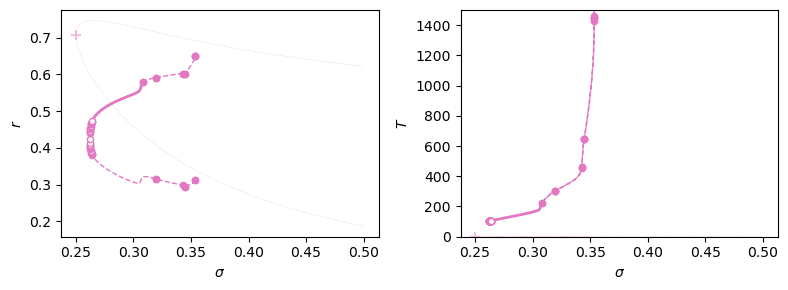

7


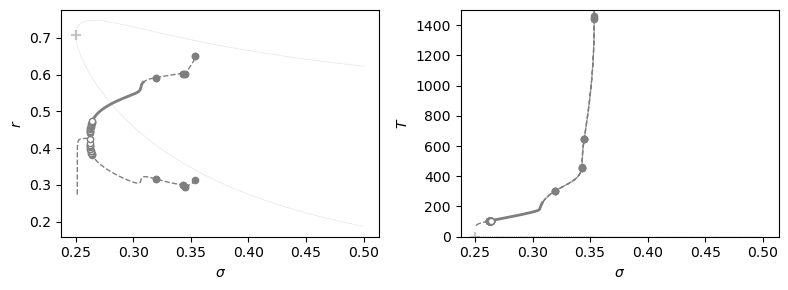

8


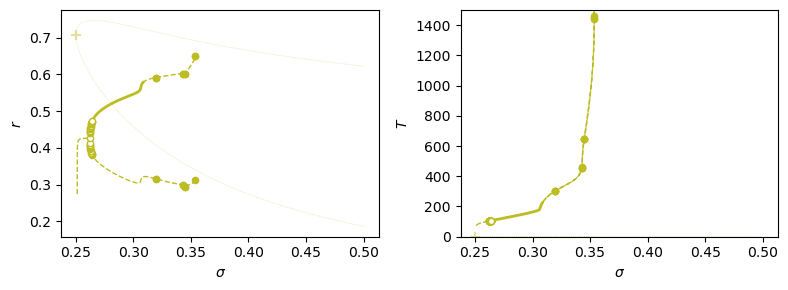

9


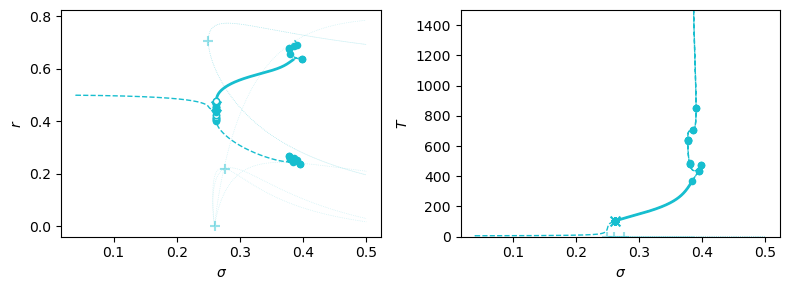

10


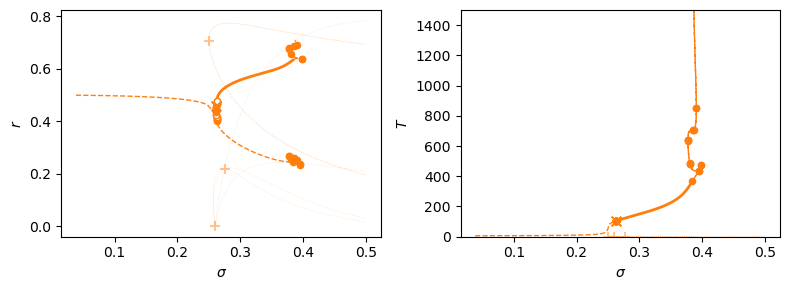

11


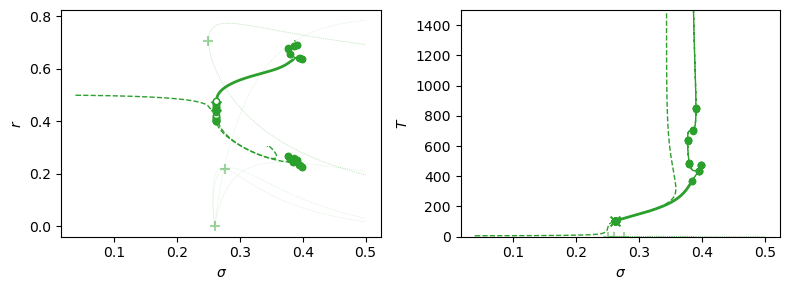

12


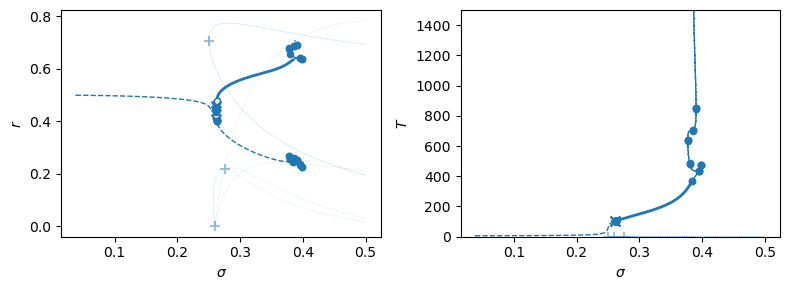

13


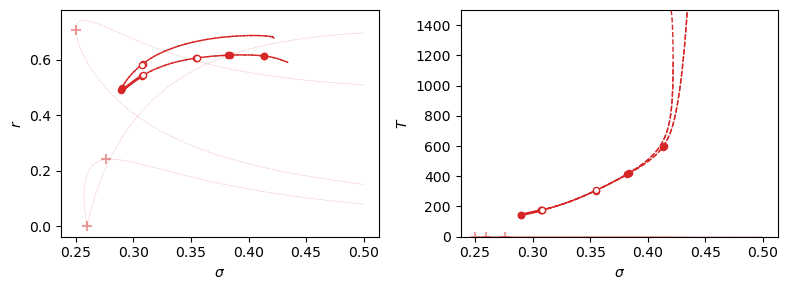

14


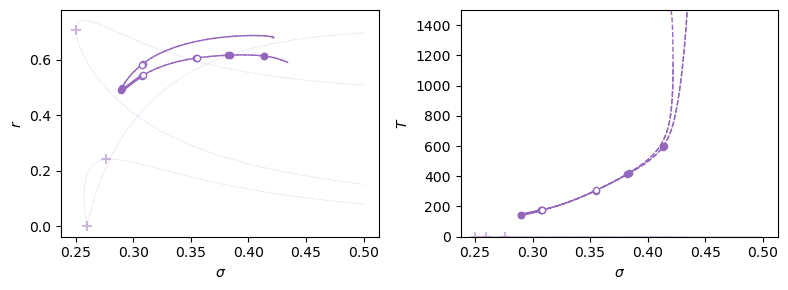

15


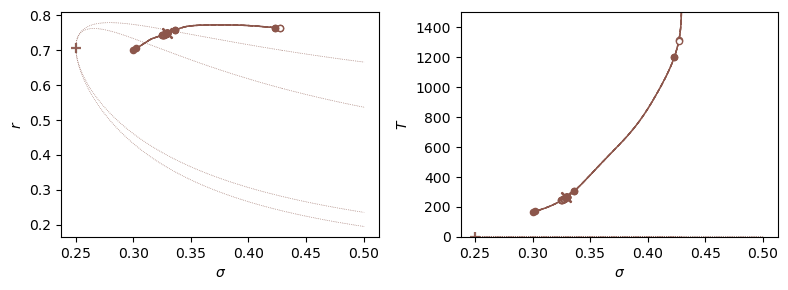

16


/tmp/ipykernel_87299/1565806137.py:110: UserWarning: loadtxt: input contained no data: "data/janus2/16/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))


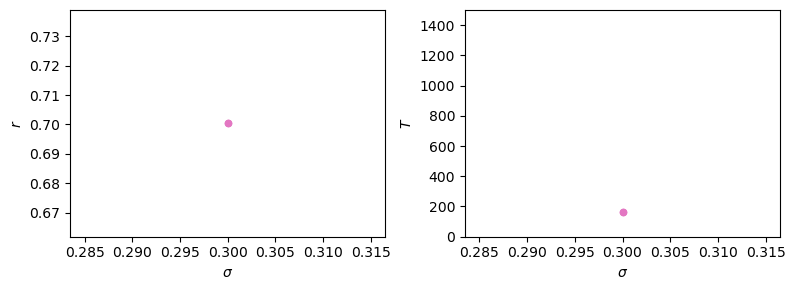

17


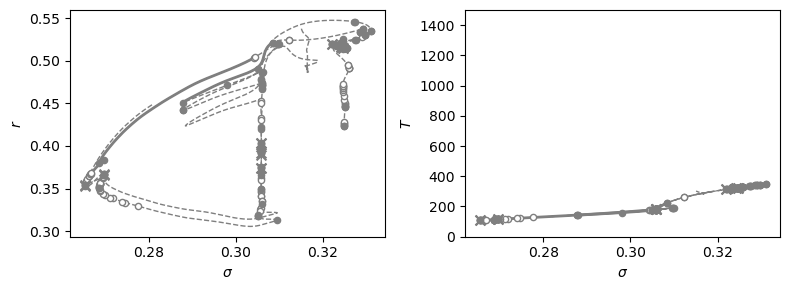

18


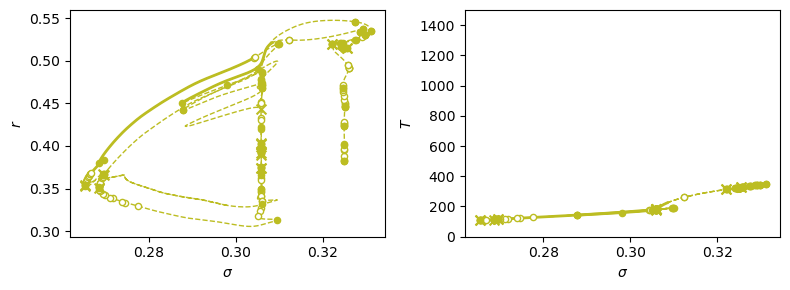

19


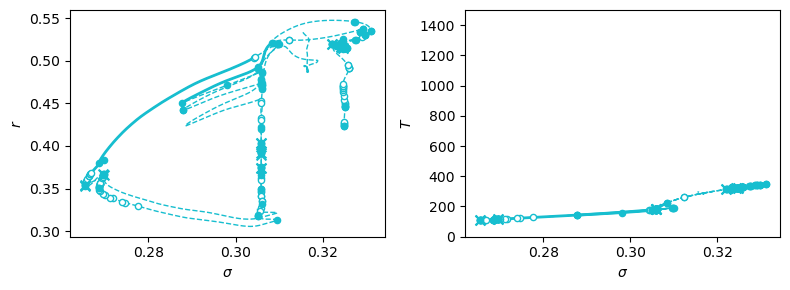

20


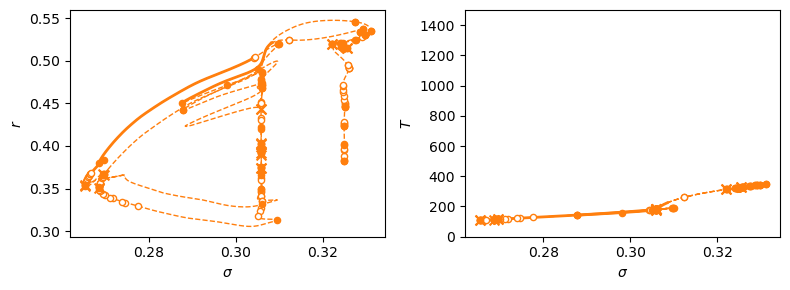

21


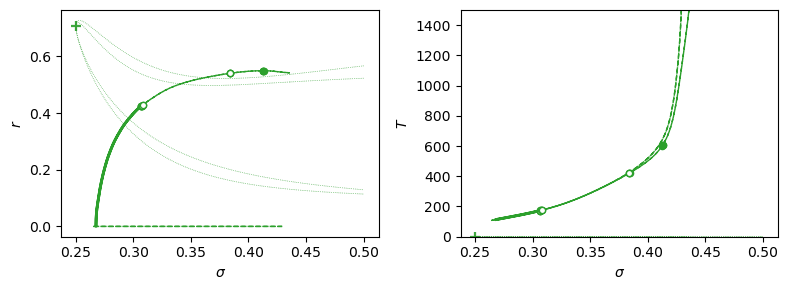

22


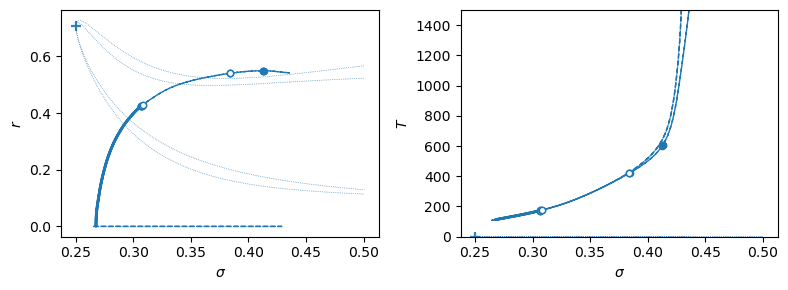

23


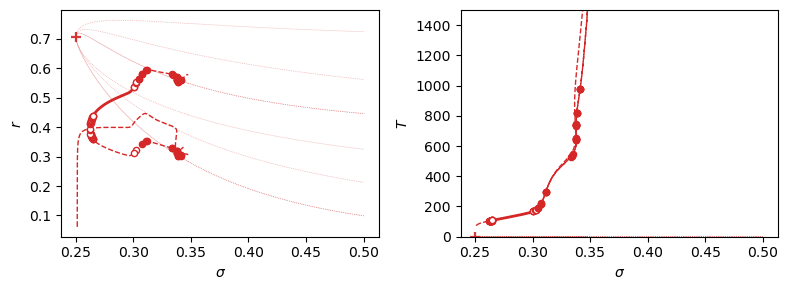

24


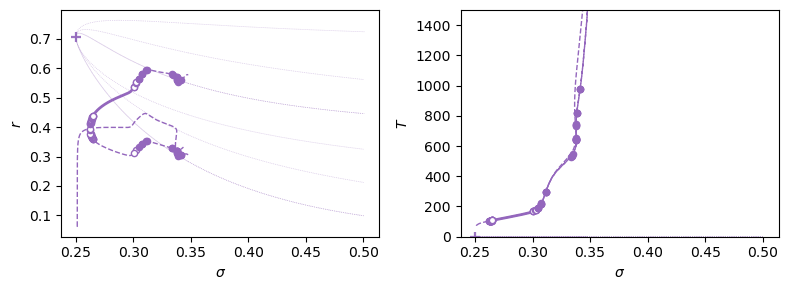

25


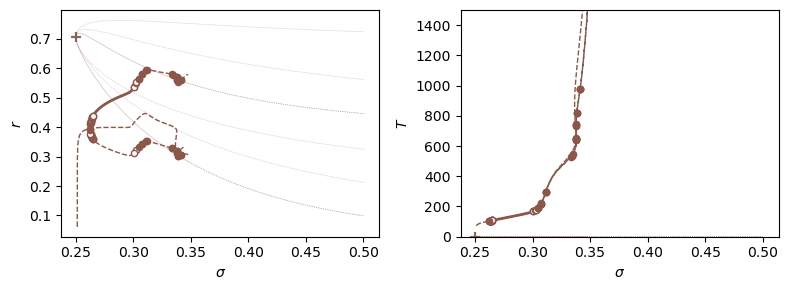

26


/tmp/ipykernel_87299/1565806137.py:110: UserWarning: loadtxt: input contained no data: "data/janus2/26/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))


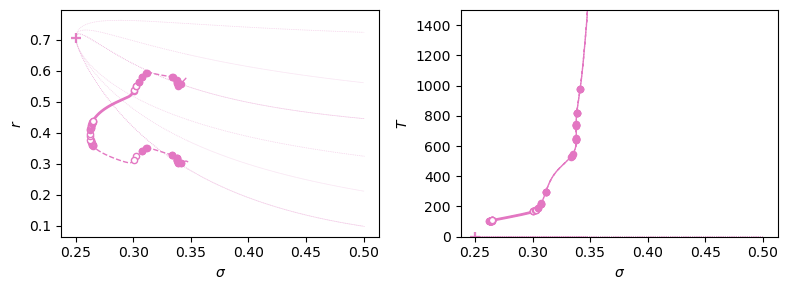

27


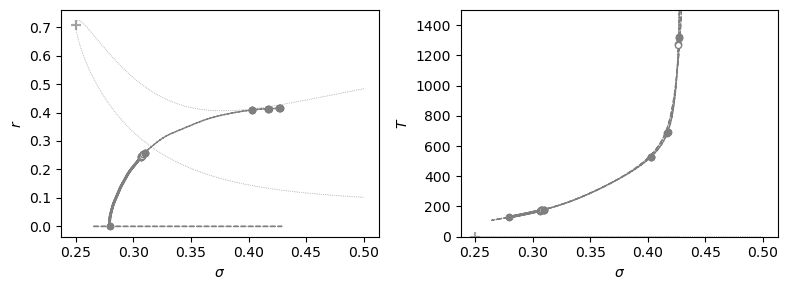

28


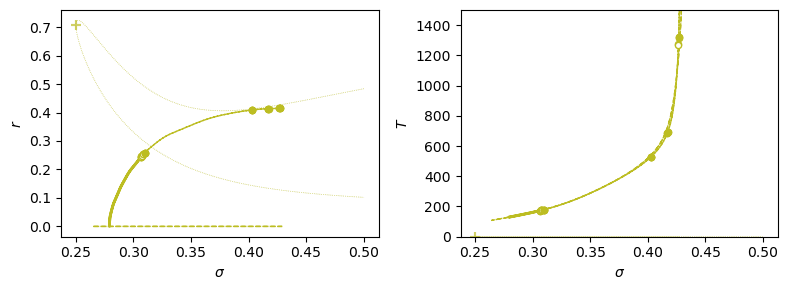

29


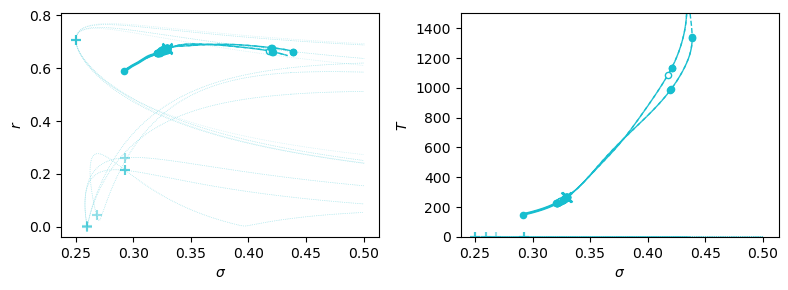

30


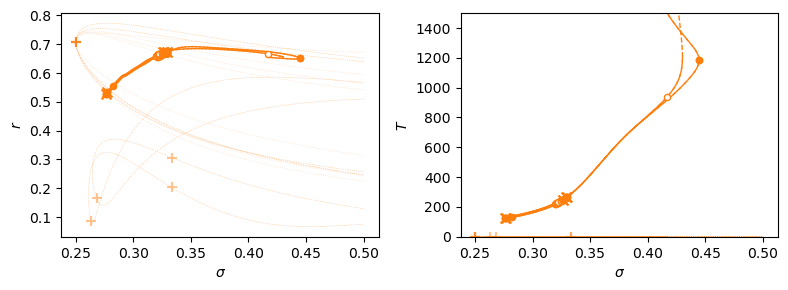

31


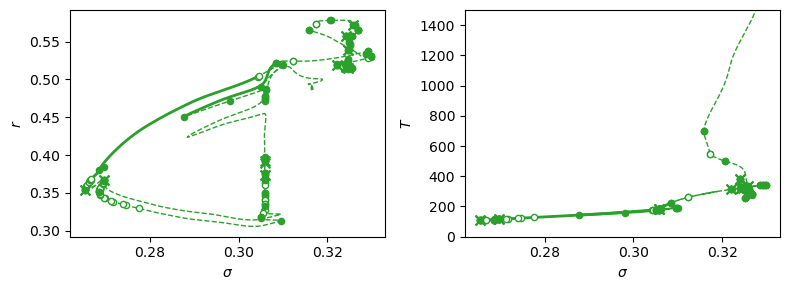

32


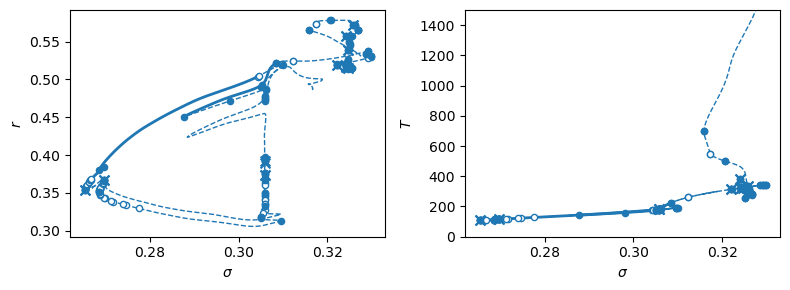

33


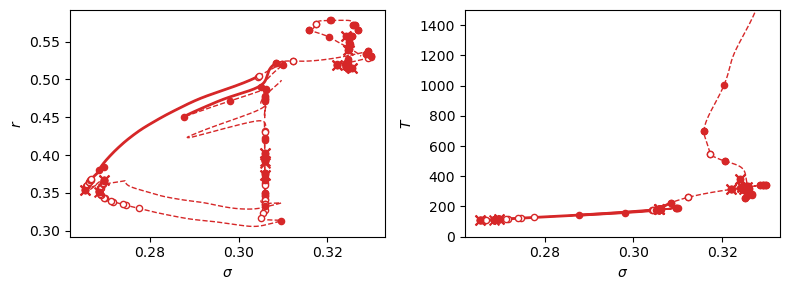

34


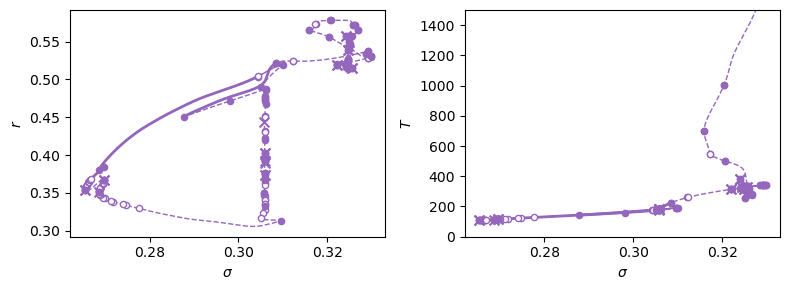

35


/tmp/ipykernel_87299/1565806137.py:110: UserWarning: loadtxt: input contained no data: "data/janus2/35/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))


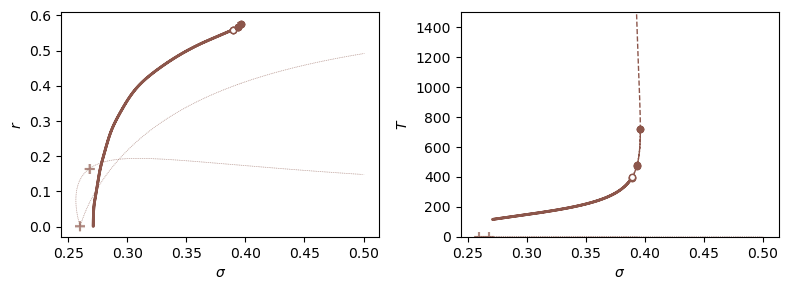

36


/tmp/ipykernel_87299/1565806137.py:110: UserWarning: loadtxt: input contained no data: "data/janus2/36/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))


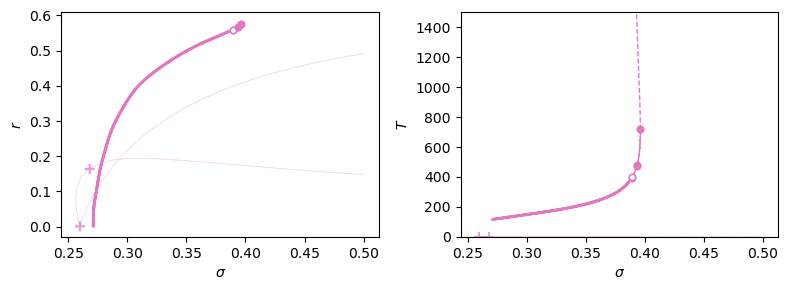

37


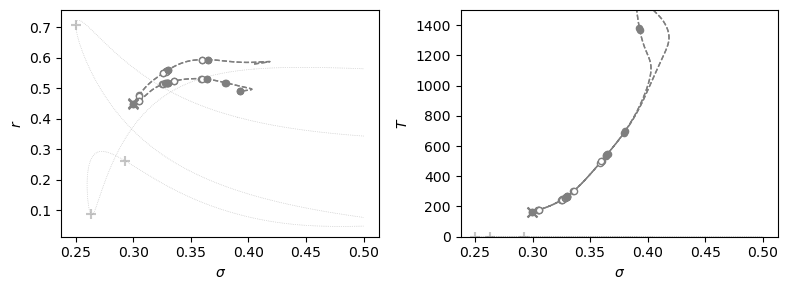

38


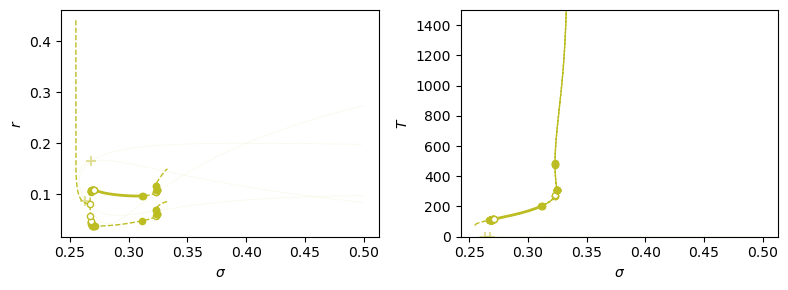

39


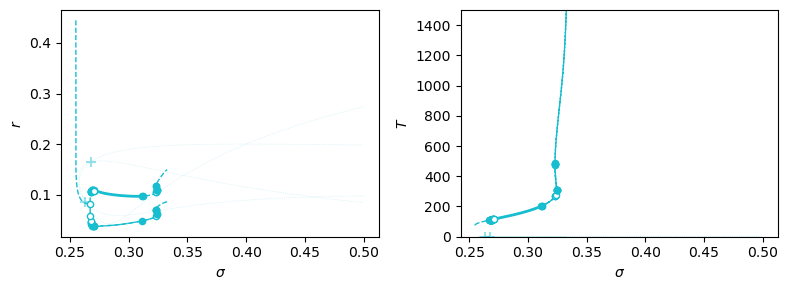

40


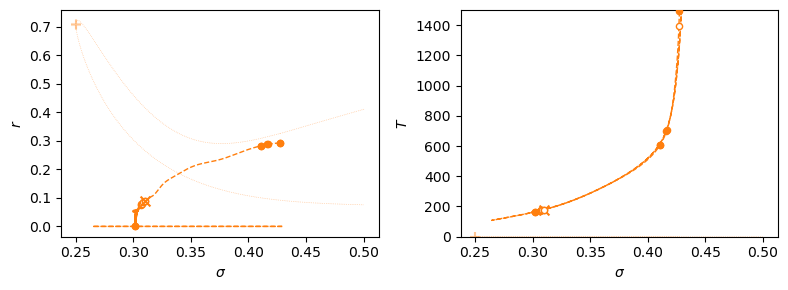

41


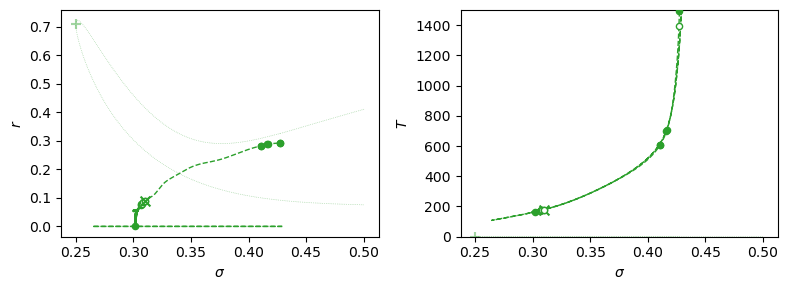

42


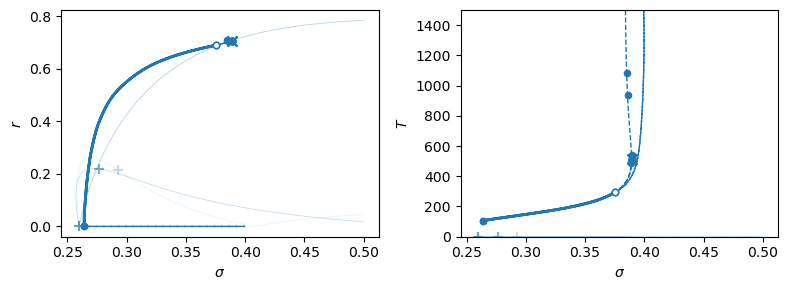

43


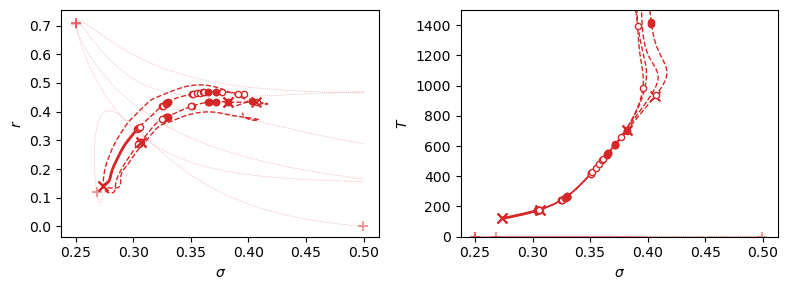

44


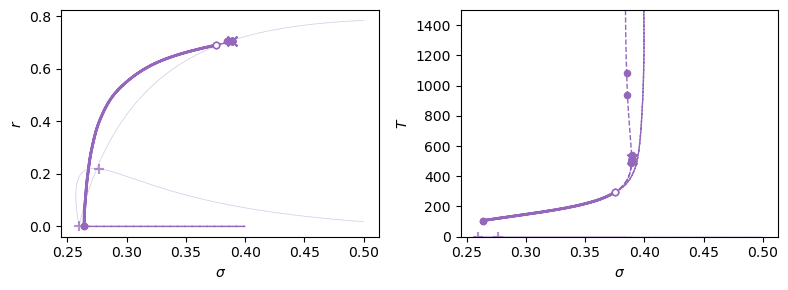

45


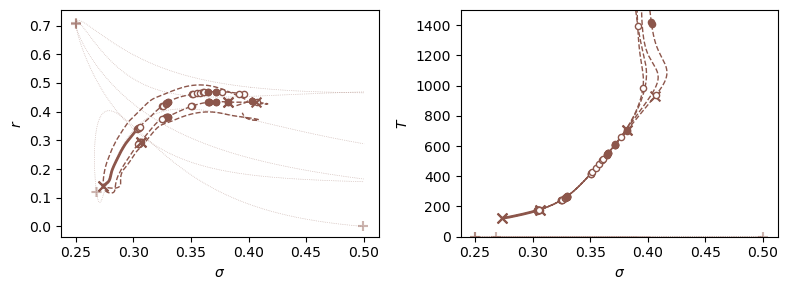

46


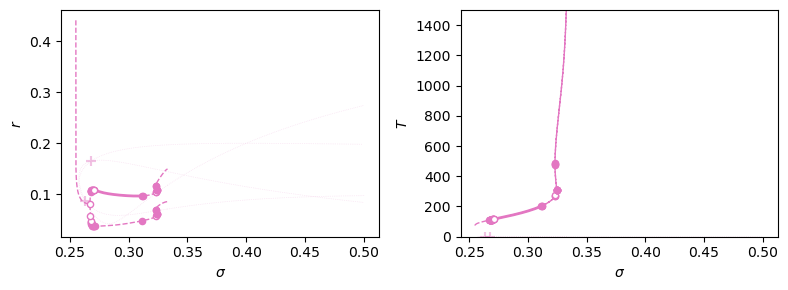

47


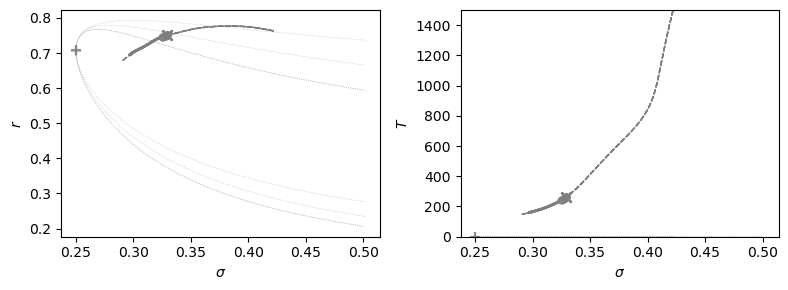

48


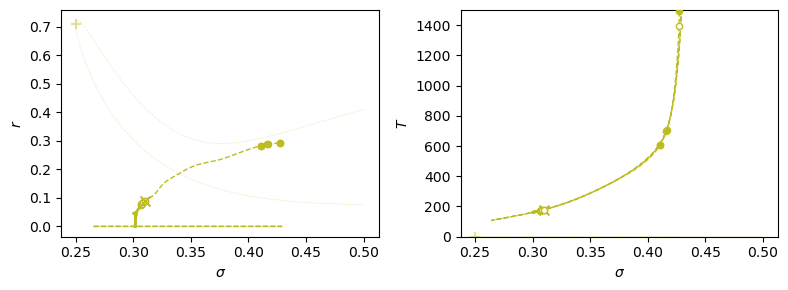

49


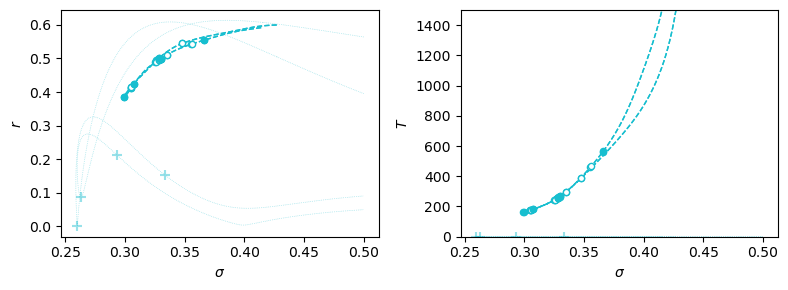

50


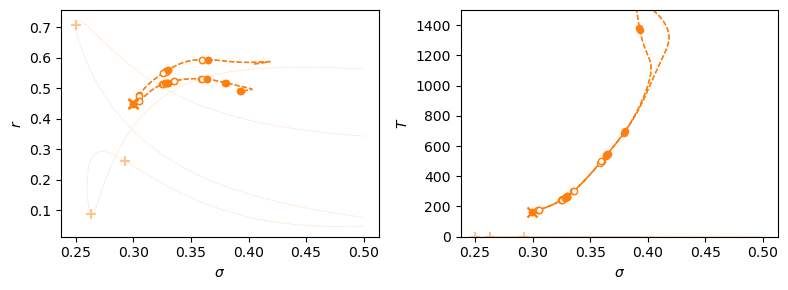

51


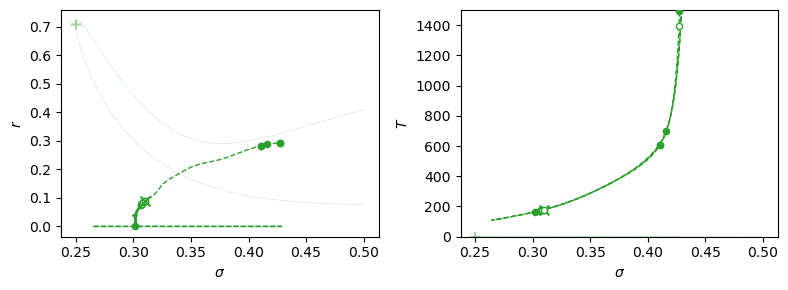

52


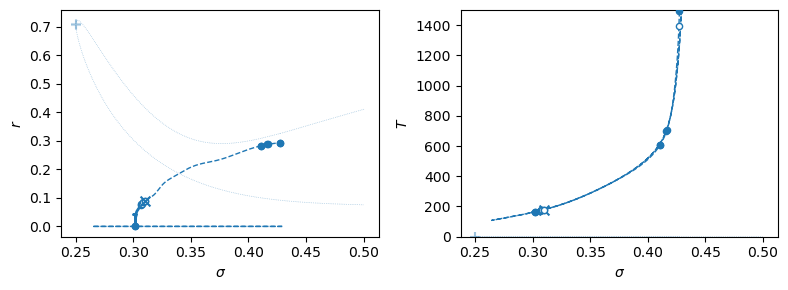

53


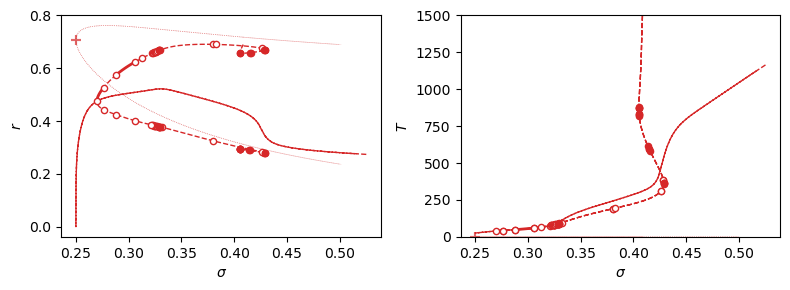

54


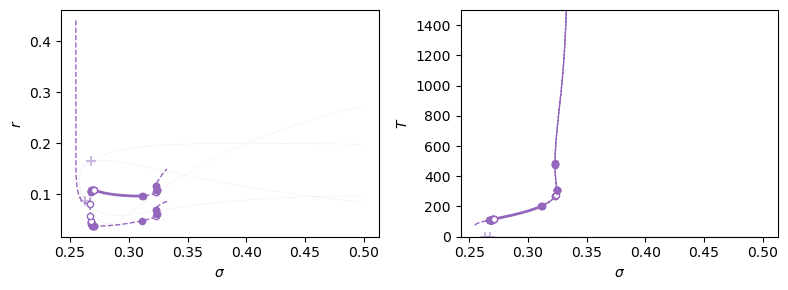

55


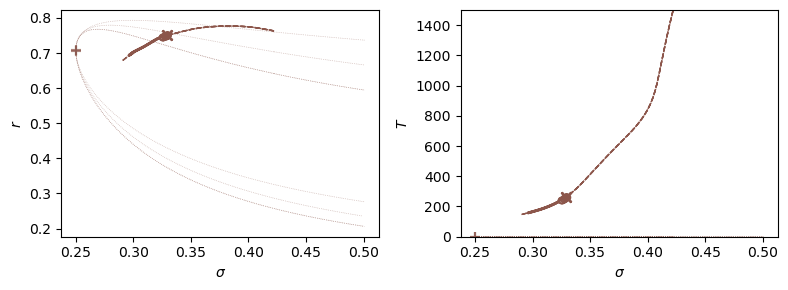

56


/tmp/ipykernel_87299/1565806137.py:110: UserWarning: loadtxt: input contained no data: "data/janus2/56/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))


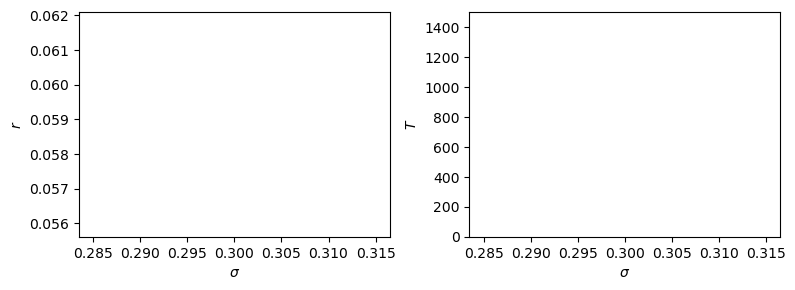

57


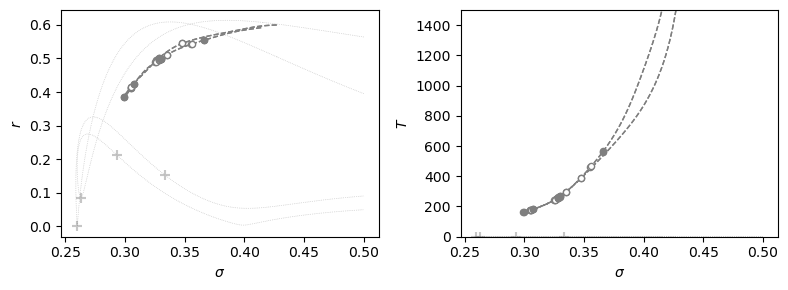

58


/tmp/ipykernel_87299/1565806137.py:110: UserWarning: loadtxt: input contained no data: "data/janus2/58/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))


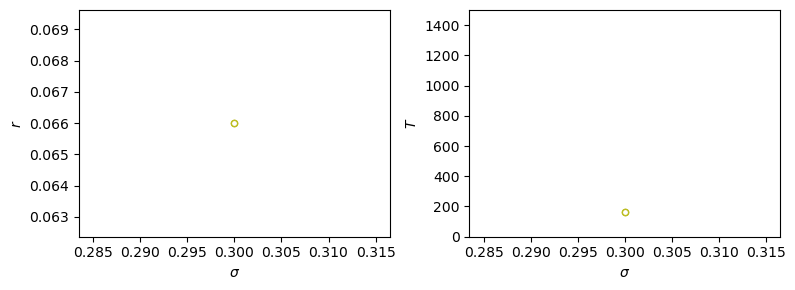

59


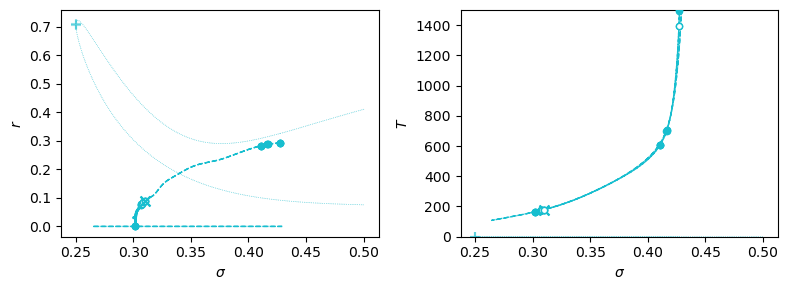

60


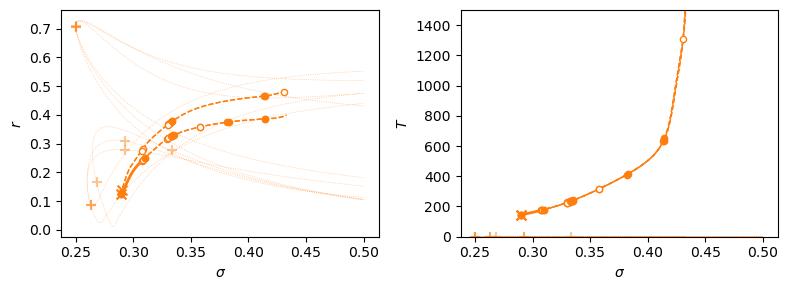

61


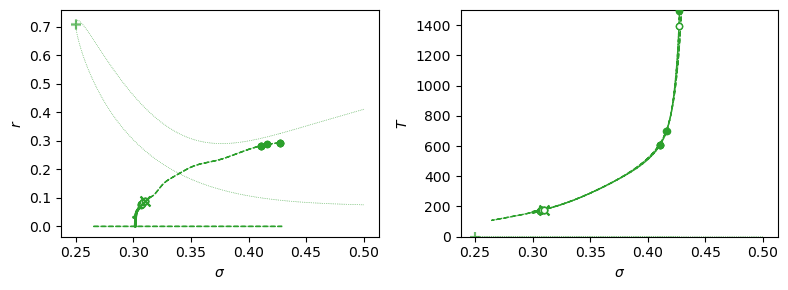

62


/tmp/ipykernel_87299/1565806137.py:110: UserWarning: loadtxt: input contained no data: "data/janus2/62/sw.dat"
  br=np.loadtxt(filebase+'%i/sw.dat'%(i))


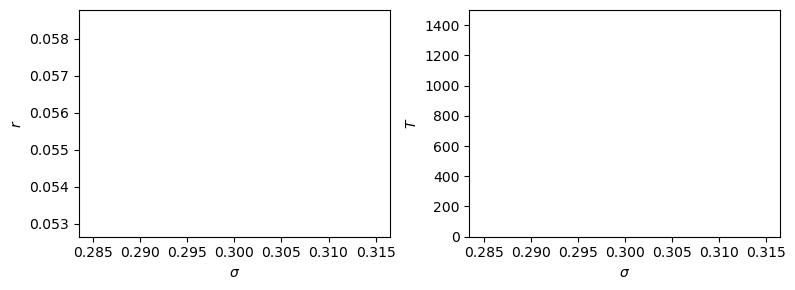

63


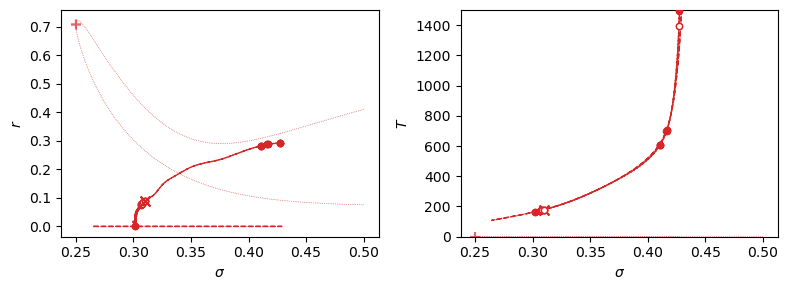

64


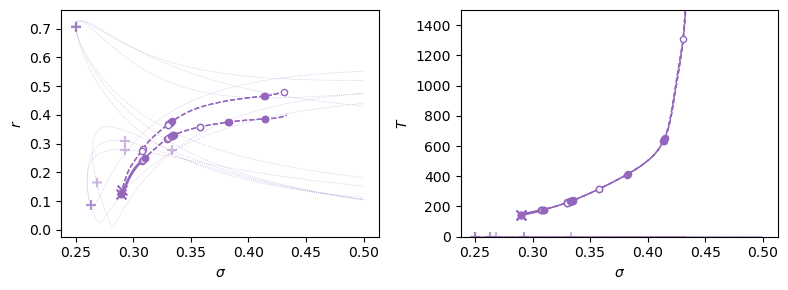

In [208]:
N=16
filebase='data/janus2/'
num_chimeras=np.count_nonzero([st.isdigit() for st in os.listdir(filebase)])

steadyalpha=0.25
for i in range(1,num_chimeras+1):
    plotted=False
    try:
        br=np.loadtxt(filebase+'%i/total.dat'%(i))
        if len(br)<=2:
            continue
        plotted=True
        plt.subplots(1,2,figsize=(8,3))
        print(i)

        stableinds=np.array(np.where(br[:,9]==4*N-2)[0])
        stablebranches=[]
        jumps=np.where(np.diff(stableinds)>1)[0]
        cuts=np.zeros(2+2*len(jumps),dtype=int)
        cuts[0]=0
        cuts[-1]=len(stableinds)
        cuts[1:-1:2]=jumps
        cuts[2:-1:2]=jumps+1
        for j in range(0,len(cuts),2):
            stablebranches=stablebranches+[stableinds[cuts[j]:cuts[j+1]+1]]

        smallinds=np.where(np.abs(br[:,8])<1.0)[0]
        jumps=np.where(np.diff(smallinds)>1)[0]
        cuts=np.zeros(2+2*len(jumps),dtype=int)
        cuts[0]=0
        cuts[-1]=len(smallinds)
        cuts[1:-1:2]=jumps
        cuts[2:-1:2]=jumps+1
        smallbranches=[]
        for j in range(0,len(cuts),2):
            smallbranches=smallbranches+[br[smallinds[cuts[j]:cuts[j+1]+1]]]
        sbps=[]
        for smallbr in smallbranches:
            inds=np.where(np.diff(np.sign(smallbr[:,8]))!=0)[0]
            sbps=sbps+[smallbr[inds]]
        sbps=np.concatenate(sbps,axis=0)

        smallinds=np.where(np.abs(br[:,5])<1.0)[0]
        jumps=np.where(np.diff(smallinds)>1)[0]
        cuts=np.zeros(2+2*len(jumps),dtype=int)
        cuts[0]=0
        cuts[-1]=len(smallinds)
        cuts[1:-1:2]=jumps
        cuts[2:-1:2]=jumps+1
        smallbranches=[]
        for j in range(0,len(cuts),2):
            smallbranches=smallbranches+[br[smallinds[cuts[j]:cuts[j+1]+1]]]
        lps=[]
        for smallbr in smallbranches:
            inds=np.where(np.diff(np.sign(smallbr[:,5]))!=0)[0]
            lps=lps+[smallbr[inds]]
        lps=np.concatenate(lps,axis=0)


        smallinds=np.where(np.abs(br[:,7])<1.0)[0]
        jumps=np.where(np.diff(smallinds)>1)[0]
        cuts=np.zeros(2+2*len(jumps),dtype=int)
        cuts[0]=0
        cuts[-1]=len(smallinds)
        cuts[1:-1:2]=jumps
        cuts[2:-1:2]=jumps+1
        smallbranches=[]
        for j in range(0,len(cuts),2):
            smallbranches=smallbranches+[br[smallinds[cuts[j]:cuts[j+1]+1]]]
        trs=[]
        for smallbr in smallbranches:
            inds=np.where(np.diff(np.sign(smallbr[:,7]))!=0)[0]
            trs=trs+[smallbr[inds]]
        trs=np.concatenate(trs,axis=0)

        
        plt.subplot(1,2,1)
        plt.plot(br[:,0],br[:,3],ls='--',c=colors[i%len(colors)],lw=1)
        for branch in stablebranches:
            plt.plot(br[branch,0],br[branch,3],c=colors[i%len(colors)],lw=2)
        for sbp in sbps:
            plt.scatter(sbp[0],sbp[3],c=colors[i%len(colors)],marker='x',s=50,zorder=6)
        for lp in lps:
            plt.scatter(lp[0],lp[3],edgecolor=colors[i%len(colors)],facecolor=colors[i%len(colors)],marker='o',s=20,zorder=5)
        for tr in trs:
            plt.scatter(tr[0],tr[3],facecolor='white',edgecolor=colors[i%len(colors)],marker='o',s=20,zorder=4)

        plt.xlabel(r'$\sigma$')
        plt.ylabel(r'$r$')
        
        plt.subplot(1,2,2)
        plt.plot(br[:,0],br[:,2],ls='--',c=colors[i%len(colors)],lw=1)
        for branch in stablebranches:
            plt.plot(br[branch,0],br[branch,2],c=colors[i%len(colors)],lw=2)
        for sbp in sbps:
            plt.scatter(sbp[0],sbp[2],c=colors[i%len(colors)],marker='x',s=50)
        for lp in lps:
            plt.scatter(lp[0],lp[2],edgecolor=colors[i%len(colors)],facecolor=colors[i%len(colors)],marker='o',s=20,zorder=5)
        for tr in trs:
            plt.scatter(tr[0],tr[2],facecolor='white',edgecolor=colors[i%len(colors)],marker='o',s=20,zorder=4)
            
        plt.ylim(0,1500)
        plt.xlabel(r'$\sigma$')
        plt.ylabel(r'$T$')
        
    except:
        pass
    
    try:
        br=np.loadtxt(filebase+'%i/sw.dat'%(i))
        if len(br)<=2:
            pass



        plt.subplot(1,2,1)
        plt.plot(br[:,0],br[:,3],ls='--',c=colors[i%len(colors)],lw=1)

        plt.xlabel(r'$\sigma$')
        plt.ylabel(r'$r$')
        
        plt.subplot(1,2,2)
        plt.plot(br[:,0],br[:,2],ls='--',c=colors[i%len(colors)],lw=1)
            
        plt.ylim(0,1500)
        plt.xlabel(r'$\sigma$')
        plt.ylabel(r'$T$')
        
    except:
        pass
        
    
    try:
        file=open(filebase+'%i/steadys/totalfwsteady.dat'%(i),'r')
        test=file.read().strip().split('\n')
        starts=np.concatenate([[0],1+np.where(np.array(test)=='')[0]])
        ends=np.concatenate([np.where(np.array(test)=='')[0],[-1]])

        branches=[]
        for j in range(len(starts)):
            branches=branches+[np.array([line.split() for line in test[starts[j]:ends[j]]],dtype=float)]
            
        file.close()
        for br in branches:
            stableinds=np.array(np.where(br[:,9]==4*N-2)[0])
            stablebranches=[]
            jumps=np.where(np.diff(stableinds)>1)[0]
            cuts=np.zeros(2+2*len(jumps),dtype=int)
            cuts[0]=0
            cuts[-1]=-1
            cuts[1:-1:2]=jumps
            cuts[2:-1:2]=jumps+1
            for j in range(0,len(cuts),2):
                stablebranches=stablebranches+[stableinds[cuts[j]:cuts[j+1]]]
            sbp=np.array(np.where(np.abs(np.diff(br[:,9]))>2)[0])
            plt.subplot(1,2,1)
            plt.plot(br[:,0],br[:,3],ls=':',c=colors[i%len(colors)],lw=0.5,alpha=steadyalpha)
            for branch in stablebranches:
                plt.plot(br[branch,0],br[branch,3],c=colors[i%len(colors)],lw=2,alpha=steadyalpha)
            for ind in sbp:
                plt.scatter(br[ind,0],br[ind,3],c=colors[i%len(colors)],marker='+',s=50,alpha=steadyalpha)

            plt.xlabel(r'$\sigma$')
            plt.ylabel(r'$r$')

            plt.subplot(1,2,2)
            plt.plot(br[:,0],0*br[:,2],ls=':',c=colors[i%len(colors)],lw=0.5,alpha=steadyalpha)
            for branch in stablebranches:
                plt.plot(br[branch,0],0*br[branch,2],c=colors[i%len(colors)],lw=2,alpha=steadyalpha)
            for ind in sbp:
                plt.scatter(br[ind,0],0*br[ind,2],c=colors[i%len(colors)],marker='+',s=50,alpha=steadyalpha)
            plt.xlabel(r'$\sigma$')
            plt.ylabel(r'$T$')
        
    except:
        pass

    
    try:
        file=open(filebase+'%i/steadys/totalrvsteady.dat'%(i),'r')
        test=file.read().strip().split('\n')
        starts=np.concatenate([[0],1+np.where(np.array(test)=='')[0]])
        ends=np.concatenate([np.where(np.array(test)=='')[0],[-1]])

        branches=[]
        for j in range(len(starts)):
            branches=branches+[np.array([line.split() for line in test[starts[j]:ends[j]]],dtype=float)]
            
        file.close()
        for br in branches:
            stableinds=np.array(np.where(br[:,9]==4*N-2)[0])
            stablebranches=[]
            jumps=np.where(np.diff(stableinds)>1)[0]
            cuts=np.zeros(2+2*len(jumps),dtype=int)
            cuts[0]=0
            cuts[-1]=-1
            cuts[1:-1:2]=jumps
            cuts[2:-1:2]=jumps+1
            for j in range(0,len(cuts),2):
                stablebranches=stablebranches+[stableinds[cuts[j]:cuts[j+1]]]
            sbp=np.array(np.where(np.abs(np.diff(br[:,9]))>2)[0])

            plt.subplot(1,2,1)
            plt.plot(br[:,0],br[:,3],ls=':',c=colors[i%len(colors)],lw=0.5,alpha=steadyalpha)
            for branch in stablebranches:
                plt.plot(br[branch,0],br[branch,3],c=colors[i%len(colors)],lw=2,alpha=steadyalpha)
            for ind in sbp:
                plt.scatter(br[ind,0],br[ind,3],c=colors[i%len(colors)],marker='+',s=50,alpha=steadyalpha)

            plt.xlabel(r'$\sigma$')
            plt.ylabel(r'$r$')


            plt.subplot(1,2,2)
            plt.plot(br[:,0],0*br[:,2],ls=':',c=colors[i%len(colors)],lw=0.5,alpha=steadyalpha)
            for branch in stablebranches:
                plt.plot(br[branch,0],0*br[branch,2],c=colors[i%len(colors)],lw=2,alpha=steadyalpha)
            for ind in sbp:
                plt.scatter(br[ind,0],0*br[ind,2],c=colors[i%len(colors)],marker='+',s=50,alpha=steadyalpha)
            plt.xlabel(r'$\sigma$')
            plt.ylabel(r'$T$')
        
    except:
        pass

    if plotted:
        plt.tight_layout()
        plt.savefig(filebase+'%i/branch.pdf'%(i))
        plt.show()
    

5


Text(0, 0.5, '$T$')

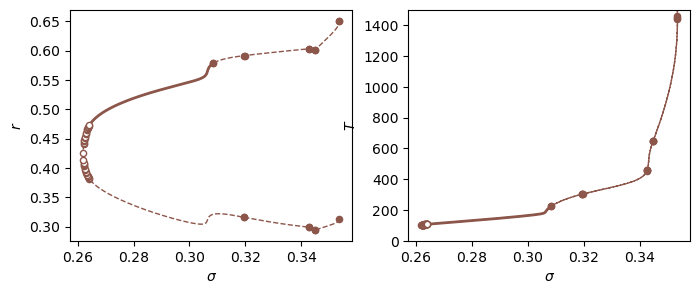

In [7]:
N=16
filebase='data/janus2/'
num_chimeras=np.count_nonzero([st.isdigit() for st in os.listdir(filebase)])

steadyalpha=0.25
i=5

br=np.loadtxt(filebase+'%i/total.dat'%(i))

plt.subplots(1,2,figsize=(8,3))
print(i)

stableinds=np.array(np.where(br[:,9]==4*N-2)[0])
stablebranches=[]
jumps=np.where(np.diff(stableinds)>1)[0]
cuts=np.zeros(2+2*len(jumps),dtype=int)
cuts[0]=0
cuts[-1]=len(stableinds)
cuts[1:-1:2]=jumps
cuts[2:-1:2]=jumps+1
for j in range(0,len(cuts),2):
    stablebranches=stablebranches+[stableinds[cuts[j]:cuts[j+1]+1]]

smallinds=np.where(np.abs(br[:,8])<0.9)[0]
jumps=np.where(np.diff(smallinds)>1)[0]
cuts=np.zeros(2+2*len(jumps),dtype=int)
cuts[0]=0
cuts[-1]=len(smallinds)
cuts[1:-1:2]=jumps
cuts[2:-1:2]=jumps+1
smallbranches=[]
for j in range(0,len(cuts),2):
    smallbranches=smallbranches+[br[smallinds[cuts[j]:cuts[j+1]+1]]]
sbps=[]
for smallbr in smallbranches:
    inds=np.where(np.diff(np.sign(smallbr[:,8]))!=0)[0]
    sbps=sbps+[smallbr[inds]]
sbps=np.concatenate(sbps,axis=0)

smallinds=np.where(np.abs(br[:,5])<1)[0]
jumps=np.where(np.diff(smallinds)>1)[0]
cuts=np.zeros(2+2*len(jumps),dtype=int)
cuts[0]=0
cuts[-1]=len(smallinds)
cuts[1:-1:2]=jumps
cuts[2:-1:2]=jumps+1
smallbranches=[]
for j in range(0,len(cuts),2):
    smallbranches=smallbranches+[br[smallinds[cuts[j]:cuts[j+1]+1]]]
lps=[]
for smallbr in smallbranches:
    inds=np.where(np.diff(np.sign(smallbr[:,5]))!=0)[0]
    lps=lps+[smallbr[inds]]
lps=np.concatenate(lps,axis=0)


smallinds=np.where(np.abs(br[:,7])<0.9)[0]
jumps=np.where(np.diff(smallinds)>1)[0]
cuts=np.zeros(2+2*len(jumps),dtype=int)
cuts[0]=0
cuts[-1]=len(smallinds)
cuts[1:-1:2]=jumps
cuts[2:-1:2]=jumps+1
smallbranches=[]
for j in range(0,len(cuts),2):
    smallbranches=smallbranches+[br[smallinds[cuts[j]:cuts[j+1]+1]]]
trs=[]
for smallbr in smallbranches:
    inds=np.where(np.diff(np.sign(smallbr[:,7]))!=0)[0]
    trs=trs+[smallbr[inds]]
trs=np.concatenate(trs,axis=0)



plt.subplot(1,2,1)
plt.plot(br[:,0],br[:,3],ls='--',c=colors[i%len(colors)],lw=1)
for branch in stablebranches:
    plt.plot(br[branch,0],br[branch,3],c=colors[i%len(colors)],lw=2)
for sbp in sbps:
    plt.scatter(sbp[0],sbp[3],c=colors[i%len(colors)],marker='x',s=50,zorder=6)
for lp in lps:
    plt.scatter(lp[0],lp[3],edgecolor=colors[i%len(colors)],facecolor=colors[i%len(colors)],marker='o',s=20,zorder=5)
for tr in trs:
    plt.scatter(tr[0],tr[3],facecolor='white',edgecolor=colors[i%len(colors)],marker='o',s=20,zorder=4)

plt.xlabel(r'$\sigma$')
plt.ylabel(r'$r$')

plt.subplot(1,2,2)
plt.plot(br[:,0],br[:,2],ls='--',c=colors[i%len(colors)],lw=1)
for branch in stablebranches:
    plt.plot(br[branch,0],br[branch,2],c=colors[i%len(colors)],lw=2)
for sbp in sbps:
    plt.scatter(sbp[0],sbp[2],c=colors[i%len(colors)],marker='x',s=50)
for lp in lps:
    plt.scatter(lp[0],lp[2],edgecolor=colors[i%len(colors)],facecolor=colors[i%len(colors)],marker='o',s=20,zorder=5)
for tr in trs:
    plt.scatter(tr[0],tr[2],facecolor='white',edgecolor=colors[i%len(colors)],marker='o',s=20,zorder=4)

plt.ylim(0,1500)
plt.xlabel(r'$\sigma$')
plt.ylabel(r'$T$')



In [8]:
lps

array([[ 3.53571450e-01,  5.56776436e+00,  1.44429081e+03,
         3.12385379e-01, -1.54954298e-04, -7.74801503e-05,
        -1.00000010e-02, -1.00000000e+00, -1.00000000e+00,
         3.60000000e+01,  1.76585123e-01,  1.66859557e-01],
       [ 3.44885873e-01,  5.56776436e+00,  6.48817584e+02,
         2.94503913e-01, -6.09349338e-01, -3.74979470e-01,
        -1.00000010e-02, -1.00000000e+00, -1.00000000e+00,
         3.60000000e+01,  1.71965336e-01,  1.86154564e-01],
       [ 3.44840351e-01,  5.56776436e+00,  6.46456484e+02,
         2.94454074e-01,  9.24409438e-01,  3.87230853e-01,
        -1.00000010e-02, -1.00000000e+00, -1.00000000e+00,
         3.50000000e+01,  1.71934591e-01,  1.86241755e-01],
       [ 3.42754686e-01,  5.56776436e+00,  4.57985903e+02,
         2.98826288e-01, -1.69015507e-01, -8.84164915e-02,
        -1.00000010e-02, -1.00000000e+00, -1.00000000e+00,
         3.50000000e+01,  1.64409846e-01,  1.85249196e-01],
       [ 3.42712748e-01,  5.56776436e+00,  4.5595439

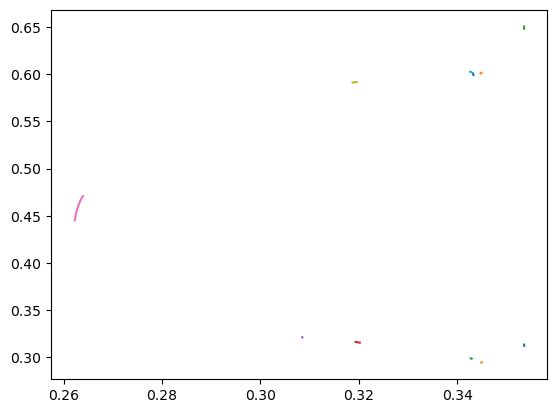

In [5]:
smallinds=np.where(np.abs(br[:,5])<0.9)[0]
jumps=np.where(np.diff(smallinds)>1)[0]
cuts=np.zeros(2+2*len(jumps),dtype=int)
cuts[0]=0
cuts[-1]=len(smallinds)
cuts[1:-1:2]=jumps
cuts[2:-1:2]=jumps+1
smallbranches=[]
for j in range(0,len(cuts),2):
    smallbranches=smallbranches+[br[smallinds[cuts[j]:cuts[j+1]+1]]]
lps=[]
for smallbr in smallbranches:
    inds=np.where(np.diff(np.sign(smallbr[:,5]))!=0)[0]
    lps=lps+[smallbr[inds]]
lps=np.concatenate(lps,axis=0)

for smallbr in smallbranches:
    plt.plot(smallbr[:,0],smallbr[:,3])

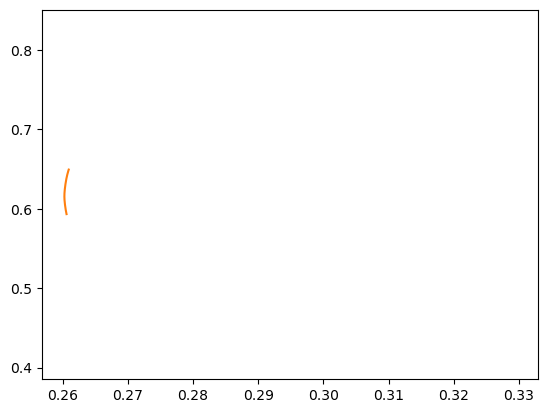

In [183]:
smallinds=np.where(np.abs(br[:,5])<5E-1)[0]
jumps=np.where(np.diff(smallinds)>1)[0]
cuts=np.zeros(2+2*len(jumps),dtype=int)
cuts[0]=0
cuts[-1]=len(smallinds)
cuts[1:-1:2]=jumps
cuts[2:-1:2]=jumps+1
smallbranches=[]
for j in range(0,len(cuts),2):
    smallbranches=smallbranches+[br[smallinds[cuts[j]:cuts[j+1]+1]]]
trs=[]
for smallbr in smallbranches:
    inds=np.where(np.diff(np.sign(smallbr[:,5]))!=0)[0]
    trs=trs+[smallbr[inds]]
    plt.plot(smallbr[:,0],smallbr[:,3])
trs=np.concatenate(trs,axis=0)



In [168]:
smallinds=np.where(np.abs(br[:,7])<2.5E-1)[0]
jumps=np.where(np.diff(smallinds)>1)[0]
cuts=np.zeros(2+2*len(jumps),dtype=int)
cuts[0]=0
cuts[-1]=len(smallinds)
cuts[1:-1:2]=jumps
cuts[2:-1:2]=jumps+1
smallbranches=[]
for j in range(0,len(cuts),2):
    smallbranches=smallbranches+[br[smallinds[cuts[j]:cuts[j+1]+1]]]
lps=[]
for smallbr in smallbranches:
    inds=np.where(np.diff(np.sign(smallbr[:,7]))!=0)[0]
    lps=lps+[smallbr[inds]]
lps=np.concatenate(lps,axis=0)


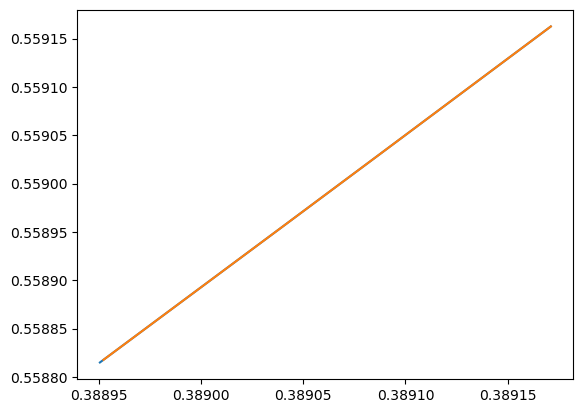

In [173]:
for smallbr in smallbranches:
    plt.plot(smallbr[:,0],smallbr[:,3])

time integration with auto

In [150]:
smallinds=np.where(np.abs(br[:,5])<2.5E-1)[0]

jumps=np.where(np.diff(smallinds)>1)[0]
cuts=np.zeros(2+2*len(jumps),dtype=int)
cuts[0]=0
cuts[-1]=len(smallinds)
cuts[1:-1:2]=jumps
cuts[2:-1:2]=jumps+1
smallbranches=[]
for j in range(0,len(cuts),2):
    smallbranches=smallbranches+[br[smallinds[cuts[j]:cuts[j+1]+1]]]
lps=[]
for smallbr in smallbranches:
    inds=np.where(np.diff(np.sign(smallbr[:,5]))!=0)[0]
    lps=lps+[smallbr[inds]]

In [147]:
smallinds=np.where(np.abs(br[:,7])<2.5E-1)[0]

jumps=np.where(np.diff(smallinds)>1)[0]
cuts=np.zeros(2+2*len(jumps),dtype=int)
cuts[0]=0
cuts[-1]=len(smallinds)
cuts[1:-1:2]=jumps
cuts[2:-1:2]=jumps+1
smallbranches=[]
for j in range(0,len(cuts),2):
    smallbranches=smallbranches+[br[smallinds[cuts[j]:cuts[j+1]+1]]]
trs=[]
for smallbr in smallbranches:
    inds=np.where(np.diff(np.sign(smallbr[:,7]))!=0)[0]
    trs=trs+[smallbr[inds]]

In [ ]:
smallinds=np.where(np.abs(br[:,7])<2.5E-1)[0]
plt.plot(br[smallinds,0],br[smallinds,7])

array([[ 3.88950372e-01,  5.56776436e+00,  3.91618565e+02,
         5.58814973e-01, -1.77920607e-01, -9.99999999e-01,
        -1.00000010e-02, -1.77920607e-01, -1.00000000e+00,
         6.20000000e+01,  3.69943250e-01,  3.42967871e-01],
       [ 3.89171153e-01,  5.56776436e+00,  3.94441259e+02,
         5.59162447e-01,  1.39064184e-01, -1.00000000e+00,
         1.00000010e-02,  1.39064184e-01, -1.00000000e+00,
         6.00000000e+01,  3.69700627e-01,  3.42762343e-01]])

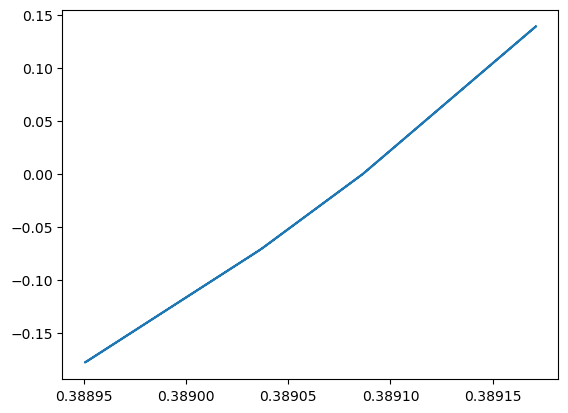

In [126]:
smallinds=np.where(np.abs(br[:,7])<2.5E-1)[0]
plt.plot(br[smallinds,0],br[smallinds,7])
smallinds=smallinds[np.concatenate([np.where(np.diff(smallinds)>1)[0],[-1]])]
trs=br[smallinds]
trs

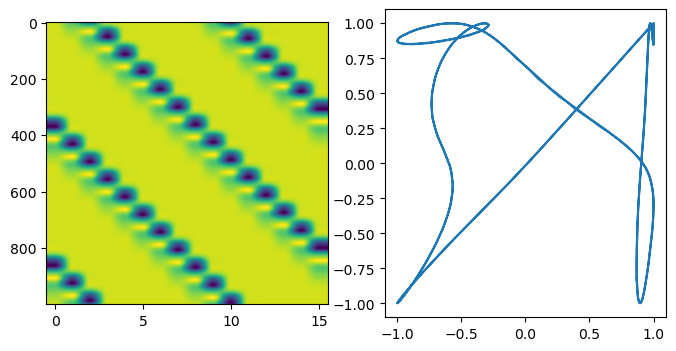

In [16]:
from scipy.interpolate import interp1d
N=16
filebases=['data/chimeras/time.dat']
for filebase in filebases:
    ti=np.loadtxt(filebase)[:,0]
    xi=np.loadtxt(filebase)[:,1:N]
    yi=np.loadtxt(filebase)[:,N:2*N-1]
    ui=np.loadtxt(filebase)[:,2*N-1:3*N-1]
    vi=np.loadtxt(filebase)[:,3*N-1:]

    phii=np.unwrap(np.arctan2(yi,xi),axis=0)
    phii=np.concatenate([np.zeros(ti.shape).reshape(-1,1),phii],axis=1)
    thetai=np.unwrap(np.arctan2(vi,ui),axis=0)
    Theta=1.0/(2*N)*(np.sum(thetai,axis=1)+np.sum(phii,axis=1))[:,np.newaxis]
    thetai=np.unwrap(np.mod(thetai-Theta+np.pi,2*np.pi)-np.pi,axis=0)
    phii=np.unwrap(np.mod(phii-Theta+np.pi,2*np.pi)-np.pi,axis=0)

    phif=interp1d(ti,phii.T)
    thetaf=interp1d(ti,phii.T)

    Nt=1000
    plt.subplots(1,2,figsize=(8,4))
    plt.subplot(1,2,1)
    plt.imshow(np.cos(phif(np.arange(Nt)/Nt*ti[-1])).T,aspect=N/Nt)
    plt.subplot(1,2,2)
    plt.plot(np.cos(phif(np.arange(Nt)/Nt*ti[-1])[1]-phif(np.arange(Nt)/Nt*ti[-1])[0]),np.cos(phif(np.arange(Nt)/Nt*ti[-1])[2]-phif(np.arange(Nt)/Nt*ti[-1])[0]))
    plt.show()

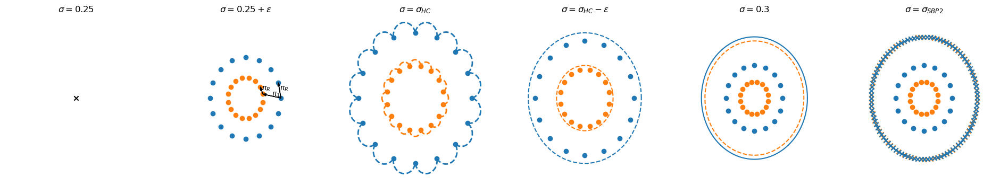

In [13]:
from matplotlib import patches
N=16

plt.subplots(1,6,figsize=(24,4))

plt.subplot(1,6,1)
plt.scatter([0],[0],marker='x',c='black')

ax=plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False) 
plt.tick_params(axis='y', which='both', left=False, labelleft=False) 

plt.xlim(-1,1)
plt.ylim(-1,1)
plt.title('$\sigma=0.25$')


plt.subplot(1,6,2)
pts1=0.5*np.array([np.cos(2*np.pi*np.arange(N)/N),np.sin(2*np.pi*np.arange(N)/N)])
plt.scatter(pts1[0],pts1[1])
pts2=0.5*np.array([0.5*np.cos(2*np.pi*np.arange(N)/N+np.pi/16),0.5*np.sin(2*np.pi*np.arange(N)/N+np.pi/16)])
plt.scatter(pts2[0],pts2[1])

plt.arrow(pts1[0][0],pts1[1][0],np.diff(pts1[0])[0],np.diff(pts1[1])[0],head_width=0.03,facecolor='black',length_includes_head=True)
plt.arrow(pts2[0][0],pts2[1][0],np.diff(pts2[0])[0],np.diff(pts2[1])[0],head_width=0.03,facecolor='black',length_includes_head=True)
plt.arrow(pts1[0][0],pts1[1][0],pts2[0][0]-pts1[0][0],pts2[1][0]-pts1[1][0],head_width=0.03,facecolor='black',length_includes_head=True)

ax=plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.gca().annotate('$\pi_R$',xy=np.mean(pts1[:,:2],axis=1))
plt.gca().annotate('$\pi_R$',xy=np.mean(pts2[:,:2],axis=1))
plt.gca().annotate('$\pi_1$',xy=np.mean([pts1[:,0],pts2[:,0]],axis=0))

plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False) 
plt.tick_params(axis='y', which='both', left=False, labelleft=False) 

plt.xlim(-1,1)
plt.ylim(-1,1)
plt.title('$\sigma=0.25+\epsilon$')


plt.subplot(1,6,3)

pts1=0.8*np.array([np.cos(2*np.pi*np.arange(N)/N),np.sin(2*np.pi*np.arange(N)/N)])
plt.scatter(pts1[0],pts1[1])
pts2=0.8*np.array([0.5*np.cos(2*np.pi*np.arange(N)/N+np.pi/16),0.5*np.sin(2*np.pi*np.arange(N)/N+np.pi/16)])
plt.scatter(pts2[0],pts2[1])

ax=plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

pts1=np.concatenate([pts1,pts1[:,:1]],axis=1)
pts2=np.concatenate([pts2,pts2[:,:1]],axis=1)

for i in range(N):
    xcenter,ycenter=np.mean(pts1[:,i:i+2],axis=1)
    dx,dy=pts1[:,i]-pts1[:,i+1]
    diameter=np.linalg.norm([dx,dy])
    theta=np.arctan2(dy,dx)*360/(2*np.pi)
    e1 = patches.Arc((xcenter, ycenter), diameter, diameter,angle=theta, linewidth=2,theta1=0,theta2=180, fill=False, zorder=2,ls='--',color=colors[2])
    ax.add_patch(e1)
    
    xcenter,ycenter=np.mean(pts2[:,i:i+2],axis=1)
    dx,dy=pts2[:,i]-pts2[:,i+1]
    diameter=np.linalg.norm([dx,dy])
    theta=np.arctan2(dy,dx)*360/(2*np.pi)
    e1 = patches.Arc((xcenter, ycenter), diameter, diameter,angle=theta, linewidth=2,theta1=0,theta2=180, fill=False, zorder=2,ls='--',color=colors[0])
    ax.add_patch(e1)


plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False) 
plt.tick_params(axis='y', which='both', left=False, labelleft=False) 

plt.xlim(-1,1)
plt.ylim(-1,1)
plt.title('$\sigma=\sigma_{HC}$')


plt.subplot(1,6,4)

pts1=0.7*np.array([np.cos(2*np.pi*np.arange(N)/N),np.sin(2*np.pi*np.arange(N)/N)])
plt.scatter(pts1[0],pts1[1])
pts2=0.7*np.array([0.5*np.cos(2*np.pi*np.arange(N)/N+np.pi/16),0.5*np.sin(2*np.pi*np.arange(N)/N+np.pi/16)])
plt.scatter(pts2[0],pts2[1])

ax=plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)


circ1=0.8*np.array([np.cos(2*np.pi*np.arange(101)/100),np.sin(2*np.pi*np.arange(101)/100)])
circ2=0.8*np.array([0.5*np.cos(2*np.pi*np.arange(101)/100+np.pi/16),0.5*np.sin(2*np.pi*np.arange(101)/100+np.pi/16)])
plt.plot(circ1[0],circ1[1],ls='--')
plt.plot(circ2[0],circ2[1],ls='--')


plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False) 
plt.tick_params(axis='y', which='both', left=False, labelleft=False) 

plt.xlim(-1,1)
plt.ylim(-1,1)
plt.title('$\sigma= \sigma_{HC}-\epsilon$')


plt.subplot(1,6,5)

pts1=0.4*np.array([np.cos(2*np.pi*np.arange(N)/N),np.sin(2*np.pi*np.arange(N)/N)])
plt.scatter(pts1[0],pts1[1])
pts2=0.4*np.array([0.5*np.cos(2*np.pi*np.arange(N)/N+np.pi/16),0.5*np.sin(2*np.pi*np.arange(N)/N+np.pi/16)])
plt.scatter(pts2[0],pts2[1])

ax=plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)


circ1=0.75*np.array([np.cos(2*np.pi*np.arange(101)/100),np.sin(2*np.pi*np.arange(101)/100)])
circ2=1.4*np.array([0.5*np.cos(2*np.pi*np.arange(101)/100+np.pi/16),0.5*np.sin(2*np.pi*np.arange(101)/100+np.pi/16)])
plt.plot(circ1[0],circ1[1],ls='-')
plt.plot(circ2[0],circ2[1],ls='--')


plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False) 
plt.tick_params(axis='y', which='both', left=False, labelleft=False) 

plt.xlim(-1,1)
plt.ylim(-1,1)
plt.title('$\sigma= 0.3$')

plt.subplot(1,6,6)

pts1=0.4*np.array([np.cos(2*np.pi*np.arange(N)/N),np.sin(2*np.pi*np.arange(N)/N)])
plt.scatter(pts1[0],pts1[1])
pts2=0.4*np.array([0.5*np.cos(2*np.pi*np.arange(N)/N+np.pi/16),0.5*np.sin(2*np.pi*np.arange(N)/N+np.pi/16)])
plt.scatter(pts2[0],pts2[1])

ax=plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)


circ1=0.75*np.array([np.cos(2*np.pi*np.arange(101)/100),np.sin(2*np.pi*np.arange(101)/100)])
circ2=1.5*np.array([0.5*np.cos(2*np.pi*np.arange(101)/100+np.pi/16),0.5*np.sin(2*np.pi*np.arange(101)/100+np.pi/16)])
plt.scatter(circ1[0],circ1[1],marker='x',color=colors[0])
plt.scatter(circ2[0],circ2[1],marker='x',color=colors[2])


plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False) 
plt.tick_params(axis='y', which='both', left=False, labelleft=False) 

plt.xlim(-1,1)
plt.ylim(-1,1)
plt.title('$\sigma= \sigma_{SBP2}$')


plt.savefig('schematic.pdf')
plt.show()
